In [1]:
import torch
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from torch import nn, optim
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import datetime
import os
import readligo as rl
from gwpy.timeseries import TimeSeries
import math
import random
from matplotlib.lines import Line2D

from scipy import integrate

In [1]:
epochs = 200
test_sample_ratio = .2
validation_sample_ratio = 0.1
input_vector_length = 200
batch_size = 32
num_bins = 40
coef_delta = 0

Setting global functions
---

In [3]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(201, 40),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(40, 201),
            nn.Tanh()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded

In [467]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(200, 40),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(40, 200),
            nn.Tanh()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded

In [4]:
def normalize(v):
    norm = np.linalg.norm(v)
    junk = 0
    if norm == 0: 
       return v, junk, norm
    return v / norm, junk, norm

def bunch_normalization(v_set):
    recover_min = list(range(len(v_set)))
    recover_coef = list(range(len(v_set)))
    v_set_normalized = np.zeros((v_set.shape[0], v_set.shape[1]))
    for i in range(len(v_set)):
        v_set_normalized[i], recover_min[i], recover_coef[i] = normalize(v_set[i])
    return v_set_normalized, recover_min, recover_coef

Introducing the data we used
---

### Loading the data from our white noise

In [5]:
data_for_training_and_testing_our = np.load("../Data_cached/4000Hz25msnoisesample1e6.npy")[200:-200].reshape(-1,200)

### Loading the data from TW mock data

In [177]:
data_for_training_and_testing_tw = np.load('E://GWNMMAD_data/Tw_dataset/Datasets/background.npz')['data'][:,0,:]

In [134]:
data_for_training_and_testing_tw = np.load('E://GWNMMAD_data/Tw_dataset/Datasets/background.npz')['data'][:,1,:]

### Loading the data from TW new generated noise dataset

In [177]:
data_for_training_and_testing_tw = np.load('../Data_cached/real_bkg_1e6_6000s_4000Hz_25ms_permutated.npz')['data_for_training_and_testing']

### Loading the bbh data from Chia-Jui pure bbh

In [59]:
data_bbh =  np.load('../Data_cached/pure_BBH_200_2det_aroundpeakvalue.npy')[:,0,:]

In [7]:
# data_bbh =  np.load('E://GWNMMAD_data/')

### Loading the bbh data from TW dataset

In [178]:
data_bbh =  np.load('E://GWNMMAD_data/Tw_dataset/Datasets/bbh_for_challenge.npy')[:,0,:]

In [135]:
data_bbh =  np.load('E://GWNMMAD_data/Tw_dataset/Datasets/bbh_for_challenge.npy')[:,1,:]

### Loading the SG data from TW dataset

In [179]:
data_sg = np.load('E://GWNMMAD_data/Tw_dataset/Datasets/sglf_for_challenge.npy')[:,0,:]

In [136]:
data_sg = np.load('E://GWNMMAD_data/Tw_dataset/Datasets/sglf_for_challenge.npy')[:,1,:]

### Loading the glitch data from Jiarui dataset

In [9]:
data_glitch = np.load('../Data_cached/real_glitches_snrlt8_4574_4000Hz_25ms.npz')['strain_time_data']

In [180]:
data_glitch = np.load('../Data_cached/real_glitches_snrlt5_60132_4000Hz_25ms.npz')['strain_time_data']

In [137]:
data_glitch = np.load('../Data_cached/real_glitches_H_snrlt5_59732_4000Hz_25ms.npz')['strain_time_data']

In [283]:
data_glitch = np.load('../Data_cached/real_glitches_9998_4000Hz_25ms.npz')

In [88]:
data_glitch_snr = data_glitch['snr_data'][np.argwhere(data_glitch['snr_data'] > 8)]

In [284]:
data_glitch = data_glitch['strain_time_data'][np.argwhere(data_glitch['snr_data'] > 8)]

In [63]:
data_glitch_snr.shape

NameError: name 'data_glitch_snr' is not defined

In [286]:
data_glitch = data_glitch.reshape(-1, 200)

In [181]:
data_glitch.shape

(60132, 200)

### Loading the indices that indicates anomaly from other datasets

In [18]:
indices = np.load('../Data_cached/id_for_outliner_for_BBH_in_FFT_study.npy')

Fine rescaling adjustment
---

In [7]:
data_for_training_and_testing_our = data_for_training_and_testing_our * 1e21

In [182]:
data_for_training_and_testing_tw = data_for_training_and_testing_tw / 20

In [42]:
data_for_training_and_testing_tw = data_for_training_and_testing_tw / 12.3

(array([0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        8.00000e+00, 9.90000e+01, 4.24000e+02, 1.51000e+03,
        4.16700e+03, 9.90200e+03, 2.09940e+04, 3.82300e+04,
        6.22510e+04, 8.62720e+04, 1.06820e+05, 1.18758e+05,
        1.17715e+05, 1.06500e+05, 8.73700e+04, 6.74940e+04,
        4.98090e+04, 3.59240e+04, 2.49650e+04, 1.69130e+04,
        1.18950e+04, 8.71800e+03, 6.41400e+03, 4.74100e+03,
        3.26700e+03, 2.29300e+03, 1.60600e+03, 1.11200e+03,
        7.45000e+02, 5.72000e+02, 4.39000e+02, 3.10000e+02,
        2.11000e+02, 1.37000e+02, 8.3000

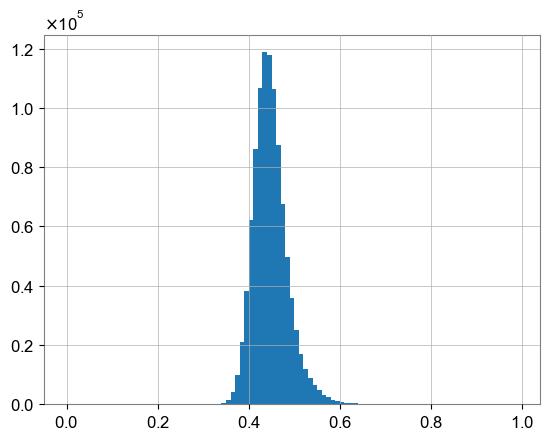

In [425]:
plt.hist(np.linalg.norm(data_for_training_and_testing_tw, axis = 1), bins = np.arange(0,1,0.01))

In [157]:
np.linalg.norm(data_for_training_and_testing_our, axis = 1).min()

0.3578175467551512

In [158]:
np.linalg.norm(data_for_training_and_testing_tw, axis = 1).min()

0.3507677005396066

In [150]:
np.linalg.norm(data_for_training_and_testing_our, axis = 1).mean()

0.46577945364407075

In [10]:
np.linalg.norm(data_for_training_and_testing_tw, axis = 1).mean()

0.4485562355092854

In [ ]:
rescale_factor_min = (np.linalg.norm(data_for_training_and_testing_tw, axis = 1).min() / np.linalg.norm(data_for_training_and_testing_our, axis = 1).min())

In [162]:
rescale_factor_mean = (np.linalg.norm(data_for_training_and_testing_tw, axis = 1).mean() / np.linalg.norm(data_for_training_and_testing_our, axis = 1).mean())

In [155]:
data_for_training_and_testing_tw_rescaled = data_for_training_and_testing_tw / (np.linalg.norm(data_for_training_and_testing_tw, axis = 1).min() / np.linalg.norm(data_for_training_and_testing_our, axis = 1).min())

In [163]:
data_for_training_and_testing_tw_rescaled_norm = data_for_training_and_testing_tw / rescale_factor_mean

In [159]:
np.linalg.norm(data_for_training_and_testing_tw_rescaled, axis = 1).min()

0.3578175467551512

Text(0.5, 1.0, 'Initial norm distribution for two bkg samples')

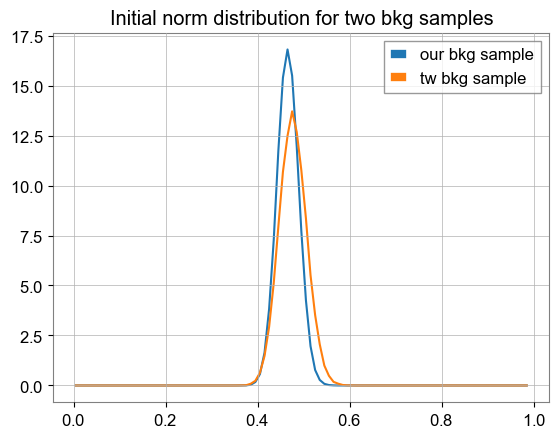

In [160]:
bin_scheme_norm = np.arange(0,1,0.01)

counts_noise_our, bin_position_noise_our = np.histogram(np.linalg.norm(data_for_training_and_testing_our, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_tw, bin_position_noise_tw = np.histogram(np.linalg.norm(data_for_training_and_testing_tw, axis = 1), bins = bin_scheme_norm, density = True)

bin_centers_our = (bin_position_noise_our[:-1] + bin_position_noise_our[1:]) / 2
bin_centers_tw = (bin_position_noise_tw[:-1] + bin_position_noise_tw[1:]) / 2

plt.plot(bin_centers_our, counts_noise_our, label = 'our bkg sample')
plt.plot(bin_centers_tw, counts_noise_tw, label = 'tw bkg sample')

plt.legend()
plt.title('Initial norm distribution for two bkg samples')


Text(0.5, 1.0, 'Norm distribution for two bkg samples, min norm aligned')

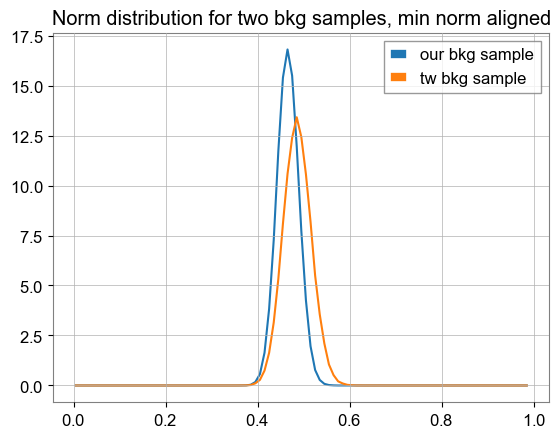

In [161]:
bin_scheme_norm = np.arange(0,1,0.01)

counts_noise_our, bin_position_noise_our = np.histogram(np.linalg.norm(data_for_training_and_testing_our, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_tw, bin_position_noise_tw = np.histogram(np.linalg.norm(data_for_training_and_testing_tw_rescaled, axis = 1), bins = bin_scheme_norm, density = True)

bin_centers_our = (bin_position_noise_our[:-1] + bin_position_noise_our[1:]) / 2
bin_centers_tw = (bin_position_noise_tw[:-1] + bin_position_noise_tw[1:]) / 2

plt.plot(bin_centers_our, counts_noise_our, label = 'our bkg sample')
plt.plot(bin_centers_tw, counts_noise_tw, label = 'tw bkg sample')

plt.legend()
plt.title('Norm distribution for two bkg samples, min norm aligned')


Text(0.5, 1.0, 'Norm distribution for two bkg samples, mean norm aligned')

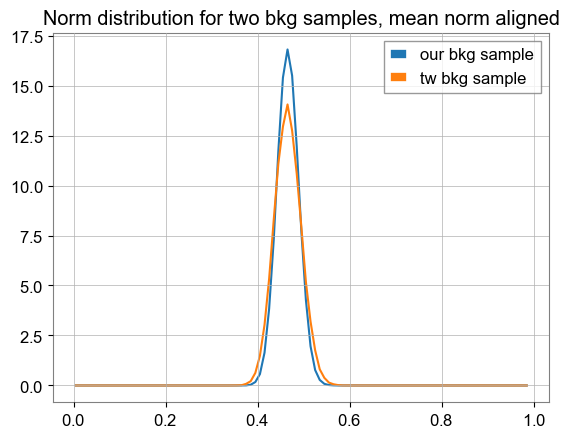

In [164]:
bin_scheme_norm = np.arange(0,1,0.01)

counts_noise_our, bin_position_noise_our = np.histogram(np.linalg.norm(data_for_training_and_testing_our, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_tw, bin_position_noise_tw = np.histogram(np.linalg.norm(data_for_training_and_testing_tw_rescaled_norm, axis = 1), bins = bin_scheme_norm, density = True)

bin_centers_our = (bin_position_noise_our[:-1] + bin_position_noise_our[1:]) / 2
bin_centers_tw = (bin_position_noise_tw[:-1] + bin_position_noise_tw[1:]) / 2

plt.plot(bin_centers_our, counts_noise_our, label = 'our bkg sample')
plt.plot(bin_centers_tw, counts_noise_tw, label = 'tw bkg sample')

plt.legend()
plt.title('Norm distribution for two bkg samples, mean norm aligned')


In [35]:
data_bbh = data_bbh / (2 * np.linalg.norm(data_bbh, axis = 1).mean())

In [183]:
data_bbh = data_bbh / 20

In [184]:
data_sg = data_sg / 20

In [185]:
data_glitch = data_glitch / 12.3

Checking the fine rescaleing adjustment
---

In [36]:
np.linalg.norm(data_bbh, axis = 1).mean()

0.5

(array([ 6., 11., 21., 38., 32., 49., 52., 53., 66., 76., 87.,
        75., 74., 80., 92., 64., 87., 90., 77., 96., 72., 75.,
        70., 66., 69., 80., 81., 87., 73., 79., 66., 71., 84.,
        64., 79., 56., 64., 63., 69., 54., 58., 69., 65., 42.,
        51., 50., 52., 48., 45., 39., 42., 51., 42., 45., 45.,
        52., 44., 43., 46., 29., 42., 26., 26., 33., 30., 41.,
        28., 28., 33., 18., 22., 26., 36., 25., 18., 23., 30.,
        15., 20., 22., 19., 20., 15., 25., 16., 21., 17., 13.,
        11., 17., 10., 21., 14., 22., 17., 17., 17., 14., 15.]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08,
        0.09, 0.1 , 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17,
        0.18, 0.19, 0.2 , 0.21, 0.22, 0.23, 0.24, 0.25, 0.26,
        0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33, 0.34, 0.35,
        0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
        0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53,
        0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.6

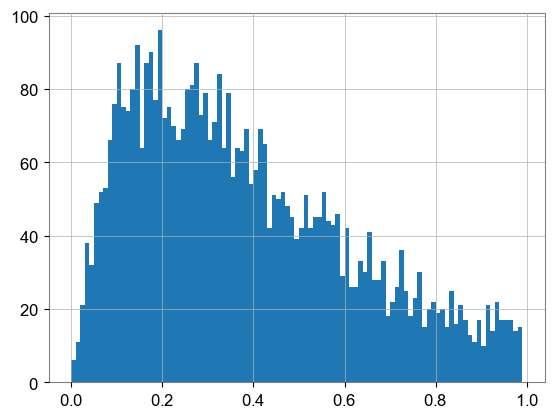

In [37]:
plt.hist(np.linalg.norm(data_bbh, axis = 1), bins = np.arange(0,1,0.01))

In [457]:
data_for_training_and_testing.shape

(100000, 200)

In [124]:
data_for_training_and_testing.shape

(100000, 200)

In [107]:
data_bbh.shape

(100000, 200)

(array([0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00,
        3.000e+00, 3.200e+01, 6.500e+01, 1.760e+02, 3.980e+02,
        7.960e+02, 1.378e+03, 2.218e+03, 3.011e+03, 3.949e+03,
        4.675e+03, 4.961e+03, 5.346e+03, 5.249e+03, 5.320e+03,
        5.344e+03, 4.971e+03, 4.759e+03, 4.578e+03, 4.375e+03,
        4.036e+03, 3.825e+03, 3.435e+03, 3.248e+03, 2.861e+03,
        2.591e+03, 2.345e+03, 2.219e+03, 1.868e+03, 1.860e+03,
        1.487e+03, 1.346e+03, 1.099e+03, 1.006e+03, 8.870e+02,
        7.930e+02, 6.320e+02, 5.370e+02, 4.390e+02, 3.660e+02,
        3.450e+02, 2.330e+02, 1.780e+02, 1.700e+02, 1.1

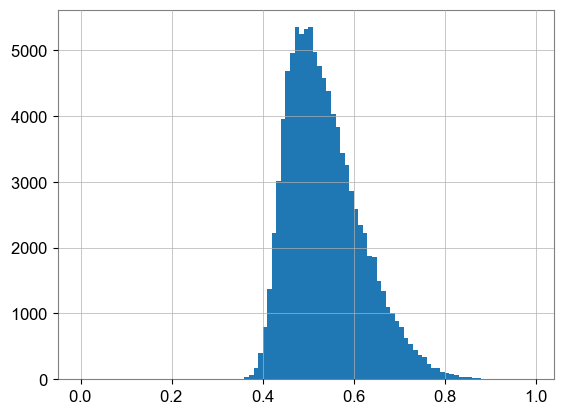

In [303]:
plt.hist(np.linalg.norm(data_sg, axis = 1), bins = np.arange(0,1,0.01))

(array([0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 2.000e+00,
        1.200e+01, 4.200e+01, 1.800e+02, 4.560e+02, 9.310e+02,
        1.823e+03, 2.885e+03, 4.339e+03, 5.980e+03, 7.184e+03,
        8.129e+03, 8.808e+03, 8.600e+03, 8.233e+03, 7.411e+03,
        6.689e+03, 5.759e+03, 4.714e+03, 3.987e+03, 3.195e+03,
        2.559e+03, 2.108e+03, 1.697e+03, 1.286e+03, 8.960e+02,
        6.610e+02, 4.760e+02, 3.090e+02, 2.470e+02, 1.210e+02,
        8.800e+01, 6.700e+01, 4.700e+01, 2.600e+01, 2.200e+01,
        7.000e+00, 3.000e+00, 5.000e+00, 5.000e+00, 4.000e+00,
        0.000e+00, 3.000e+00, 0.000e+00, 0.000e+00, 0.0

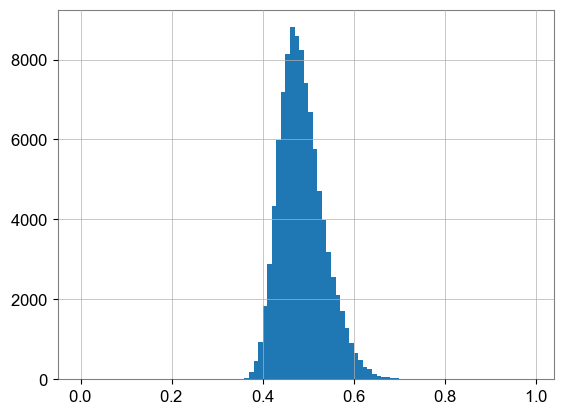

In [172]:
plt.hist(np.linalg.norm(data_bbh, axis = 1), bins = np.arange(0,1,0.01))

(array([0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 2.000e+00,
        1.200e+01, 4.200e+01, 1.800e+02, 4.560e+02, 9.310e+02,
        1.823e+03, 2.885e+03, 4.339e+03, 5.980e+03, 7.184e+03,
        8.129e+03, 8.808e+03, 8.600e+03, 8.233e+03, 7.411e+03,
        6.689e+03, 5.759e+03, 4.714e+03, 3.987e+03, 3.195e+03,
        2.559e+03, 2.108e+03, 1.697e+03, 1.286e+03, 8.960e+02,
        6.610e+02, 4.760e+02, 3.090e+02, 2.470e+02, 1.210e+02,
        8.800e+01, 6.700e+01, 4.700e+01, 2.600e+01, 2.200e+01,
        7.000e+00, 3.000e+00, 5.000e+00, 5.000e+00, 4.000e+00,
        0.000e+00, 3.000e+00, 0.000e+00, 0.000e+00, 0.0

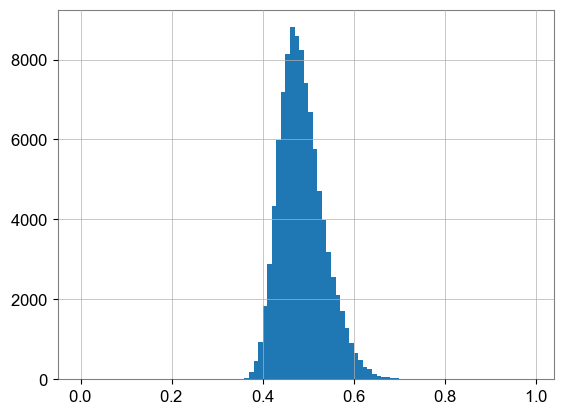

In [109]:
plt.hist(np.linalg.norm(data_bbh, axis = 1), bins = np.arange(0,1,0.01))

In [184]:
data_bbh_recover_coef - np.linalg.norm(data_bbh, axis = 1)

array([-0.01179475, -0.01144638, -0.01021021, ..., -0.01232375,
       -0.01124425, -0.01219914])

(array([0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 1.000e+01,
        3.700e+01, 1.610e+02, 4.330e+02, 9.010e+02, 1.833e+03,
        2.922e+03, 4.459e+03, 6.166e+03, 7.428e+03, 8.401e+03,
        9.056e+03, 8.699e+03, 8.379e+03, 7.441e+03, 6.639e+03,
        5.687e+03, 4.652e+03, 3.852e+03, 3.033e+03, 2.466e+03,
        2.043e+03, 1.563e+03, 1.153e+03, 8.120e+02, 5.930e+02,
        4.030e+02, 2.730e+02, 1.780e+02, 1.010e+02, 7.000e+01,
        5.600e+01, 3.800e+01, 2.700e+01, 9.000e+00, 4.000e+00,
        4.000e+00, 5.000e+00, 4.000e+00, 1.000e+00, 2.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.0

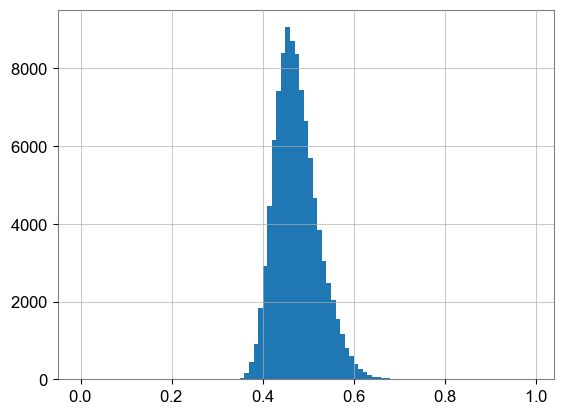

In [183]:
plt.hist(data_bbh_recover_coef, bins = np.arange(0,1,0.01))

In [23]:
np.linalg.norm(X_train, axis = 1)

array([1., 1., 1., ..., 1., 1., 1.])

Text(0.5, 1.0, 'Norm distribution for bkg sample and bbh sample')

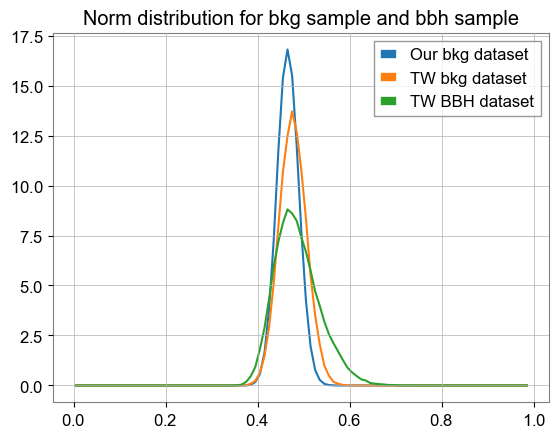

In [466]:
bin_scheme_norm = np.arange(0,1,0.01)

counts_noise_our, bin_position_noise_our = np.histogram(np.linalg.norm(data_for_training_and_testing_our, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_tw, bin_position_noise_tw = np.histogram(np.linalg.norm(data_for_training_and_testing_tw, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_bbh, bin_position_noise_bbh = np.histogram(np.linalg.norm(data_bbh, axis = 1), bins = bin_scheme_norm, density = True)

bin_centers_our = (bin_position_noise_our[:-1] + bin_position_noise_our[1:]) / 2
bin_centers_tw = (bin_position_noise_tw[:-1] + bin_position_noise_tw[1:]) / 2
bin_centers_bbh = (bin_position_noise_tw[:-1] + bin_position_noise_tw[1:]) / 2

plt.plot(bin_centers_our, counts_noise_our, label = 'Our bkg dataset')
plt.plot(bin_centers_tw, counts_noise_tw, label = 'TW bkg dataset')
plt.plot(bin_centers_bbh, counts_noise_bbh, label = 'TW BBH dataset')

plt.legend()
plt.title('Norm distribution for bkg sample and bbh sample')


Text(0.5, 1.0, 'Norm distribution for GWAK noise, BBH and SG sample')

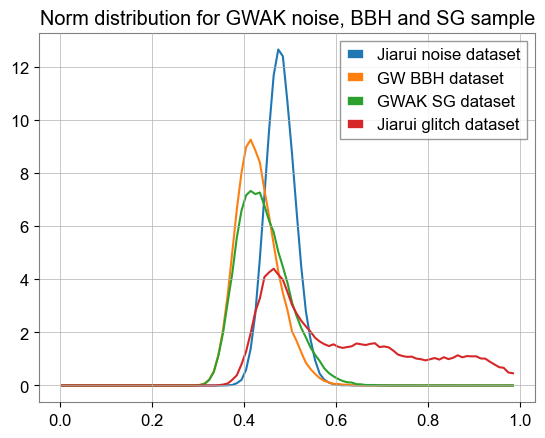

In [142]:
bin_scheme_norm = np.arange(0,1,0.01)

counts_noise_our, bin_position_noise_our = np.histogram(np.linalg.norm(data_for_training_and_testing_tw, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_tw, bin_position_noise_tw = np.histogram(np.linalg.norm(data_bbh, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_bbh, bin_position_noise_bbh = np.histogram(np.linalg.norm(data_sg, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_glitch, bin_position_noise_glitch = np.histogram(np.linalg.norm(data_glitch, axis = 1), bins = bin_scheme_norm, density = True)

bin_centers_our = (bin_position_noise_our[:-1] + bin_position_noise_our[1:]) / 2
bin_centers_tw = (bin_position_noise_tw[:-1] + bin_position_noise_tw[1:]) / 2
bin_centers_bbh = (bin_position_noise_bbh[:-1] + bin_position_noise_bbh[1:]) / 2
bin_centers_glitch = (bin_position_noise_glitch[:-1] + bin_position_noise_glitch[1:]) / 2


plt.plot(bin_centers_our, counts_noise_our, label = 'Jiarui noise dataset')
plt.plot(bin_centers_tw, counts_noise_tw, label = 'GW BBH dataset')
plt.plot(bin_centers_bbh, counts_noise_bbh, label = 'GWAK SG dataset')
plt.plot(bin_centers_glitch, counts_noise_glitch, label = 'Jiarui glitch dataset')

plt.legend()
plt.title('Norm distribution for GWAK noise, BBH and SG sample')


Text(0.5, 1.0, 'Norm distribution for GWAK noise, BBH and SG sample')

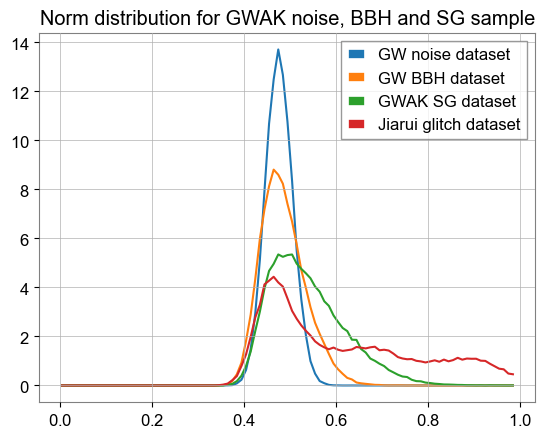

In [69]:
bin_scheme_norm = np.arange(0,1,0.01)

counts_noise_our, bin_position_noise_our = np.histogram(np.linalg.norm(data_for_training_and_testing_tw, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_tw, bin_position_noise_tw = np.histogram(np.linalg.norm(data_bbh, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_bbh, bin_position_noise_bbh = np.histogram(np.linalg.norm(data_sg, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_glitch, bin_position_noise_glitch = np.histogram(np.linalg.norm(data_glitch, axis = 1), bins = bin_scheme_norm, density = True)

bin_centers_our = (bin_position_noise_our[:-1] + bin_position_noise_our[1:]) / 2
bin_centers_tw = (bin_position_noise_tw[:-1] + bin_position_noise_tw[1:]) / 2
bin_centers_bbh = (bin_position_noise_bbh[:-1] + bin_position_noise_bbh[1:]) / 2
bin_centers_glitch = (bin_position_noise_glitch[:-1] + bin_position_noise_glitch[1:]) / 2


plt.plot(bin_centers_our, counts_noise_our, label = 'GW noise dataset')
plt.plot(bin_centers_tw, counts_noise_tw, label = 'GW BBH dataset')
plt.plot(bin_centers_bbh, counts_noise_bbh, label = 'GWAK SG dataset')
plt.plot(bin_centers_glitch, counts_noise_glitch, label = 'Jiarui glitch dataset')

plt.legend()
plt.title('Norm distribution for GWAK noise, BBH and SG sample')


Text(0.5, 1.0, 'Norm distribution for GWAK noise, BBH and SG sample')

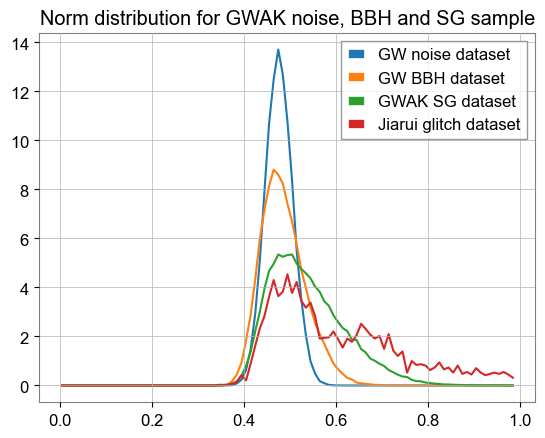

In [337]:
bin_scheme_norm = np.arange(0,1,0.01)

counts_noise_our, bin_position_noise_our = np.histogram(np.linalg.norm(data_for_training_and_testing_tw, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_tw, bin_position_noise_tw = np.histogram(np.linalg.norm(data_bbh, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_bbh, bin_position_noise_bbh = np.histogram(np.linalg.norm(data_sg, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_glitch, bin_position_noise_glitch = np.histogram(np.linalg.norm(data_glitch, axis = 1), bins = bin_scheme_norm, density = True)

bin_centers_our = (bin_position_noise_our[:-1] + bin_position_noise_our[1:]) / 2
bin_centers_tw = (bin_position_noise_tw[:-1] + bin_position_noise_tw[1:]) / 2
bin_centers_bbh = (bin_position_noise_bbh[:-1] + bin_position_noise_bbh[1:]) / 2
bin_centers_glitch = (bin_position_noise_glitch[:-1] + bin_position_noise_glitch[1:]) / 2


plt.plot(bin_centers_our, counts_noise_our, label = 'GW noise dataset')
plt.plot(bin_centers_tw, counts_noise_tw, label = 'GW BBH dataset')
plt.plot(bin_centers_bbh, counts_noise_bbh, label = 'GWAK SG dataset')
plt.plot(bin_centers_glitch, counts_noise_glitch, label = 'Jiarui glitch dataset')

plt.legend()
plt.title('Norm distribution for GWAK noise, BBH and SG sample')


Package the data
---

In [292]:
data_for_training_and_testing_our.shape

NameError: name 'data_for_training_and_testing_our' is not defined

In [293]:
data_for_training_and_testing_tw.shape

(100000, 200)

(array([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 2.0000e+00,
        6.0000e+00, 1.4000e+01, 8.6000e+01, 2.3300e+02,
        6.3300e+02, 1.4760e+03, 2.9360e+03, 5.1180e+03,
        7.9310e+03, 1.0683e+04, 1.2485e+04, 1.3710e+04,
        1.2675e+04, 1.0765e+04, 8.3540e+03, 5.5110e+03,
        3.5190e+03, 2.0600e+03, 9.9500e+02, 4.8400e+02,
        1.8100e+02, 9.2000e+01, 2.5000e+01, 7.0000e+00,
        4.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00,
        0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 1.0000e+00, 0.00

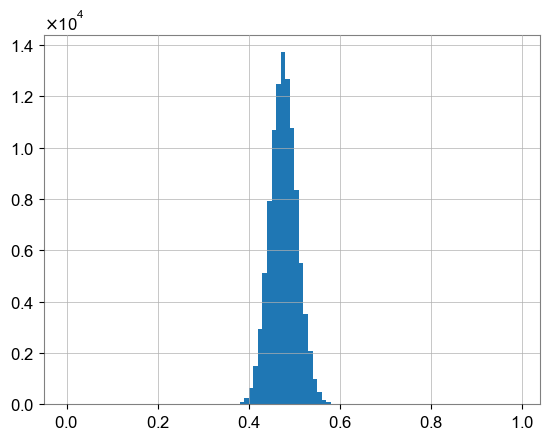

In [220]:
plt.hist(np.linalg.norm(data_for_training_and_testing_tw, axis = 1), bins = np.arange(0,1,0.01))

(array([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 2.0000e+00,
        6.0000e+00, 1.4000e+01, 8.6000e+01, 2.3300e+02,
        6.3300e+02, 1.4760e+03, 2.9360e+03, 5.1180e+03,
        7.9310e+03, 1.0683e+04, 1.2485e+04, 1.3710e+04,
        1.2675e+04, 1.0765e+04, 8.3540e+03, 5.5110e+03,
        3.5190e+03, 2.0600e+03, 9.9500e+02, 4.8400e+02,
        1.8100e+02, 9.2000e+01, 2.5000e+01, 7.0000e+00,
        4.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00,
        0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 1.0000e+00, 0.00

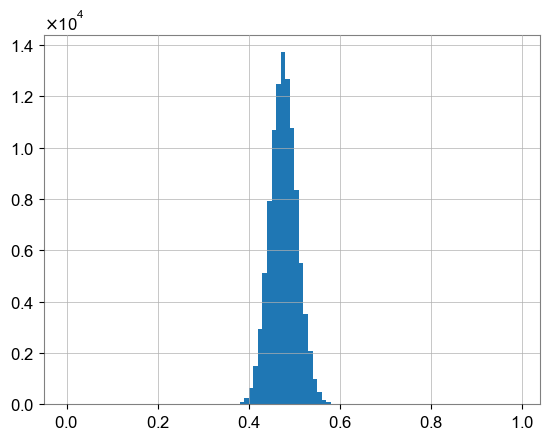

In [199]:
plt.hist(np.linalg.norm(data_for_training_and_testing_tw, axis = 1), bins = np.arange(0,1,0.01))

In [11]:
total_sample_number = data_for_training_and_testing_our.shape[0]
test_sample_number = int(test_sample_ratio * total_sample_number)
validation_sample_number = int(validation_sample_ratio * total_sample_number)
train_sample_number = total_sample_number - test_sample_number - validation_sample_number


X_train_ini = data_for_training_and_testing_our[0:train_sample_number].copy()
X_test_ini = data_for_training_and_testing_our[-test_sample_number:].copy()
X_validation_ini = data_for_training_and_testing_our[train_sample_number:-test_sample_number].copy()

In [186]:
total_sample_number = data_for_training_and_testing_tw.shape[0]
test_sample_number = int(test_sample_ratio * total_sample_number)
validation_sample_number = int(validation_sample_ratio * total_sample_number)
train_sample_number = total_sample_number - test_sample_number - validation_sample_number


X_train_ini = data_for_training_and_testing_tw[0:train_sample_number].copy()
X_test_ini = data_for_training_and_testing_tw[-test_sample_number:].copy()
X_validation_ini = data_for_training_and_testing_tw[train_sample_number:-test_sample_number].copy()

In [165]:
total_sample_number = data_for_training_and_testing_tw_rescaled_norm.shape[0]
test_sample_number = int(test_sample_ratio * total_sample_number)
validation_sample_number = int(validation_sample_ratio * total_sample_number)
train_sample_number = total_sample_number - test_sample_number - validation_sample_number


X_train_ini = data_for_training_and_testing_tw_rescaled_norm[0:train_sample_number].copy()
X_test_ini = data_for_training_and_testing_tw_rescaled_norm[-test_sample_number:].copy()
X_validation_ini = data_for_training_and_testing_tw_rescaled_norm[train_sample_number:-test_sample_number].copy()

In [187]:
X_train, _, X_train_recover_coef = bunch_normalization(X_train_ini)
X_test,_ ,X_test_recover_coef = bunch_normalization(X_test_ini)
X_validation,_ ,X_validation_recover_coef = bunch_normalization(X_validation_ini)

(array([0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 6.000e+00, 1.300e+01, 6.000e+01, 1.710e+02,
        4.120e+02, 1.027e+03, 2.071e+03, 3.589e+03, 5.523e+03,
        7.502e+03, 8.714e+03, 9.638e+03, 8.856e+03, 7.604e+03,
        5.831e+03, 3.829e+03, 2.433e+03, 1.430e+03, 7.340e+02,
        3.380e+02, 1.240e+02, 6.400e+01, 1.600e+01, 4.000e+00,
        3.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.0

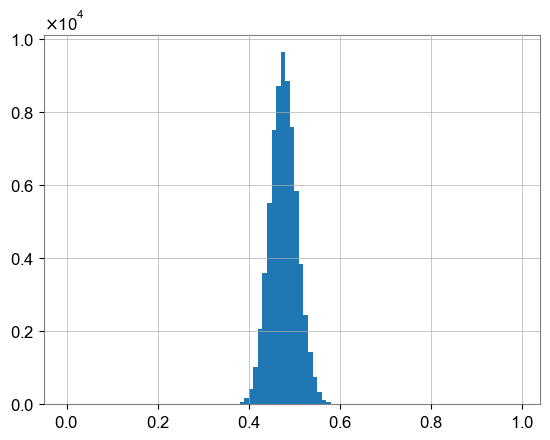

In [13]:
plt.hist(X_train[:,-1], bins = np.arange(0,1,0.01))

In [188]:
X_train = np.hstack((X_train, np.array(X_train_recover_coef).reshape(train_sample_number,1)))
X_validation = np.hstack((X_validation, np.array(X_validation_recover_coef).reshape(validation_sample_number,1)))
X_test = np.hstack((X_test, np.array(X_test_recover_coef).reshape(test_sample_number,1)))

In [189]:
trainData = torch.FloatTensor(X_train)
testData = torch.FloatTensor(X_test)
validationData = torch.FloatTensor(X_validation)

In [305]:
data_bbh_normalized, _, data_bbh_recover_coef = bunch_normalization(data_bbh / rescale_factor_mean)

NameError: name 'rescale_factor_mean' is not defined

In [190]:
data_bbh_normalized, _, data_bbh_recover_coef = bunch_normalization(data_bbh)

In [191]:
data_bbh_normalized = np.hstack((data_bbh_normalized, np.array(data_bbh_recover_coef).reshape(-1,1)))

In [192]:
bbhData = torch.FloatTensor(data_bbh_normalized)

In [75]:
data_sg_normalized, _, data_sg_recover_coef = bunch_normalization(data_sg / rescale_factor_mean)

NameError: name 'rescale_factor_mean' is not defined

In [193]:
data_sg_normalized, _, data_sg_recover_coef = bunch_normalization(data_sg)

In [194]:
data_sg_normalized = np.hstack((data_sg_normalized, np.array(data_sg_recover_coef).reshape(-1,1)))

In [195]:
sgData = torch.FloatTensor(data_sg_normalized)

In [196]:
data_glitch_normalized, _, data_glitch_recover_coef = bunch_normalization(data_glitch)
data_glitch_normalized = np.hstack((data_glitch_normalized, np.array(data_glitch_recover_coef).reshape(-1,1)))
glitchData = torch.FloatTensor(data_glitch_normalized)

In [401]:
X_test.shape

(20000, 201)

In [161]:
data_glitch_normalized.shape

(59732, 201)

In [197]:
glitch_chosen_indices = np.random.choice(len(data_glitch_normalized), size = int(1e-3 * len(X_test)), replace = False)

In [198]:
data_noise_real_case = np.vstack((X_test, data_glitch_normalized[glitch_chosen_indices]))
data_noise_real_case_permutated_indices = np.random.choice(len(data_noise_real_case), size = len(data_noise_real_case), replace=False)
noiseData = torch.FloatTensor(data_noise_real_case[data_noise_real_case_permutated_indices])

In [199]:
noiseData.shape

torch.Size([20020, 201])

In [200]:
glitchinnoiseData = torch.FloatTensor(data_glitch_normalized[glitch_chosen_indices])

In [201]:
glitchinnoiseData.shape

torch.Size([20, 201])

In [359]:
injection_number = 100

# indices_for_glitch_injection = np.random.choice(len(data_glitch_normalized),size = injection_number, replace = False)
indices_for_glitch_injection = np.arange(injection_number)
indices_for_glitch_not_injected = np.setdiff1d(np.arange(len(data_glitch_normalized)), indices_for_glitch_injection)

X_train = np.vstack((X_train, data_glitch_normalized[indices_for_glitch_injection[:int(0.7 * injection_number)]]))
X_test = np.vstack((X_test, data_glitch_normalized[indices_for_glitch_injection[-int(0.8 * injection_number):]]))
X_validation = np.vstack((X_validation, data_glitch_normalized[indices_for_glitch_injection[int(0.7 * injection_number):int(0.8 * injection_number)]]))

np.random.shuffle(X_train)
np.random.shuffle(X_test)
np.random.shuffle(X_validation)

trainData = torch.FloatTensor(X_train)
testData = torch.FloatTensor(X_test)
validationData = torch.FloatTensor(X_validation)

glitchData = torch.FloatTensor(data_glitch_normalized[indices_for_glitch_not_injected])

In [25]:
trainData.shape

torch.Size([700000, 201])

In [312]:
trainData_ini = trainData.clone()
testData_ini = testData.clone()
bbhData_ini = bbhData.clone()
sgData_ini = sgData.clone()
glitchData_ini = glitchData.clone()

In [161]:
glitchData_ini = glitchData.clone()

Training the Model and model save and load
---

In [55]:
train_dataset = TensorDataset(trainData, trainData)
test_dataset = TensorDataset(testData, testData)
validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = AutoEncoder().cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.MSELoss().cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        encoded, decoded = autoencoder(x)
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded, x)
        loss_norm = loss_func(decoded[:, -1], x[:, -1])
        weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        for batchidx, (x, _) in enumerate(validationDataLoader):
            x = x.cuda()
            encoded, decoded = autoencoder(x)
            lossVal_overall = loss_func(decoded, x)
            lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
            lossVal = lossVal_overall + lossVal_norm * coef_delta
            val_loss += lossVal.item()

        val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    loss_validation[epoch,0] = val_loss
    print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))

Epoch: 0001, Training loss=0.00292952, Validation loss=0.00293366
Epoch: 0002, Training loss=0.00290903, Validation loss=0.00282753
Epoch: 0003, Training loss=0.00275998, Validation loss=0.00278736
Epoch: 0004, Training loss=0.00275470, Validation loss=0.00276687
Epoch: 0005, Training loss=0.00282778, Validation loss=0.00275527
Epoch: 0006, Training loss=0.00271862, Validation loss=0.00274889
Epoch: 0007, Training loss=0.00272670, Validation loss=0.00274429
Epoch: 0008, Training loss=0.00277220, Validation loss=0.00274069
Epoch: 0009, Training loss=0.00277452, Validation loss=0.00273839


In [ ]:
torch.save(autoencoder.cpu(), '../Model_cached/model_201-40-201_0_Jiaruiset_1e6_permutated.pt')

In [ ]:
autoencoder = autoencoder.cpu()

In [176]:
autoencoder = torch.load('../Model_cached/model_201-40-201_0_GWAK_set_0.034glitch_new_new.pt')

Bunch-training
---

In [81]:
omega_list = np.array([0.1, 1, 10, 100, 1000])

In [118]:
for omega in omega_list:

    train_dataset = TensorDataset(trainData, trainData)
    test_dataset = TensorDataset(testData, testData)
    validation_dataset = TensorDataset(validationData, validationData)

    trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
    validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


    autoencoder = AutoEncoder().cuda()
    optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
    loss_func = nn.MSELoss().cuda()
    loss_train = np.zeros((epochs, 1))
    loss_validation = np.zeros((epochs, 1))


    for epoch in range(epochs):
        # 训练阶段
        autoencoder.train()
        for batchidx, (x, _) in enumerate(trainDataLoader):
            x = x.cuda()
            encoded, decoded = autoencoder(x)
            # weighted_lossTrain = loss_func(decoded, x)
            loss_overall = loss_func(decoded, x)
            loss_norm = loss_func(decoded[:, -1], x[:, -1])
            weighted_lossTrain = loss_overall + loss_norm * omega
            
            # output_norm = torch.norm(decoded[:, :100], dim=1) 
            # penalty_term = torch.mean((output_norm - 1) ** 2) 
            # weighted_lossTrain = lossTrain + coef_delta * penalty_term
            
            optimizer.zero_grad()
            weighted_lossTrain.backward()
            optimizer.step()

        # 验证阶段
        autoencoder.eval()
        with torch.no_grad():
            val_loss = 0
            for batchidx, (x, _) in enumerate(validationDataLoader):
                x = x.cuda()
                encoded, decoded = autoencoder(x)
                lossVal_overall = loss_func(decoded, x)
                lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
                lossVal = lossVal_overall + lossVal_norm * omega
                val_loss += lossVal.item()

            val_loss /= len(validationDataLoader)
        
        loss_train[epoch,0] = weighted_lossTrain.item()
        loss_validation[epoch,0] = val_loss
        print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))


    torch.save(autoencoder.cpu(), '../Model_cached/model_201-40-201_' + str(omega) + '_first1e5.pt')


Epoch: 0200, Training loss=0.00381984, Validation loss=0.00397885
Epoch: 0200, Training loss=0.00387495, Validation loss=0.00398262
Epoch: 0200, Training loss=0.00399463, Validation loss=0.00398560
Epoch: 0200, Training loss=0.00401972, Validation loss=0.00402414
Epoch: 0200, Training loss=0.00463749, Validation loss=0.00450423


### For glitch research

torch.Size([70000, 201])
torch.Size([4574, 201])
Epoch: 0001, Training loss=0.00435914, Validation loss=0.00438756
Epoch: 0002, Training loss=0.00380904, Validation loss=0.00383464
Epoch: 0003, Training loss=0.00363923, Validation loss=0.00359854
Epoch: 0004, Training loss=0.00347666, Validation loss=0.00348087
Epoch: 0005, Training loss=0.00337267, Validation loss=0.00340442
Epoch: 0006, Training loss=0.00344834, Validation loss=0.00334887
Epoch: 0007, Training loss=0.00329848, Validation loss=0.00330728
Epoch: 0008, Training loss=0.00324387, Validation loss=0.00327318
Epoch: 0009, Training loss=0.00323101, Validation loss=0.00324524
Epoch: 0010, Training loss=0.00313122, Validation loss=0.00322223
Epoch: 0011, Training loss=0.00324493, Validation loss=0.00320253
Epoch: 0012, Training loss=0.00320959, Validation loss=0.00318497
Epoch: 0013, Training loss=0.00312131, Validation loss=0.00317079
Epoch: 0014, Training loss=0.00314619, Validation loss=0.00315713
Epoch: 0015, Training loss=

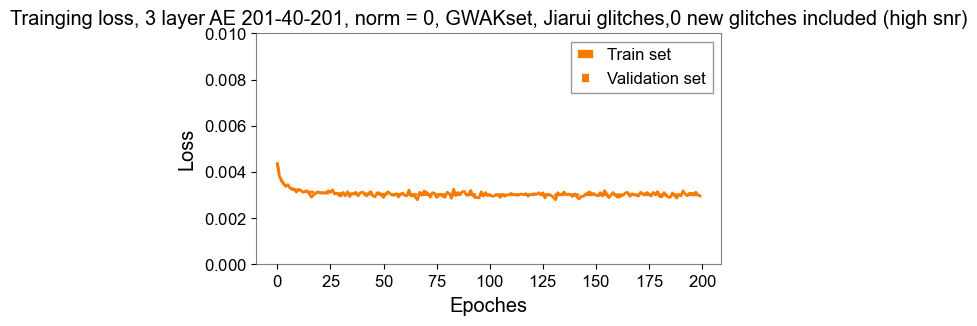

torch.Size([72100, 201])
torch.Size([1574, 201])
Epoch: 0001, Training loss=0.00434704, Validation loss=0.03231949
Epoch: 0002, Training loss=0.00386545, Validation loss=0.03175016
Epoch: 0003, Training loss=0.00350478, Validation loss=0.03153397
Epoch: 0004, Training loss=0.00337977, Validation loss=0.03141720
Epoch: 0005, Training loss=0.00367321, Validation loss=0.03133308
Epoch: 0006, Training loss=0.00334401, Validation loss=0.03127360
Epoch: 0007, Training loss=0.00330200, Validation loss=0.03122396
Epoch: 0008, Training loss=0.00341813, Validation loss=0.03118280
Epoch: 0009, Training loss=0.00326077, Validation loss=0.03114837
Epoch: 0010, Training loss=0.00304715, Validation loss=0.03111880
Epoch: 0011, Training loss=0.00326531, Validation loss=0.03109340
Epoch: 0012, Training loss=0.00332457, Validation loss=0.03107156
Epoch: 0013, Training loss=0.00339997, Validation loss=0.03105317
Epoch: 0014, Training loss=0.00323703, Validation loss=0.03103726
Epoch: 0015, Training loss=

<Figure size 640x480 with 0 Axes>

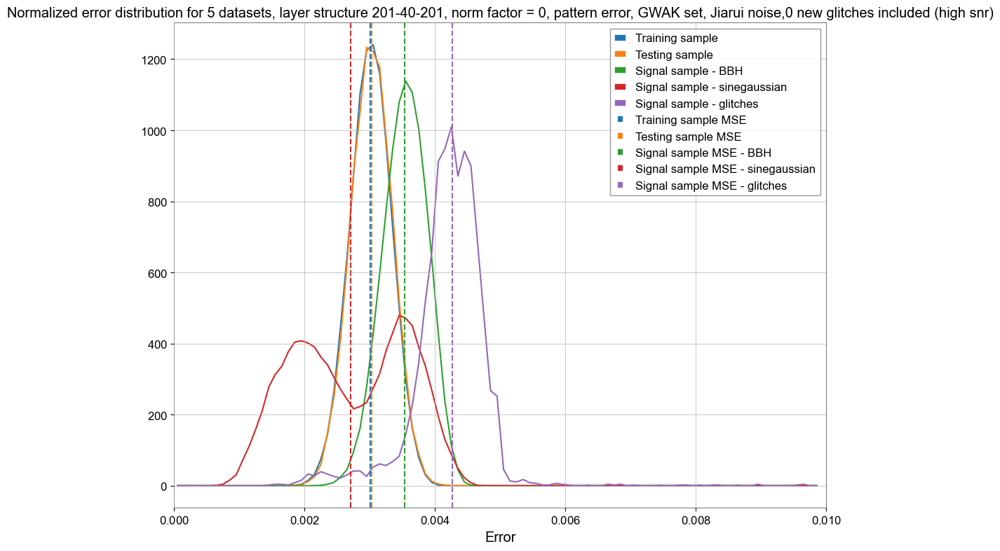

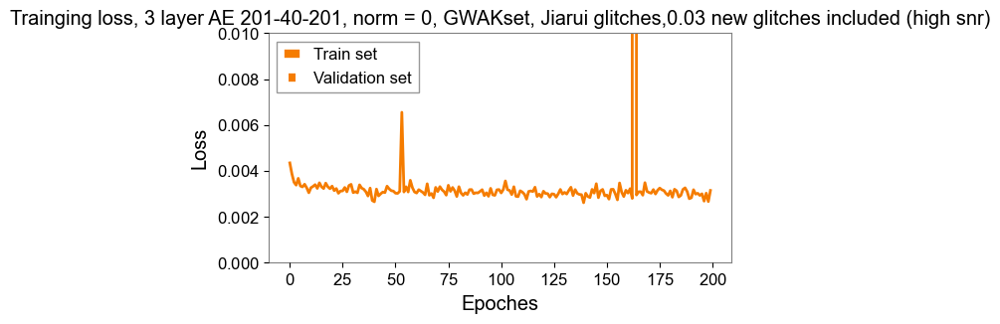

<Figure size 640x480 with 0 Axes>

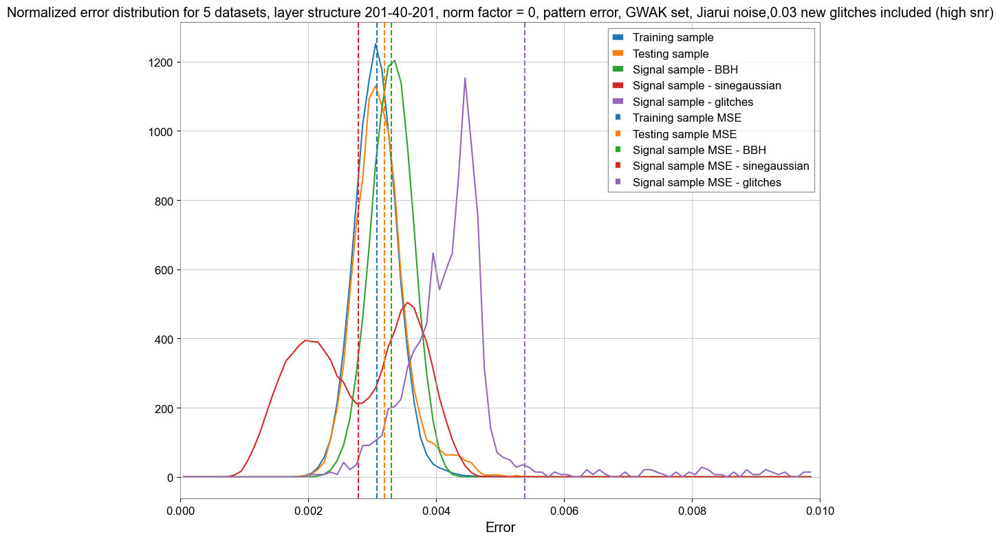

In [382]:
percentage_list = [0,0.03]

omega = 0

for i in range(len(percentage_list)):

    injection_number = int(percentage_list[i] * len(data_for_training_and_testing_tw))

    # indices_for_glitch_injection = np.random.choice(len(data_glitch_normalized),size = injection_number, replace = False)
    indices_for_glitch_injection = np.arange(injection_number)
    indices_for_glitch_not_injected = np.setdiff1d(np.arange(len(data_glitch_normalized)), indices_for_glitch_injection)

    X_train_intermediate = np.vstack((X_train, data_glitch_normalized[indices_for_glitch_injection[:int(0.7 * injection_number)]]))
    X_test_intermediate = np.vstack((X_test, data_glitch_normalized[indices_for_glitch_injection[-int(0.8 * injection_number):]]))
    X_validation_intermediate = np.vstack((X_validation, data_glitch_normalized[indices_for_glitch_injection[int(0.7 * injection_number):int(0.8 * injection_number)]]))

    np.random.shuffle(X_train_intermediate)
    np.random.shuffle(X_test_intermediate)
    np.random.shuffle(X_validation_intermediate)

    trainData = torch.FloatTensor(X_train_intermediate)
    testData = torch.FloatTensor(X_test_intermediate)
    validationData = torch.FloatTensor(X_validation_intermediate)

    glitchData = torch.FloatTensor(data_glitch_normalized[indices_for_glitch_not_injected])

    train_dataset = TensorDataset(trainData, trainData)
    test_dataset = TensorDataset(testData, testData)
    validation_dataset = TensorDataset(validationData, validationData)

    trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
    validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


    autoencoder = AutoEncoder().cuda()
    optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
    loss_func = nn.MSELoss().cuda()
    loss_train = np.zeros((epochs, 1))
    loss_validation = np.zeros((epochs, 1))

    print(trainData.shape)
    print(glitchData.shape)


    for epoch in range(epochs):
        # 训练阶段
        autoencoder.train()
        for batchidx, (x, _) in enumerate(trainDataLoader):
            x = x.cuda()
            encoded, decoded = autoencoder(x)
            # weighted_lossTrain = loss_func(decoded, x)
            loss_overall = loss_func(decoded, x)
            loss_norm = loss_func(decoded[:, -1], x[:, -1])
            weighted_lossTrain = loss_overall + loss_norm * omega
            
            # output_norm = torch.norm(decoded[:, :100], dim=1) 
            # penalty_term = torch.mean((output_norm - 1) ** 2) 
            # weighted_lossTrain = lossTrain + coef_delta * penalty_term
            
            optimizer.zero_grad()
            weighted_lossTrain.backward()
            optimizer.step()

        # 验证阶段
        autoencoder.eval()
        with torch.no_grad():
            val_loss = 0
            for batchidx, (x, _) in enumerate(validationDataLoader):
                x = x.cuda()
                encoded, decoded = autoencoder(x)
                lossVal_overall = loss_func(decoded, x)
                lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
                lossVal = lossVal_overall + lossVal_norm * omega
                val_loss += lossVal.item()

            val_loss /= len(validationDataLoader)
        
        loss_train[epoch,0] = weighted_lossTrain.item()
        loss_validation[epoch,0] = val_loss
        print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))


    torch.save(autoencoder.cpu(), '../Model_cached/model_201-40-201_0_GWAK_set_'+str(percentage_list[i])+'glitch_new_high_snr.pt')

    fig = plt.figure(figsize=(6, 3))
    ax = plt.subplot(1, 1, 1)
    ax.grid()
    ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
    ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
    ax.set_xlabel('Epoches')
    ax.set_ylabel('Loss')
    ax.set_title('Trainging loss, 3 layer AE 201-40-201, norm = 0, GWAKset, Jiarui glitches,'+str(percentage_list[i])+' new glitches included (high snr)')
    plt.ylim(0.000,0.01)
    plt.legend()
    # plt.show()
    plt.savefig('../Pic_cached/Loss_curve_'+str(percentage_list[i])+' new glitches included (high snr).png')

    # Rec

    _, decodedTestdata = autoencoder(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()



    _, decodedTestdata = autoencoder(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()



    _, decodedTestdata = autoencoder(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()



    data_sinegaussian_tensored = sgData
    _, decodedTestdata = autoencoder(data_sinegaussian_tensored)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((data_sinegaussian_tensored - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((data_sinegaussian_tensored.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (data_sinegaussian_tensored.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()



    _, decodedTestdata = autoencoder(glitchData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_glitch = decodedTestdata.detach().numpy()
    ReconstructedError_glitch = torch.mean((glitchData - reconstructedData_glitch)**2,dim=1)
    MSE_glitch = ReconstructedError_glitch.mean()

    ReconstructedError_glitch_output_200d = np.mean((glitchData.numpy()[:, :200] - reconstructedData_glitch[:, :200])**2, axis = 1)
    MSE_glitch_output_200d = ReconstructedError_glitch_output_200d.mean()

    ReconstructedError_glitch_output_1d = (glitchData.numpy()[:, -1] - reconstructedData_glitch[:, -1])**2
    MSE_glitch_output_1d = ReconstructedError_glitch_output_1d.mean()

    # Plot
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    bin_scheme = np.arange(0, 1e-2, 1e-4)

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
    # counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
    counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
    # counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    # bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

    bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    # bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


    plt.figure(figsize=(12, 9))
    plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    # plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

    plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')
    # plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


    plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    # plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

    plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')
    # plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


    plt.xlim(0, 0.01)
    plt.xlabel('Error')
    plt.title('Normalized error distribution for 5 datasets, layer structure 201-40-201, norm factor = 0, pattern error, GWAK set, Jiarui noise,'+str(percentage_list[i])+' new glitches included (high snr)')
    plt.legend()
    # plt.show()

    plt.savefig('../Pic_cached/'+str(percentage_list[i])+'.png')

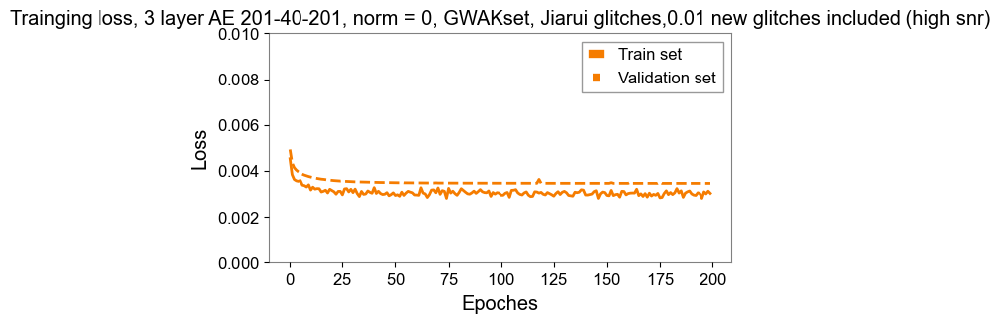

<Figure size 640x480 with 0 Axes>

In [372]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 201-40-201, norm = 0, GWAKset, Jiarui glitches,'+str(percentage_list[i])+' new glitches included (high snr)')
plt.ylim(0.000,0.01)
plt.legend()
# plt.show()
plt.savefig('../Pic_cached/Loss_curve_'+str(percentage_list[i])+' new glitches included (high snr).png')

torch.Size([70000, 201])
torch.Size([59732, 201])
Epoch: 0001, Training loss=0.00423559, Validation loss=0.00425938
Epoch: 0002, Training loss=0.00376168, Validation loss=0.00375532
Epoch: 0003, Training loss=0.00366702, Validation loss=0.00356331
Epoch: 0004, Training loss=0.00342508, Validation loss=0.00346046
Epoch: 0005, Training loss=0.00332876, Validation loss=0.00339308
Epoch: 0006, Training loss=0.00334911, Validation loss=0.00334488
Epoch: 0007, Training loss=0.00329201, Validation loss=0.00330857
Epoch: 0008, Training loss=0.00333894, Validation loss=0.00327888
Epoch: 0009, Training loss=0.00321307, Validation loss=0.00325467
Epoch: 0010, Training loss=0.00320297, Validation loss=0.00323360
Epoch: 0011, Training loss=0.00329168, Validation loss=0.00321607
Epoch: 0012, Training loss=0.00325595, Validation loss=0.00320046
Epoch: 0013, Training loss=0.00314853, Validation loss=0.00318766
Epoch: 0014, Training loss=0.00312471, Validation loss=0.00317655
Epoch: 0015, Training loss

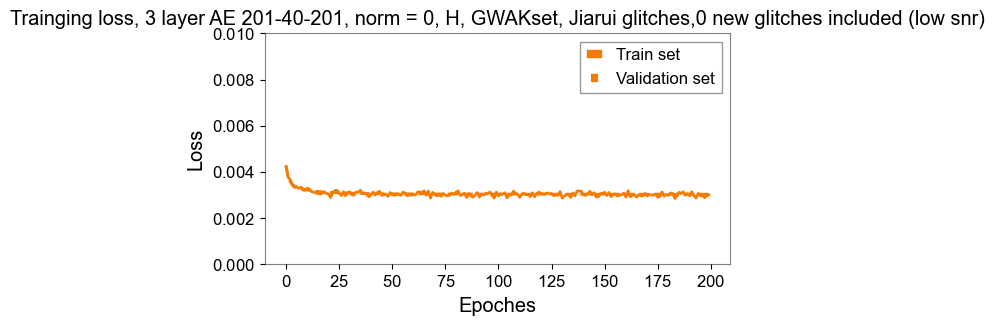

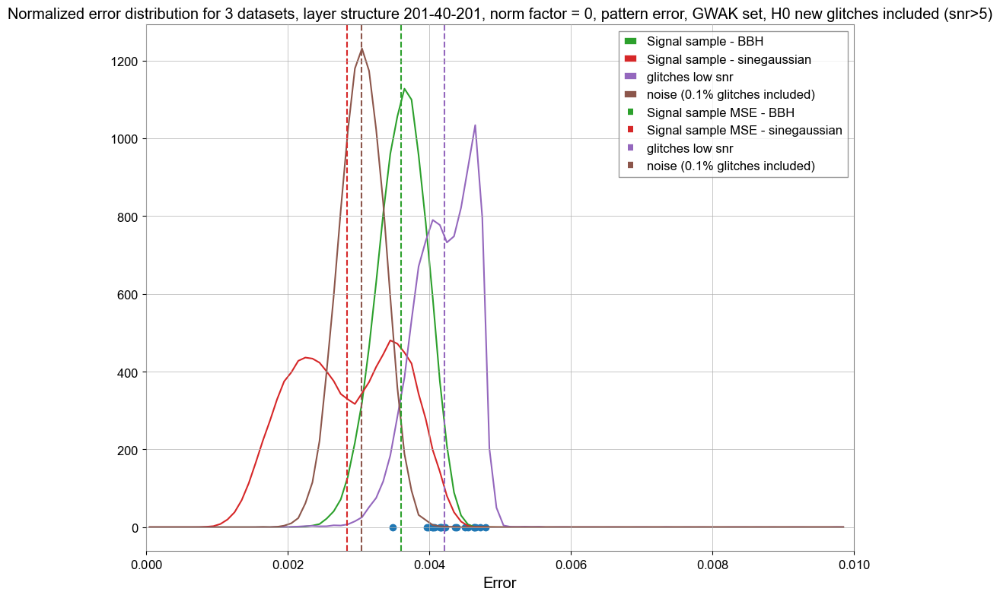

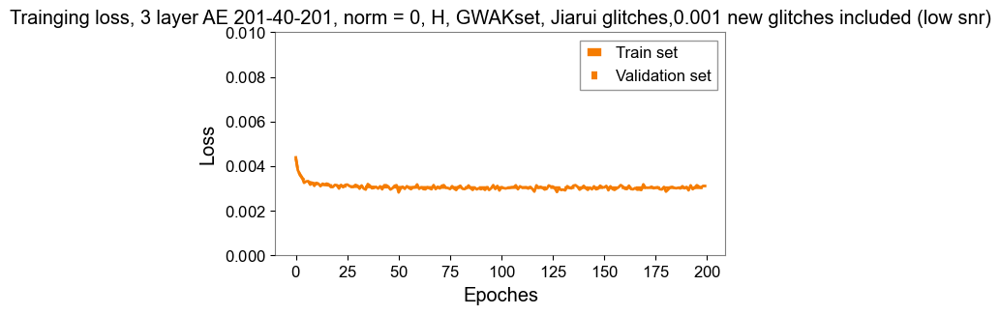

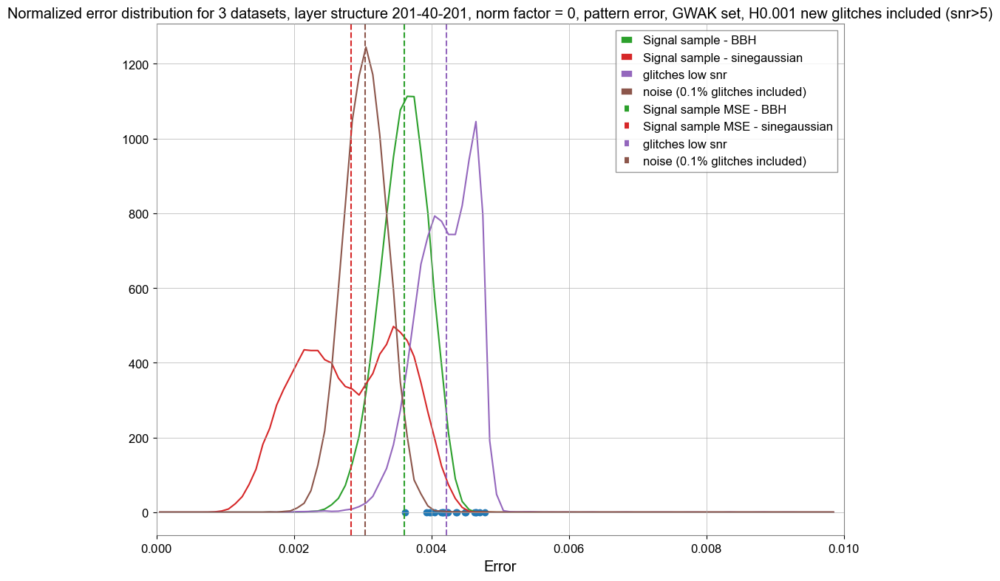

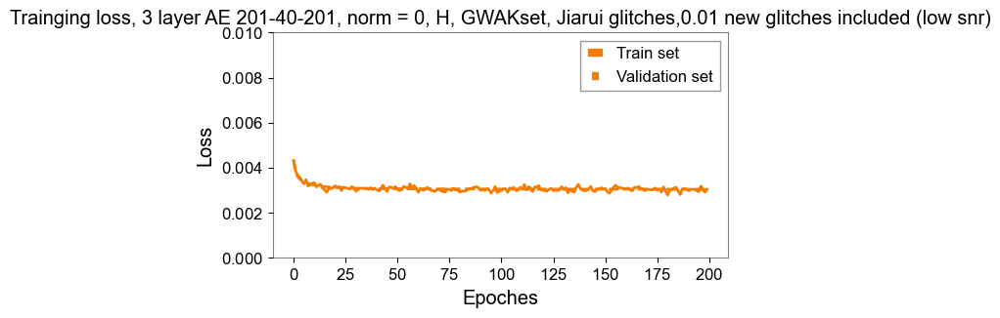

...

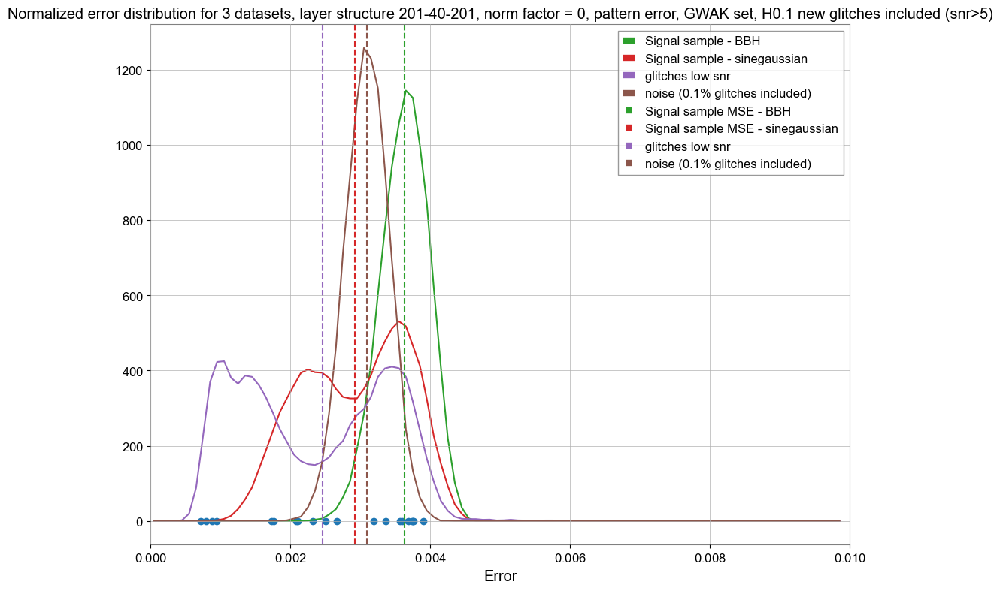

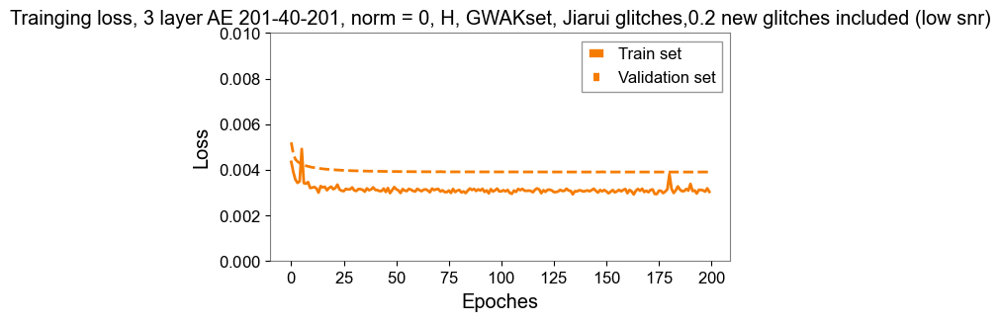

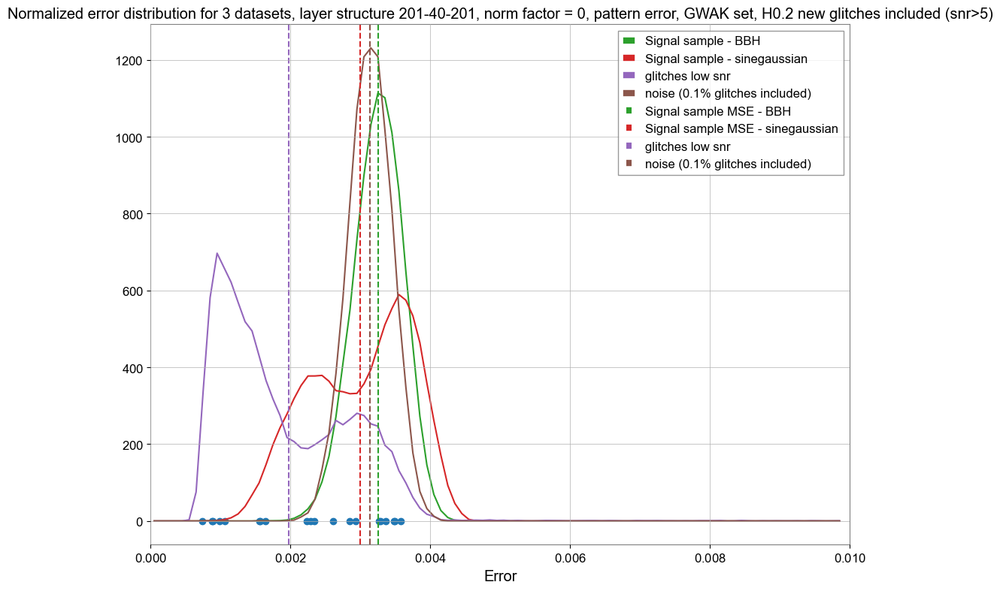

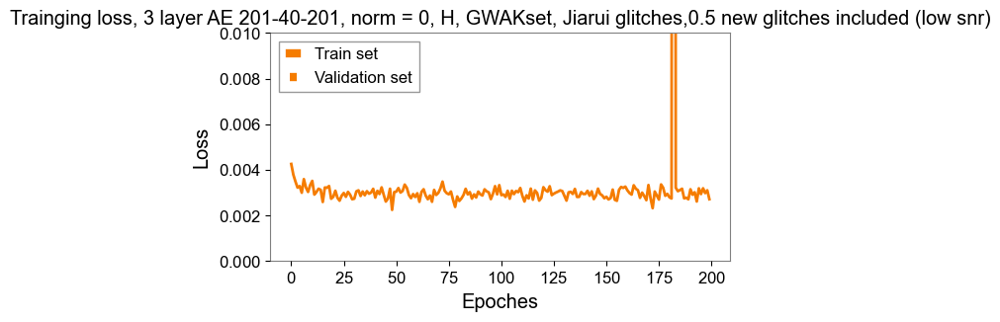

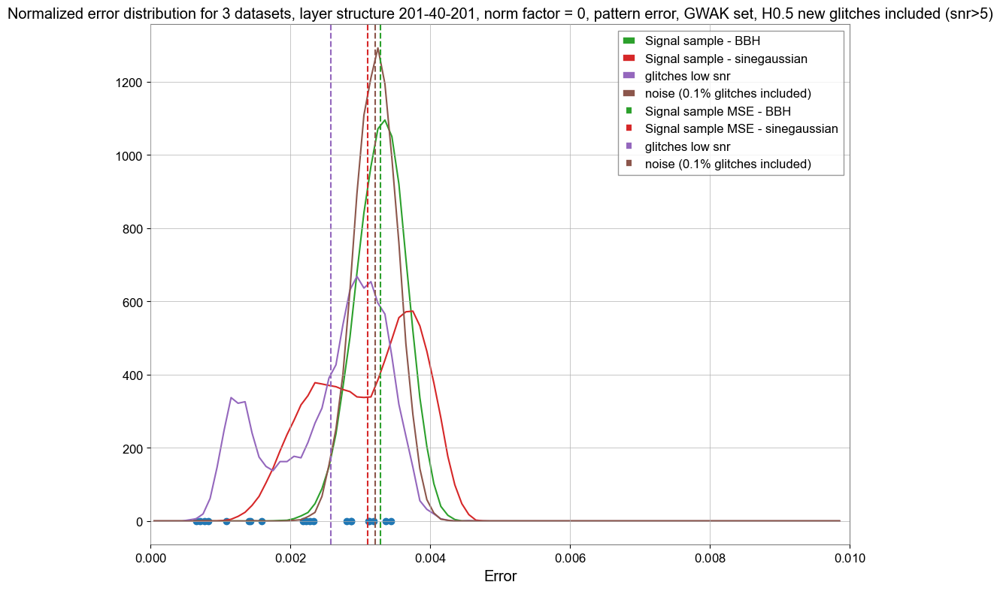

In [167]:
percentage_list = [0, 0.001, 0.01, 0.05, 0.1, 0.2, 0.5]

# percentage_list = np.arange(0.031, 0.04, 0.001)

omega = 0

input_flag = 0 # 0 for snr > 5, 1 for snr > 8

output_flag = 0  # 0 include model training, 1 exclude model training

if input_flag == 0:
    data_glitch = np.load('../Data_cached/real_glitches_H_snrlt5_59732_4000Hz_25ms.npz')['strain_time_data']
elif input_flag == 1:
    data_glitch = np.load('../Data_cached/real_glitches_H_snrlt8_4512_4000Hz_25ms.npz')['strain_time_data']

data_glitch = data_glitch / 12.3

data_glitch_normalized, _, data_glitch_recover_coef = bunch_normalization(data_glitch)
data_glitch_normalized = np.hstack((data_glitch_normalized, np.array(data_glitch_recover_coef).reshape(-1,1)))


for i in range(len(percentage_list)):

    injection_number = int(percentage_list[i] * len(data_for_training_and_testing_tw))

    # indices_for_glitch_injection = np.random.choice(len(data_glitch_normalized),size = injection_number, replace = False)
    indices_for_glitch_injection = np.arange(injection_number)
    indices_for_glitch_not_injected = np.setdiff1d(np.arange(len(data_glitch_normalized)), indices_for_glitch_injection)

    X_train_intermediate = np.vstack((X_train, data_glitch_normalized[indices_for_glitch_injection[:int(0.7 * injection_number)]]))
    X_test_intermediate = np.vstack((X_test, data_glitch_normalized[indices_for_glitch_injection[-int(0.8 * injection_number):]]))
    X_validation_intermediate = np.vstack((X_validation, data_glitch_normalized[indices_for_glitch_injection[int(0.7 * injection_number):int(0.8 * injection_number)]]))

    np.random.shuffle(X_train_intermediate)
    np.random.shuffle(X_test_intermediate)
    np.random.shuffle(X_validation_intermediate)

    trainData = torch.FloatTensor(X_train_intermediate)
    testData = torch.FloatTensor(X_test_intermediate)
    validationData = torch.FloatTensor(X_validation_intermediate)

    glitchData = torch.FloatTensor(data_glitch_normalized[indices_for_glitch_not_injected])

    train_dataset = TensorDataset(trainData, trainData)
    test_dataset = TensorDataset(testData, testData)
    validation_dataset = TensorDataset(validationData, validationData)

    trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
    validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


    autoencoder = AutoEncoder().cuda()
    optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
    loss_func = nn.MSELoss().cuda()
    loss_train = np.zeros((epochs, 1))
    loss_validation = np.zeros((epochs, 1))

    print(trainData.shape)
    print(glitchData.shape)

    if output_flag == 0: 
    
        for epoch in range(epochs):
            # 训练阶段
            autoencoder.train()
            for batchidx, (x, _) in enumerate(trainDataLoader):
                x = x.cuda()
                encoded, decoded = autoencoder(x)
                # weighted_lossTrain = loss_func(decoded, x)
                loss_overall = loss_func(decoded, x)
                loss_norm = loss_func(decoded[:, -1], x[:, -1])
                weighted_lossTrain = loss_overall + loss_norm * omega
                
                # output_norm = torch.norm(decoded[:, :100], dim=1) 
                # penalty_term = torch.mean((output_norm - 1) ** 2) 
                # weighted_lossTrain = lossTrain + coef_delta * penalty_term
                
                optimizer.zero_grad()
                weighted_lossTrain.backward()
                optimizer.step()

                # 验证阶段
            autoencoder.eval()
            with torch.no_grad():
                val_loss = 0
                for batchidx, (x, _) in enumerate(validationDataLoader):
                    x = x.cuda()
                    encoded, decoded = autoencoder(x)
                    lossVal_overall = loss_func(decoded, x)
                    lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
                    lossVal = lossVal_overall + lossVal_norm * omega
                    val_loss += lossVal.item()

                val_loss /= len(validationDataLoader)
            
            loss_train[epoch,0] = weighted_lossTrain.item()
            loss_validation[epoch,0] = val_loss
            print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))


        torch.save(autoencoder.cpu(), '../Model_cached/model_201-40-201_0_GWAK_set_H,'+str(percentage_list[i])+'glitch_new_new.pt')

        fig = plt.figure(figsize=(6, 3))
        ax = plt.subplot(1, 1, 1)
        ax.grid()
        ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
        ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
        ax.set_xlabel('Epoches')
        ax.set_ylabel('Loss')
        ax.set_title('Trainging loss, 3 layer AE 201-40-201, norm = 0, H, GWAKset, Jiarui glitches,'+str(percentage_list[i])+' new glitches included (low snr)')
        plt.ylim(0.000,0.01)
        plt.legend()
        # plt.show()
        plt.savefig('../Pic_cached/Loss_curve_H,'+str(percentage_list[i])+' new glitches included, new.png')

    # Rec
    elif output_flag == 1:
        if input_flag == 0:
            autoencoder = torch.load('../Model_cached/model_201-40-201_0_GWAK_set_'+str(percentage_list[i])+'glitch_new_new.pt')
        elif input_flag == 1:
            autoencoder = torch.load('../Model_cached/model_201-40-201_0_GWAK_set_'+str(percentage_list[i])+'glitch_new_high_snr.pt')
        # autoencoder = torch.load('../Model_cached/model_201-40-201_0_GWAK_set_'+str(percentage_list[i])+'glitch_new.pt')
        
    _, decodedTestdata = autoencoder(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()


    _, decodedTestdata = autoencoder(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()




    _, decodedTestdata = autoencoder(noiseData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_noise = decodedTestdata.detach().numpy()
    ReconstructedError_noise = torch.mean((noiseData - reconstructedData_noise)**2,dim=1)
    MSE_noise = ReconstructedError_noise.mean()

    ReconstructedError_noise_output_200d = np.mean((noiseData.numpy()[:, :200] - reconstructedData_noise[:, :200])**2, axis = 1)
    MSE_noise_output_200d = ReconstructedError_noise_output_200d.mean()

    ReconstructedError_noise_output_1d = (noiseData.numpy()[:, -1] - reconstructedData_noise[:, -1])**2
    MSE_noise_output_1d = ReconstructedError_noise_output_1d.mean()
    
    
    _, decodedTestdata = autoencoder(glitchinnoiseData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_glitchinnoise = decodedTestdata.detach().numpy()
    ReconstructedError_glitchinnoise = torch.mean((glitchinnoiseData - reconstructedData_glitchinnoise)**2,dim=1)
    MSE_glitchinnoise = ReconstructedError_glitchinnoise.mean()

    ReconstructedError_glitchinnoise_output_200d = np.mean((glitchinnoiseData.numpy()[:, :200] - reconstructedData_glitchinnoise[:, :200])**2, axis = 1)
    MSE_glitchinnoise_output_200d = ReconstructedError_glitchinnoise_output_200d.mean()

    ReconstructedError_glitchinnoise_output_1d = (glitchinnoiseData.numpy()[:, -1] - reconstructedData_glitchinnoise[:, -1])**2
    MSE_glitchinnoise_output_1d = ReconstructedError_glitchinnoise_output_1d.mean()
    


    _, decodedTestdata = autoencoder(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()



    data_sinegaussian_tensored = sgData
    _, decodedTestdata = autoencoder(data_sinegaussian_tensored)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((data_sinegaussian_tensored - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((data_sinegaussian_tensored.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (data_sinegaussian_tensored.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()



    _, decodedTestdata = autoencoder(glitchData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_glitch = decodedTestdata.detach().numpy()
    ReconstructedError_glitch = torch.mean((glitchData - reconstructedData_glitch)**2,dim=1)
    MSE_glitch = ReconstructedError_glitch.mean()

    ReconstructedError_glitch_output_200d = np.mean((glitchData.numpy()[:, :200] - reconstructedData_glitch[:, :200])**2, axis = 1)
    MSE_glitch_output_200d = ReconstructedError_glitch_output_200d.mean()

    ReconstructedError_glitch_output_1d = (glitchData.numpy()[:, -1] - reconstructedData_glitch[:, -1])**2
    MSE_glitch_output_1d = ReconstructedError_glitch_output_1d.mean()

    # Plot
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    bin_scheme = np.arange(0, 1e-2, 1e-4)

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
    # counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
    counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
    counts_noise, bin_position_noise = np.histogram(ReconstructedError_noise_output_200d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    # bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

    bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    bin_centers_noise = (bin_position_noise[:-1] + bin_position_noise[1:]) / 2


    plt.figure(figsize=(12, 9))
    # plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    # plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    # plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

    plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'glitches low snr')
    plt.plot(bin_centers_noise, counts_noise, color = colors[5], label = 'noise (0.1% glitches included)')


    # plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    # plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    # plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

    plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'glitches low snr')
    plt.axvline(x = MSE_noise_output_200d, color = colors[5], linestyle = '--', label = 'noise (0.1% glitches included)')
    
    plt.scatter(y = np.ones(len(ReconstructedError_glitchinnoise_output_200d))*0.1, x = ReconstructedError_glitchinnoise_output_200d)


    plt.xlim(0, 0.01)
    # plt.ylim(0, 10)
    plt.xlabel('Error')
    plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, norm factor = 0, pattern error, GWAK set, H'+str(percentage_list[i])+' new glitches included (snr>5)')
    plt.legend()
    # plt.show()

    plt.savefig('../Pic_cached/Pattern error distribution GWAKset H'+str(percentage_list[i])+'low snr.png')

In [175]:
# percentage_list = [0, 0.001, 0.01, 0.03]

# percentage_list = np.arange(0.041, 0.05, 0.001)

percentage_list = [0.04,0.041, 0.042, 0.043]

omega = 0

input_flag = 0 # 0 for snr > 5, 1 for snr > 8

output_flag = 0  # 0 include model training, 1 exclude model training

if input_flag == 0:
    data_glitch = np.load('../Data_cached/real_glitches_snrlt5_60132_4000Hz_25ms.npz')['strain_time_data']
elif input_flag == 1:
    data_glitch = np.load('../Data_cached/real_glitches_snrlt8_4574_4000Hz_25ms.npz')['strain_time_data']

data_glitch = data_glitch / 12.3

data_glitch_normalized, _, data_glitch_recover_coef = bunch_normalization(data_glitch)
data_glitch_normalized = np.hstack((data_glitch_normalized, np.array(data_glitch_recover_coef).reshape(-1,1)))


for i in range(len(percentage_list)):

    injection_number = int(percentage_list[i] * len(data_for_training_and_testing_tw))

    # indices_for_glitch_injection = np.random.choice(len(data_glitch_normalized),size = injection_number, replace = False)
    indices_for_glitch_injection = np.arange(injection_number)
    indices_for_glitch_not_injected = np.setdiff1d(np.arange(len(data_glitch_normalized)), indices_for_glitch_injection)

    X_train_intermediate = np.vstack((X_train, data_glitch_normalized[indices_for_glitch_injection[:int(0.7 * injection_number)]]))
    X_test_intermediate = np.vstack((X_test, data_glitch_normalized[indices_for_glitch_injection[-int(0.8 * injection_number):]]))
    X_validation_intermediate = np.vstack((X_validation, data_glitch_normalized[indices_for_glitch_injection[int(0.7 * injection_number):int(0.8 * injection_number)]]))

    np.random.shuffle(X_train_intermediate)
    np.random.shuffle(X_test_intermediate)
    np.random.shuffle(X_validation_intermediate)

    trainData = torch.FloatTensor(X_train_intermediate)
    testData = torch.FloatTensor(X_test_intermediate)
    validationData = torch.FloatTensor(X_validation_intermediate)

    glitchData = torch.FloatTensor(data_glitch_normalized[indices_for_glitch_not_injected])

    train_dataset = TensorDataset(trainData, trainData)
    test_dataset = TensorDataset(testData, testData)
    validation_dataset = TensorDataset(validationData, validationData)

    trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
    validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


    autoencoder = AutoEncoder().cuda()
    optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
    loss_func = nn.MSELoss().cuda()
    loss_train = np.zeros((epochs, 1))
    loss_validation = np.zeros((epochs, 1))

    print(trainData.shape)
    print(glitchData.shape)

    if output_flag == 0: 
    
        for epoch in range(epochs):
            # 训练阶段
            autoencoder.train()
            for batchidx, (x, _) in enumerate(trainDataLoader):
                x = x.cuda()
                encoded, decoded = autoencoder(x)
                # weighted_lossTrain = loss_func(decoded, x)
                loss_overall = loss_func(decoded, x)
                loss_norm = loss_func(decoded[:, -1], x[:, -1])
                weighted_lossTrain = loss_overall + loss_norm * omega
                
                # output_norm = torch.norm(decoded[:, :100], dim=1) 
                # penalty_term = torch.mean((output_norm - 1) ** 2) 
                # weighted_lossTrain = lossTrain + coef_delta * penalty_term
                
                optimizer.zero_grad()
                weighted_lossTrain.backward()
                optimizer.step()

                # 验证阶段
            autoencoder.eval()
            with torch.no_grad():
                val_loss = 0
                for batchidx, (x, _) in enumerate(validationDataLoader):
                    x = x.cuda()
                    encoded, decoded = autoencoder(x)
                    lossVal_overall = loss_func(decoded, x)
                    lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
                    lossVal = lossVal_overall + lossVal_norm * omega
                    val_loss += lossVal.item()

                val_loss /= len(validationDataLoader)
            
            loss_train[epoch,0] = weighted_lossTrain.item()
            loss_validation[epoch,0] = val_loss
            print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))


        torch.save(autoencoder.cpu(), '../Model_cached/model_201-40-201_0_GWAK_set_H'+str(percentage_list[i])+'glitch_new_new_new.pt')

        fig = plt.figure(figsize=(6, 3))
        ax = plt.subplot(1, 1, 1)
        ax.grid()
        ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
        ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
        ax.set_xlabel('Epoches')
        ax.set_ylabel('Loss')
        ax.set_title('Trainging loss, 3 layer AE 201-40-201, norm = 0, GWAKset, Jiarui glitches,H'+str(percentage_list[i])+' new glitches included (low snr)')
        plt.ylim(0.000,0.01)
        plt.legend()
        # plt.show()
        plt.savefig('../Pic_cached/Loss_curve_H'+str(percentage_list[i])+' new glitches included, new.png')

    # Rec
    elif output_flag == 1:
        if input_flag == 0:
            autoencoder = torch.load('../Model_cached/model_201-40-201_0_GWAK_set_'+str(percentage_list[i])+'glitch_new_new.pt')
        elif input_flag == 1:
            autoencoder = torch.load('../Model_cached/model_201-40-201_0_GWAK_set_'+str(percentage_list[i])+'glitch_new_high_snr.pt')
        # autoencoder = torch.load('../Model_cached/model_201-40-201_0_GWAK_set_'+str(percentage_list[i])+'glitch_new.pt')
        
    _, decodedTestdata = autoencoder(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()


    _, decodedTestdata = autoencoder(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()




    _, decodedTestdata = autoencoder(noiseData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_noise = decodedTestdata.detach().numpy()
    ReconstructedError_noise = torch.mean((noiseData - reconstructedData_noise)**2,dim=1)
    MSE_noise = ReconstructedError_noise.mean()

    ReconstructedError_noise_output_200d = np.mean((noiseData.numpy()[:, :200] - reconstructedData_noise[:, :200])**2, axis = 1)
    MSE_noise_output_200d = ReconstructedError_noise_output_200d.mean()

    ReconstructedError_noise_output_1d = (noiseData.numpy()[:, -1] - reconstructedData_noise[:, -1])**2
    MSE_noise_output_1d = ReconstructedError_noise_output_1d.mean()
    
    
    _, decodedTestdata = autoencoder(glitchinnoiseData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_glitchinnoise = decodedTestdata.detach().numpy()
    ReconstructedError_glitchinnoise = torch.mean((glitchinnoiseData - reconstructedData_glitchinnoise)**2,dim=1)
    MSE_glitchinnoise = ReconstructedError_glitchinnoise.mean()

    ReconstructedError_glitchinnoise_output_200d = np.mean((glitchinnoiseData.numpy()[:, :200] - reconstructedData_glitchinnoise[:, :200])**2, axis = 1)
    MSE_glitchinnoise_output_200d = ReconstructedError_glitchinnoise_output_200d.mean()

    ReconstructedError_glitchinnoise_output_1d = (glitchinnoiseData.numpy()[:, -1] - reconstructedData_glitchinnoise[:, -1])**2
    MSE_glitchinnoise_output_1d = ReconstructedError_glitchinnoise_output_1d.mean()
    


    _, decodedTestdata = autoencoder(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()



    data_sinegaussian_tensored = sgData
    _, decodedTestdata = autoencoder(data_sinegaussian_tensored)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((data_sinegaussian_tensored - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((data_sinegaussian_tensored.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (data_sinegaussian_tensored.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()



    _, decodedTestdata = autoencoder(glitchData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_glitch = decodedTestdata.detach().numpy()
    ReconstructedError_glitch = torch.mean((glitchData - reconstructedData_glitch)**2,dim=1)
    MSE_glitch = ReconstructedError_glitch.mean()

    ReconstructedError_glitch_output_200d = np.mean((glitchData.numpy()[:, :200] - reconstructedData_glitch[:, :200])**2, axis = 1)
    MSE_glitch_output_200d = ReconstructedError_glitch_output_200d.mean()

    ReconstructedError_glitch_output_1d = (glitchData.numpy()[:, -1] - reconstructedData_glitch[:, -1])**2
    MSE_glitch_output_1d = ReconstructedError_glitch_output_1d.mean()

    # Plot
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    bin_scheme = np.arange(0, 1e-2, 1e-4)

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
    # counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
    counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
    counts_noise, bin_position_noise = np.histogram(ReconstructedError_noise_output_200d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    # bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

    bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    bin_centers_noise = (bin_position_noise[:-1] + bin_position_noise[1:]) / 2


    plt.figure(figsize=(12, 9))
    # plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    # plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    # plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

    plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'glitches low snr')
    plt.plot(bin_centers_noise, counts_noise, color = colors[5], label = 'noise (0.1% glitches included)')


    # plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    # plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    # plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

    plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'glitches low snr')
    plt.axvline(x = MSE_noise_output_200d, color = colors[5], linestyle = '--', label = 'noise (0.1% glitches included)')
    
    plt.scatter(y = np.ones(len(ReconstructedError_glitchinnoise_output_200d))*0.1, x = ReconstructedError_glitchinnoise_output_200d)


    plt.xlim(0, 0.01)
    # plt.ylim(0, 10)
    plt.xlabel('Error')
    plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, norm factor = 0, pattern error, GWAK set, H, '+str(percentage_list[i])+' new glitches included (snr>5)')
    plt.legend()
    # plt.show()

    plt.savefig('../Pic_cached/Pattern error distribution GWAKset H '+str(percentage_list[i])+'low snr_new.png')

torch.Size([72800, 201])
torch.Size([56132, 201])


Epoch: 0001, Training loss=0.00435569, Validation loss=0.00559957
Epoch: 0002, Training loss=0.00388549, Validation loss=0.00510062
Epoch: 0003, Training loss=0.00365302, Validation loss=0.00486286
Epoch: 0004, Training loss=0.00363622, Validation loss=0.00475888
Epoch: 0005, Training loss=0.00345022, Validation loss=0.00468352
Epoch: 0006, Training loss=0.00344142, Validation loss=0.00463895
Epoch: 0007, Training loss=0.00343483, Validation loss=0.00459831
Epoch: 0008, Training loss=0.00342574, Validation loss=0.00456826
Epoch: 0009, Training loss=0.00331985, Validation loss=0.00454343
Epoch: 0010, Training loss=0.00338091, Validation loss=0.00452019
Epoch: 0011, Training loss=0.00337501, Validation loss=0.00449820
Epoch: 0012, Training loss=0.00338740, Validation loss=0.00448124
Epoch: 0013, Training loss=0.00332236, Validation loss=0.00446920
Epoch: 0014, Training loss=0.00330443, Validation loss=0.00445018
Epoch: 0015, Training loss=0.00323281, Validation loss=0.00443585
Epoch: 001

In [386]:
trainData

tensor([[-0.0357,  0.1420,  0.1871,  ...,  0.0159, -0.0543,  0.4663],
        [-0.0105,  0.0073,  0.0201,  ..., -0.0051, -0.0311,  0.4482],
        [-0.0174,  0.0017, -0.0333,  ..., -0.0279,  0.0288,  0.4872],
        ...,
        [-0.1020,  0.0281, -0.0202,  ..., -0.0242,  0.0176,  0.4974],
        [ 0.0543,  0.1158,  0.1168,  ...,  0.1293,  0.0186,  0.5115],
        [ 0.0719, -0.0182, -0.0660,  ...,  0.0296, -0.0473,  0.5175]])

Draft
----

In [119]:
data_for_training_and_testing = np.load("../Data_cached/4000Hz25msnoisesample1e6.npy").reshape(-1,200)

data_for_training_and_testing = data_for_training_and_testing * 1e21

total_sample_number = data_for_training_and_testing.shape[0]
test_sample_number = int(test_sample_ratio * total_sample_number)
validation_sample_number = int(validation_sample_ratio * total_sample_number)
train_sample_number = total_sample_number - test_sample_number - validation_sample_number


X_train_ini = data_for_training_and_testing[0:train_sample_number].copy()
X_test_ini = data_for_training_and_testing[-test_sample_number:].copy()
X_validation_ini = data_for_training_and_testing[train_sample_number:-test_sample_number].copy()

X_train, _, X_train_recover_coef = bunch_normalization(X_train_ini)
X_test,_ ,X_test_recover_coef = bunch_normalization(X_test_ini)
X_validation,_ ,X_validation_recover_coef = bunch_normalization(X_validation_ini)

X_train = np.hstack((X_train, np.array(X_train_recover_coef).reshape(train_sample_number,1)))
X_validation = np.hstack((X_validation, np.array(X_validation_recover_coef).reshape(validation_sample_number,1)))
X_test = np.hstack((X_test, np.array(X_test_recover_coef).reshape(test_sample_number,1)))

trainData = torch.FloatTensor(X_train)
testData = torch.FloatTensor(X_test)
validationData = torch.FloatTensor(X_validation)

In [120]:
for omega in omega_list:

    train_dataset = TensorDataset(trainData, trainData)
    test_dataset = TensorDataset(testData, testData)
    validation_dataset = TensorDataset(validationData, validationData)

    trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
    validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


    autoencoder = AutoEncoder().cuda()
    optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
    loss_func = nn.MSELoss().cuda()
    loss_train = np.zeros((epochs, 1))
    loss_validation = np.zeros((epochs, 1))


    for epoch in range(epochs):
        # 训练阶段
        autoencoder.train()
        for batchidx, (x, _) in enumerate(trainDataLoader):
            x = x.cuda()
            encoded, decoded = autoencoder(x)
            # weighted_lossTrain = loss_func(decoded, x)
            loss_overall = loss_func(decoded, x)
            loss_norm = loss_func(decoded[:, -1], x[:, -1])
            weighted_lossTrain = loss_overall + loss_norm * omega
            
            # output_norm = torch.norm(decoded[:, :100], dim=1) 
            # penalty_term = torch.mean((output_norm - 1) ** 2) 
            # weighted_lossTrain = lossTrain + coef_delta * penalty_term
            
            optimizer.zero_grad()
            weighted_lossTrain.backward()
            optimizer.step()

        # 验证阶段
        autoencoder.eval()
        with torch.no_grad():
            val_loss = 0
            for batchidx, (x, _) in enumerate(validationDataLoader):
                x = x.cuda()
                encoded, decoded = autoencoder(x)
                lossVal_overall = loss_func(decoded, x)
                lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
                lossVal = lossVal_overall + lossVal_norm * omega
                val_loss += lossVal.item()

            val_loss /= len(validationDataLoader)
        
        loss_train[epoch,0] = weighted_lossTrain.item()
        loss_validation[epoch,0] = val_loss
    print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))


    torch.save(autoencoder.cpu(), '../Model_cached/model_201-40-201_' + str(omega) + '_bunch.pt')


Model Train-Loss curve study
---

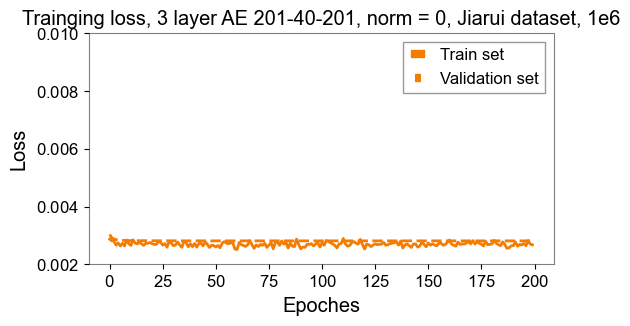

In [217]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 201-40-201, norm = 0, Jiarui dataset, 1e6')
plt.ylim(0.002,0.01)
plt.legend()
plt.show()

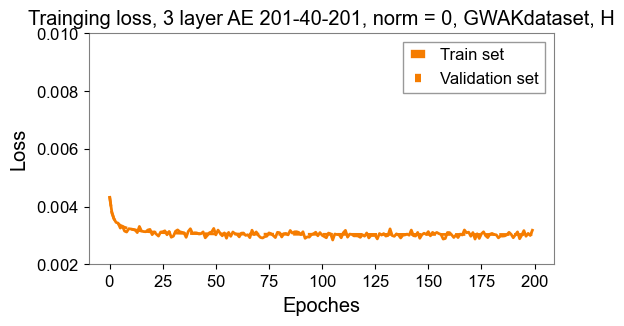

In [203]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 201-40-201, norm = 0, GWAKdataset, H')
plt.ylim(0.002,0.01)
plt.legend()
plt.show()

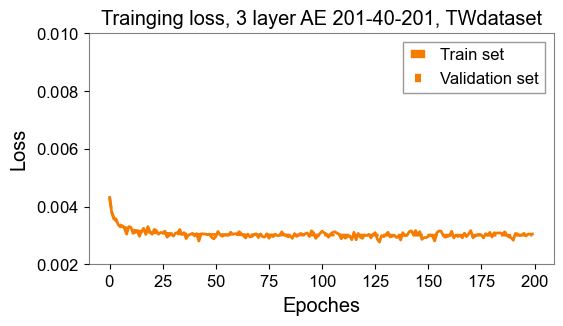

In [83]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 201-40-201, TWdataset')
plt.ylim(0.002,0.01)
plt.legend()
plt.show()

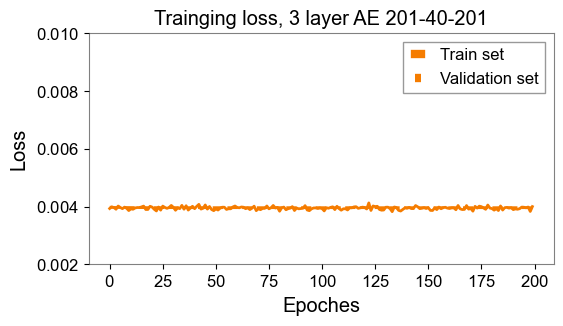

In [48]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 201-40-201')
plt.ylim(0.002,0.01)
plt.legend()
plt.show()

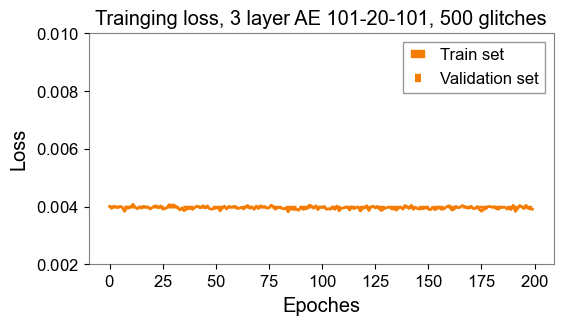

In [14]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 101-20-101, 500 glitches')
plt.ylim(0.002,0.01)
plt.legend()
plt.show()

Draft
---

In [208]:
X_train.shape

(70000, 201)

(array([0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 6.000e+00, 1.300e+01, 6.000e+01, 1.710e+02,
        4.120e+02, 1.027e+03, 2.071e+03, 3.589e+03, 5.523e+03,
        7.502e+03, 8.714e+03, 9.638e+03, 8.856e+03, 7.604e+03,
        5.831e+03, 3.829e+03, 2.433e+03, 1.430e+03, 7.340e+02,
        3.380e+02, 1.240e+02, 6.400e+01, 1.600e+01, 4.000e+00,
        3.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.0

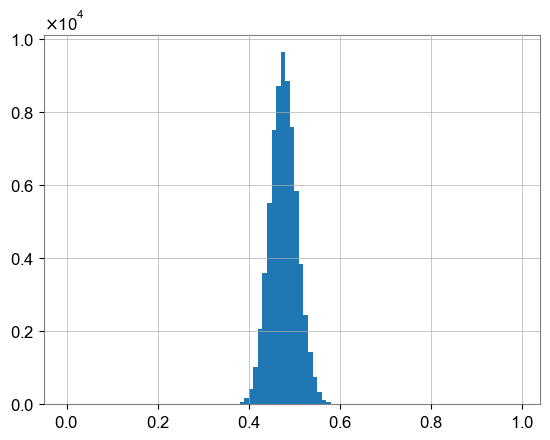

In [207]:
plt.hist(X_train[:,-1], bins = np.arange(0,1,0.01))

In [216]:
data_bbh_normalized.shape

(100000, 201)

(array([0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 2.000e+00,
        1.200e+01, 4.200e+01, 1.800e+02, 4.560e+02, 9.310e+02,
        1.823e+03, 2.885e+03, 4.339e+03, 5.980e+03, 7.184e+03,
        8.129e+03, 8.808e+03, 8.600e+03, 8.233e+03, 7.411e+03,
        6.689e+03, 5.759e+03, 4.714e+03, 3.987e+03, 3.195e+03,
        2.559e+03, 2.108e+03, 1.697e+03, 1.286e+03, 8.960e+02,
        6.610e+02, 4.760e+02, 3.090e+02, 2.470e+02, 1.210e+02,
        8.800e+01, 6.700e+01, 4.700e+01, 2.600e+01, 2.200e+01,
        7.000e+00, 3.000e+00, 5.000e+00, 5.000e+00, 4.000e+00,
        0.000e+00, 3.000e+00, 0.000e+00, 0.000e+00, 0.0

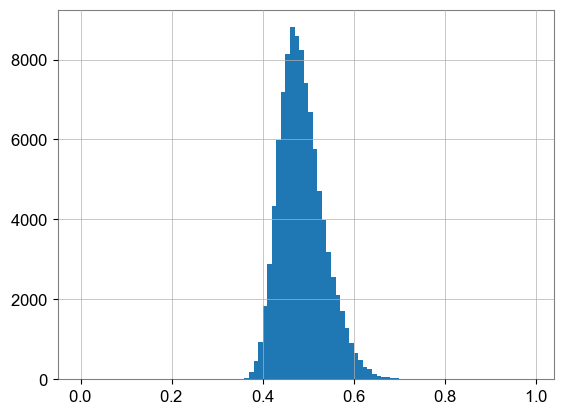

In [218]:
plt.hist(data_bbh_normalized[:,-1], bins = np.arange(0,1,0.01))

Reconstruction procedure
---

In [473]:
trainData = trainData_ini[:,:200]
testData = testData_ini[:,:200]
bbhData = bbhData_ini[:,:200]

In [155]:
_, decodedTestdata = autoencoder(trainData)
decodedTestdata = decodedTestdata.double()
reconstructedData_train = decodedTestdata.detach().numpy()
ReconstructedError_train = np.mean((trainData.numpy() - reconstructedData_train)**2,axis=1)
MSE_train = ReconstructedError_train.mean()

X_train_output = X_train[:, :200]
reconstructedData_train_output = reconstructedData_train[:, :200]

ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
MSE_train_output_1d = ReconstructedError_train_output_1d.mean()

In [156]:
_, decodedTestdata = autoencoder(testData)
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()
ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
MSE_test = ReconstructedError_test.mean()

X_test_output = X_test[:, :200]
reconstructedData_test_output = reconstructedData_test[:, :200]

ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
MSE_test_output_1d = ReconstructedError_train_output_1d.mean()

In [202]:
_, decodedTestdata = autoencoder(noiseData)
decodedTestdata = decodedTestdata.double()
reconstructedData_noise = decodedTestdata.detach().numpy()
ReconstructedError_noise = torch.mean((noiseData - reconstructedData_noise)**2,dim=1)
MSE_noise = ReconstructedError_noise.mean()

ReconstructedError_noise_output_200d = np.mean((noiseData.numpy()[:, :200] - reconstructedData_noise[:, :200])**2, axis = 1)
MSE_noise_output_200d = ReconstructedError_noise_output_200d.mean()

ReconstructedError_noise_output_1d = (noiseData.numpy()[:, -1] - reconstructedData_noise[:, -1])**2
MSE_noise_output_1d = ReconstructedError_noise_output_1d.mean()

In [203]:
_, decodedTestdata = autoencoder(bbhData)
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()
ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
MSE_injected = ReconstructedError_injected.mean()

ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()

In [204]:
data_sinegaussian_tensored = sgData
_, decodedTestdata = autoencoder(data_sinegaussian_tensored)
decodedTestdata = decodedTestdata.double()
reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
ReconstructedError_sinegaussian = torch.mean((data_sinegaussian_tensored - reconstructedData_sinegaussian)**2,dim=1)
MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

ReconstructedError_sinegaussian_output_200d = np.mean((data_sinegaussian_tensored.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

ReconstructedError_sinegaussian_output_1d = (data_sinegaussian_tensored.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()

In [134]:
trainData_cut = trainData[0:5000]

_, decodedTestdata = autoencoder(trainData_cut)
decodedTestdata = decodedTestdata.double()
reconstructedData_train_cut = decodedTestdata.detach().numpy()
ReconstructedError_train_cut = torch.mean((trainData_cut - reconstructedData_train_cut)**2,dim=1)
MSE_train_cut = ReconstructedError_train_cut.mean()

# X_train_output = X_train[:, :200]
# reconstructedData_train_output = reconstructedData_train[:, :200]

ReconstructedError_train_cut_output_200d = np.mean((trainData_cut.numpy()[:, :200] - reconstructedData_train_cut[:, :200])**2, axis = 1)
MSE_train_cut_output_200d = ReconstructedError_train_cut_output_200d.mean()

ReconstructedError_train_cut_output_1d = (trainData_cut.numpy()[:, -1] - reconstructedData_train_cut[:, -1])**2
MSE_train_cut_output_1d = ReconstructedError_train_cut_output_1d.mean()

In [205]:
_, decodedTestdata = autoencoder(glitchData)
decodedTestdata = decodedTestdata.double()
reconstructedData_glitch = decodedTestdata.detach().numpy()
ReconstructedError_glitch = torch.mean((glitchData - reconstructedData_glitch)**2,dim=1)
MSE_glitch = ReconstructedError_glitch.mean()

ReconstructedError_glitch_output_200d = np.mean((glitchData.numpy()[:, :200] - reconstructedData_glitch[:, :200])**2, axis = 1)
MSE_glitch_output_200d = ReconstructedError_glitch_output_200d.mean()

ReconstructedError_glitch_output_1d = (glitchData.numpy()[:, -1] - reconstructedData_glitch[:, -1])**2
MSE_glitch_output_1d = ReconstructedError_glitch_output_1d.mean()

## Save the reconstruction error data

In [341]:
np.savez('../Data_cached/Reconstruction_error_GWAKset_L_1.npz', noise_train_pattern = ReconstructedError_train_output_200d, noise_train_norm = ReconstructedError_train_output_1d,
                                                            noise_test_pattern = ReconstructedError_test_output_200d, noise_test_norm = ReconstructedError_test_output_1d,
                                                            bbh_pattern = ReconstructedError_injected_output_200d, bbh_norm = ReconstructedError_injected_output_1d,
                                                            sg_pattern = ReconstructedError_sinegaussian_output_200d, sg_norm = ReconstructedError_sinegaussian_output_1d,
                                                            glitch_pattern = ReconstructedError_glitch_output_200d, glitch_norm = ReconstructedError_glitch_output_1d)

In [317]:
np.savez('../Data_cached/Reconstruction_error_GWAKset_H_1.npz', noise_train_pattern = ReconstructedError_train_output_200d, noise_train_norm = ReconstructedError_train_output_1d,
                                                            noise_test_pattern = ReconstructedError_test_output_200d, noise_test_norm = ReconstructedError_test_output_1d,
                                                            bbh_pattern = ReconstructedError_injected_output_200d, bbh_norm = ReconstructedError_injected_output_1d,
                                                            sg_pattern = ReconstructedError_sinegaussian_output_200d, sg_norm = ReconstructedError_sinegaussian_output_1d,
                                                            glitch_pattern = ReconstructedError_glitch_output_200d, glitch_norm = ReconstructedError_glitch_output_1d)

Error distribution study
---

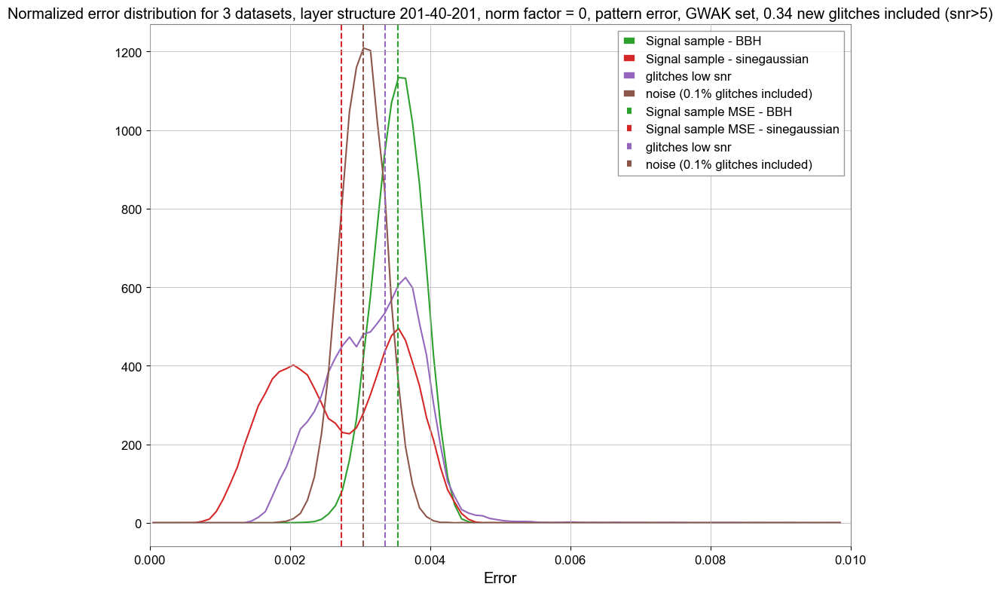

In [206]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
counts_noise, bin_position_noise = np.histogram(ReconstructedError_noise_output_200d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_noise = (bin_position_noise[:-1] + bin_position_noise[1:]) / 2


plt.figure(figsize=(12, 9))
# plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
# plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'glitches low snr')
plt.plot(bin_centers_noise, counts_noise, color = colors[5], label = 'noise (0.1% glitches included)')


# plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'glitches low snr')
plt.axvline(x = MSE_noise_output_200d, color = colors[5], linestyle = '--', label = 'noise (0.1% glitches included)')

# plt.scatter(y = np.ones(len(ReconstructedError_glitchinnoise_output_200d))*0.1, x = ReconstructedError_glitchinnoise_output_200d)


plt.xlim(0, 0.01)
# plt.ylim(0, 10)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, norm factor = 0, pattern error, GWAK set, 0.34 new glitches included (snr>5)')
plt.legend()
plt.show()

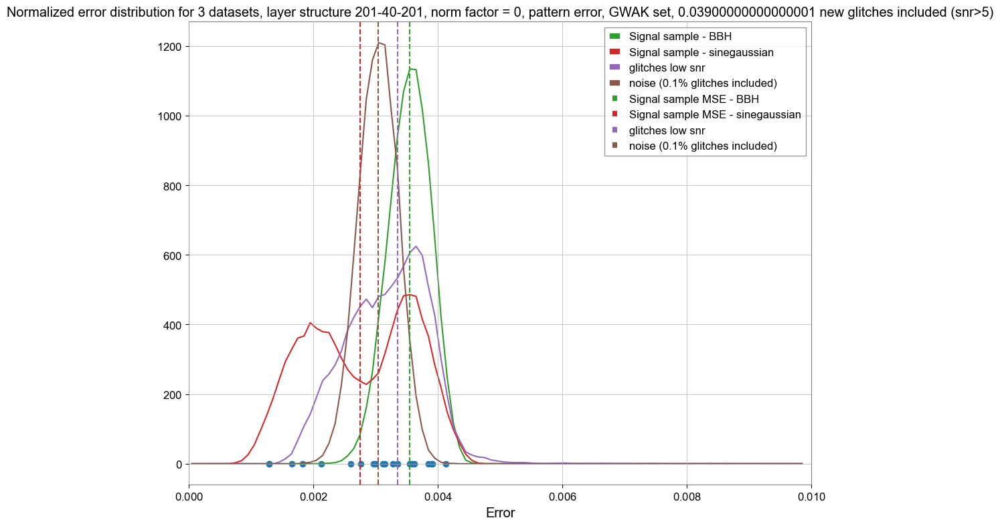

In [89]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
counts_noise, bin_position_noise = np.histogram(ReconstructedError_noise_output_200d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_noise = (bin_position_noise[:-1] + bin_position_noise[1:]) / 2


plt.figure(figsize=(12, 9))
# plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
# plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'glitches low snr')
plt.plot(bin_centers_noise, counts_noise, color = colors[5], label = 'noise (0.1% glitches included)')


# plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'glitches low snr')
plt.axvline(x = MSE_noise_output_200d, color = colors[5], linestyle = '--', label = 'noise (0.1% glitches included)')

# plt.scatter(y = np.ones(len(ReconstructedError_glitchinnoise_output_200d))*0.1, x = ReconstructedError_glitchinnoise_output_200d)


plt.xlim(0, 0.01)
# plt.ylim(0, 10)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, norm factor = 0, pattern error, GWAK set, '+str(percentage_list[i])+' new glitches included (snr>5)')
plt.legend()
plt.show()

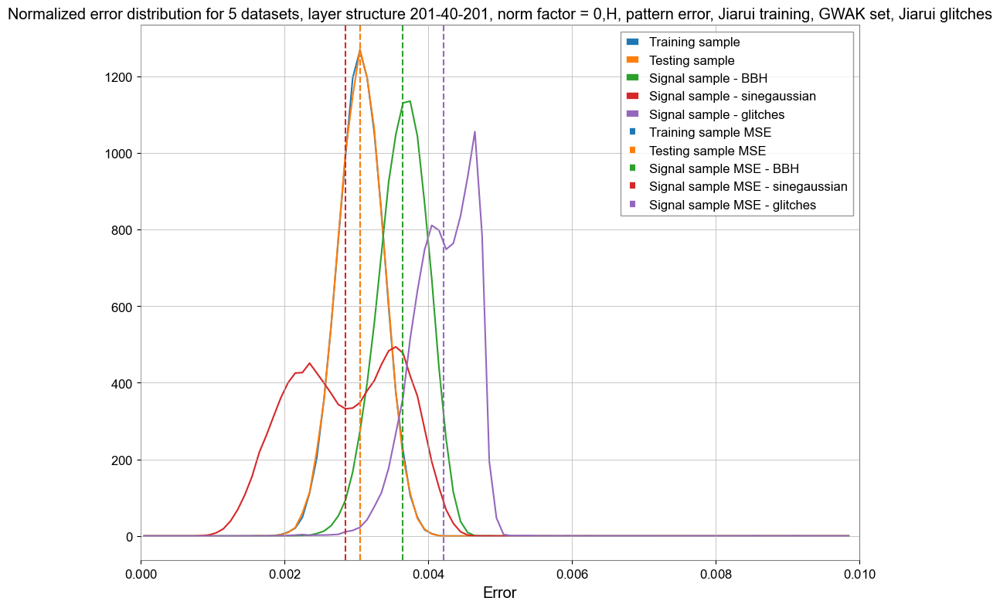

In [160]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 201-40-201, norm factor = 0,H, pattern error, Jiarui training, GWAK set, Jiarui glitches')
plt.legend()
plt.show()

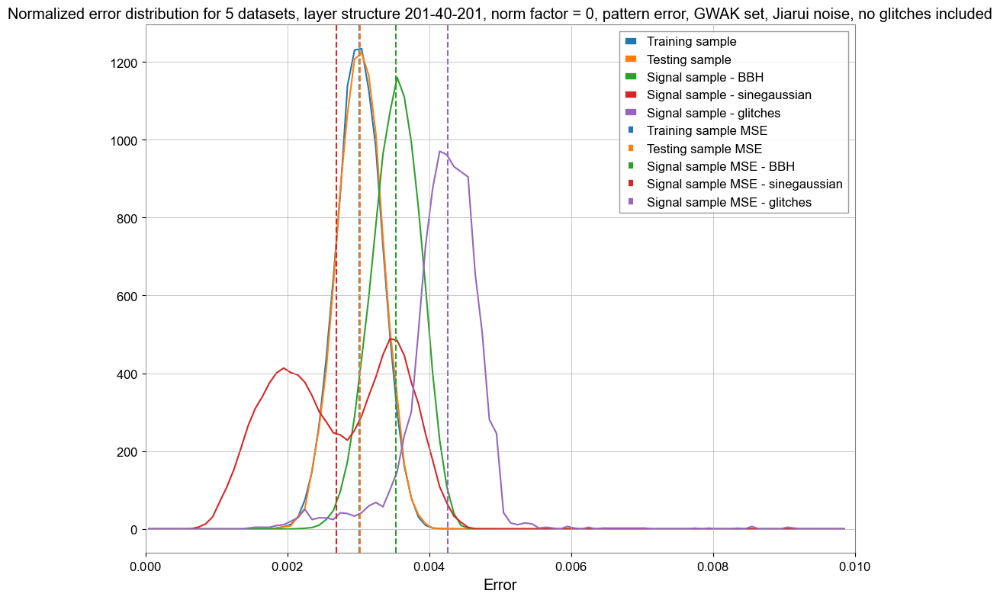

In [381]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 201-40-201, norm factor = 0, pattern error, GWAK set, Jiarui noise, no glitches included')
plt.legend()
plt.show()

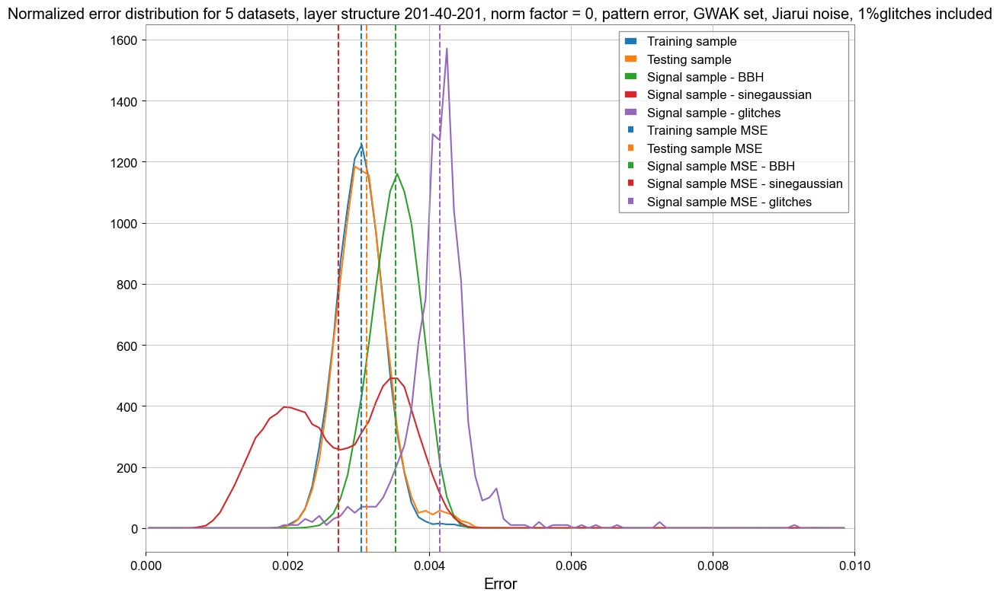

In [319]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 201-40-201, norm factor = 0, pattern error, GWAK set, Jiarui noise, 1%glitches included')
plt.legend()
plt.show()

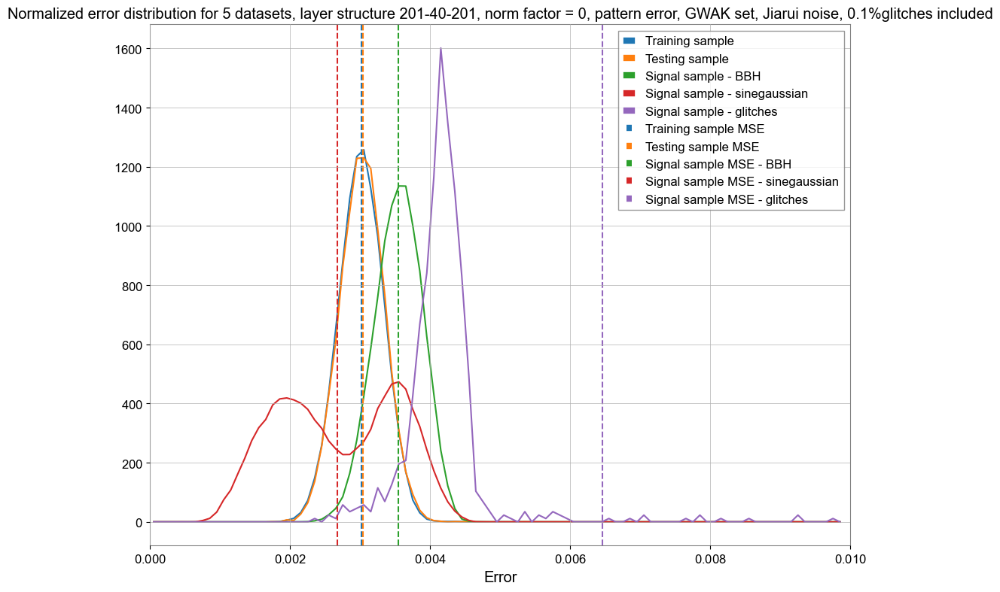

In [144]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 201-40-201, norm factor = 0, pattern error, GWAK set, Jiarui noise, 0.1%glitches included')
plt.legend()
plt.show()

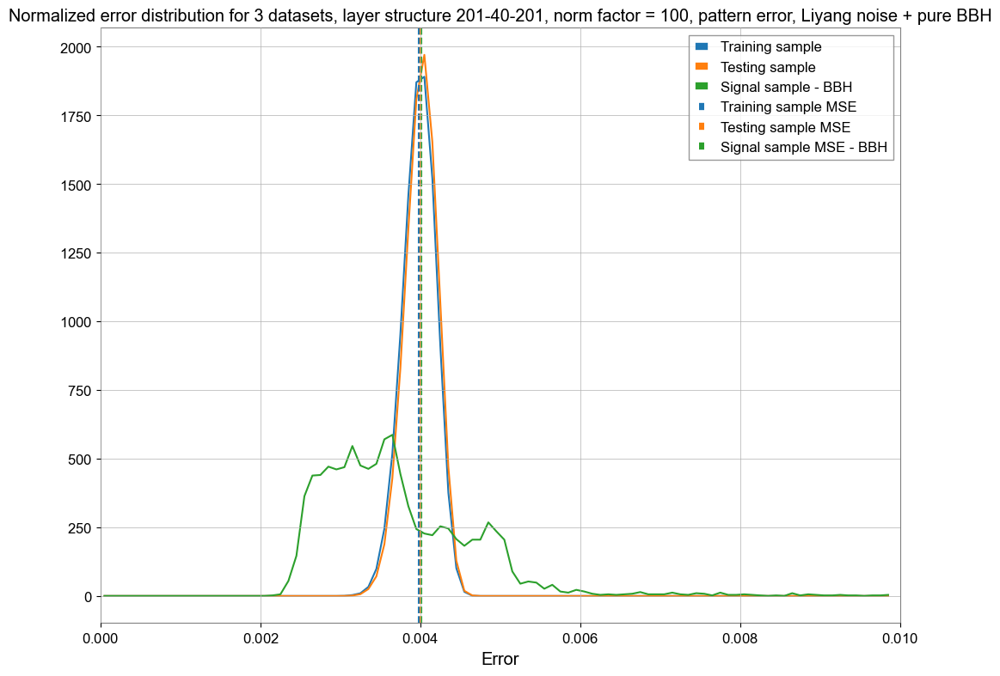

In [42]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, norm factor = 100, pattern error, Liyang noise + pure BBH')
plt.legend()
plt.show()

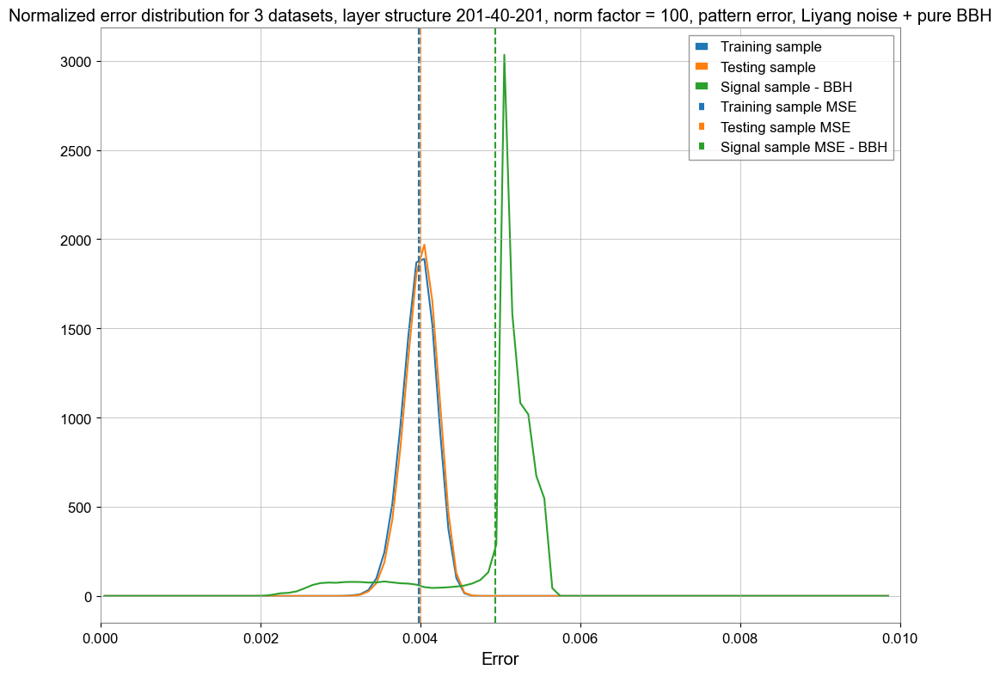

In [28]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, norm factor = 100, pattern error, Liyang noise + pure BBH')
plt.legend()
plt.show()

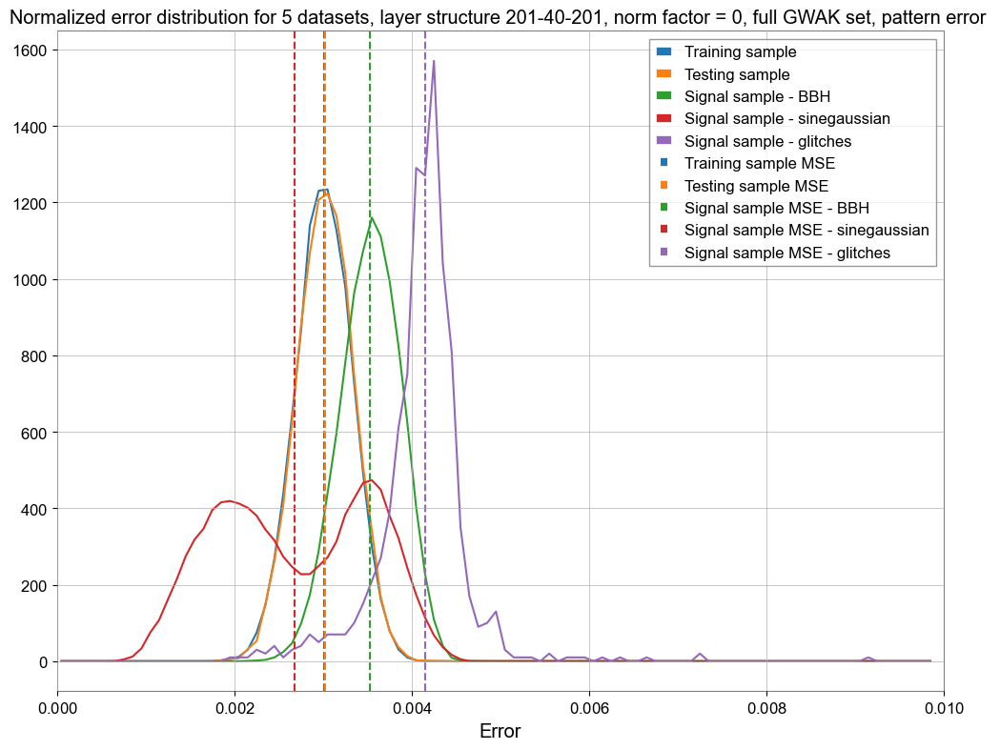

In [260]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 201-40-201, norm factor = 0, full GWAK set, pattern error ')
plt.legend()
plt.show()

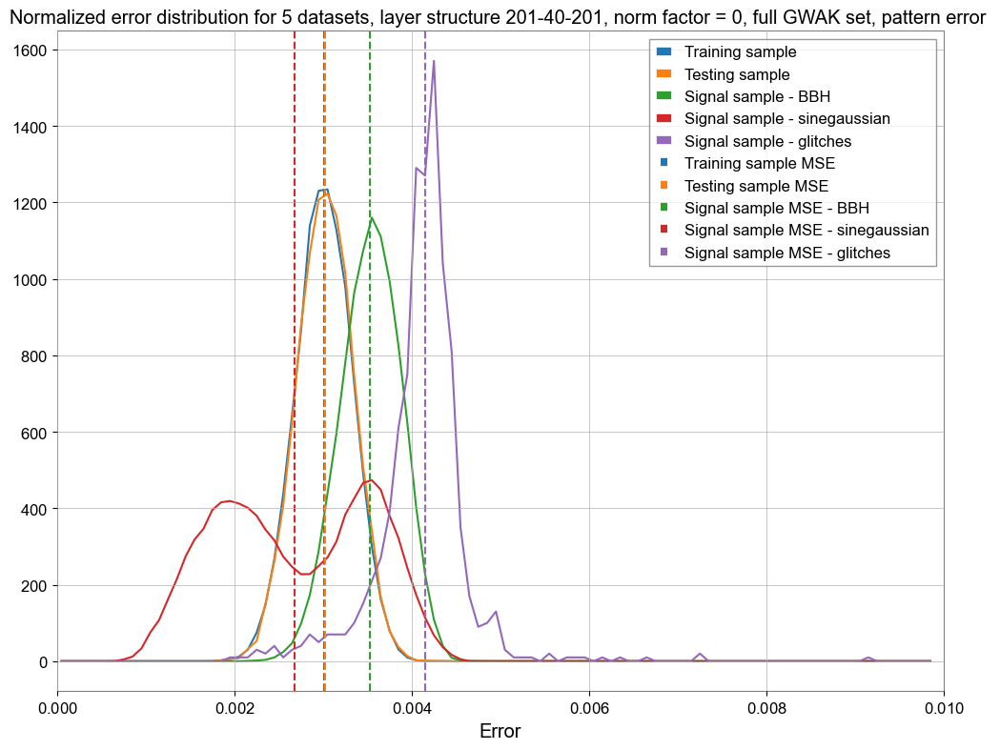

In [263]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitch_output_200d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 201-40-201, norm factor = 0, full GWAK set, pattern error ')
plt.legend()
plt.show()

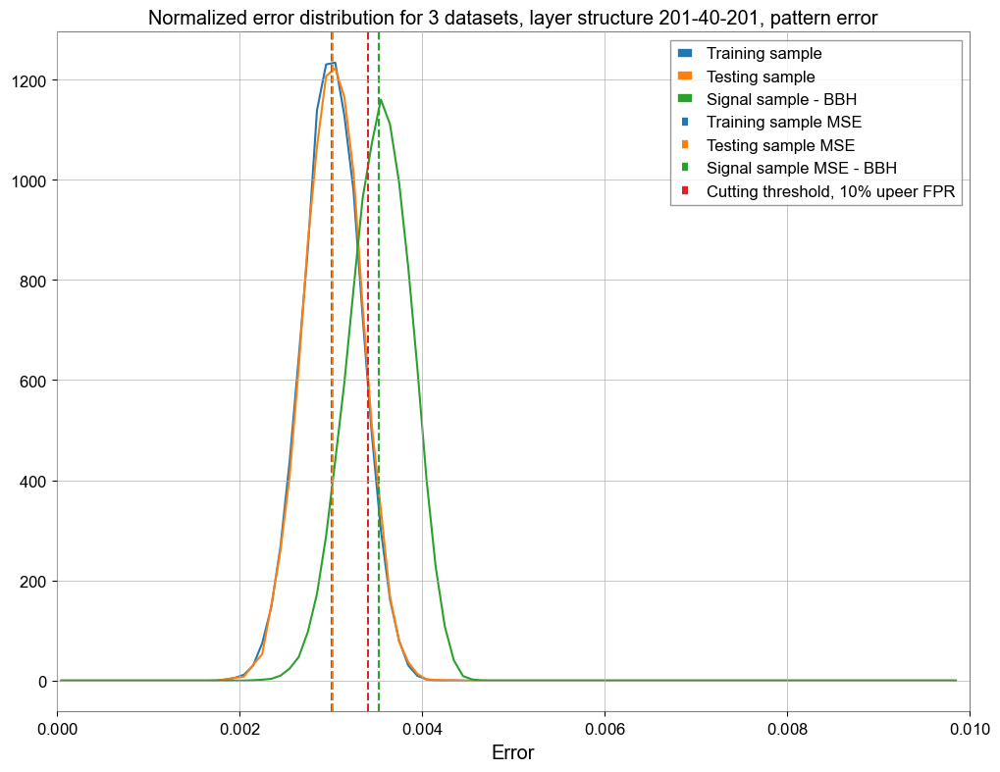

In [261]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')
plt.axvline(x = threshold, color = colors[3], linestyle = '--', label = 'Cutting threshold, 10% upeer FPR')

plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, norm factor = 0, pattern error')
plt.legend()
plt.show()

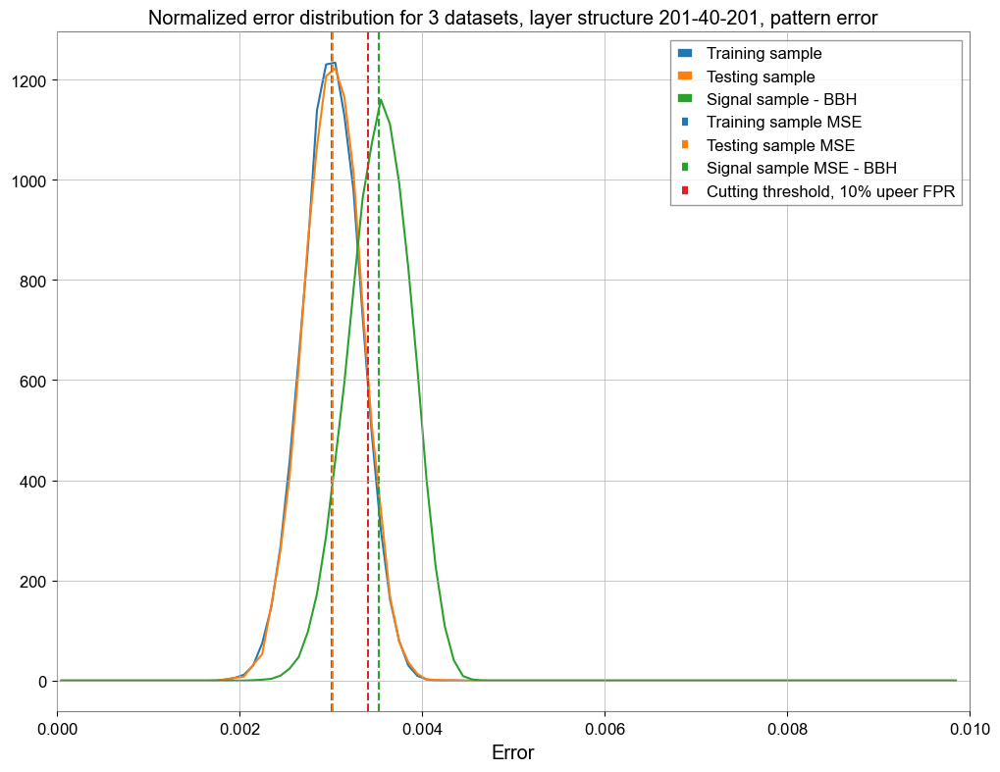

In [215]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')
plt.axvline(x = threshold, color = colors[3], linestyle = '--', label = 'Cutting threshold, 10% upeer FPR')

plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, pattern error')
plt.legend()
plt.show()

In [220]:
len(ReconstructedError_glitch_output_200d)

903

In [223]:
ReconstructedError_test_output_200d.max()

0.004300665340450178

In [236]:
thresholds = np.arange(0, 0.0043, 1e-6)

In [237]:
cache = np.zeros(len(thresholds))
for i in range(len(thresholds)):
    cache[i] = (np.argwhere(ReconstructedError_injected_output_200d > thresholds[i]).shape[0]/500 - np.argwhere(ReconstructedError_train_output_200d > thresholds[i]).shape[0])/np.sqrt(np.argwhere(ReconstructedError_train_output_200d > thresholds[i]).shape[0])
    

In [238]:
cache

array([-263.81920216, -263.81920216, -263.81920216, ...,
         -1.461     ,   -1.461     ,   -1.47      ])

In [239]:
thresholds[np.argmax(cache)]

0.004091

In [207]:
threshold

0.003413691411323263

In [240]:
FPR = np.argwhere(ReconstructedError_test_output_200d > 0.004091).shape[0] / len(ReconstructedError_test_output_200d)

In [241]:
FPR

0.00035

In [104]:
# For making the cut for the training sample for weakly-supervised learning

threshold = np.sort(ReconstructedError_noise_output_200d)[-int(len(ReconstructedError_noise_output_200d)*0.1)]

In [105]:
bbh_signal_indices = np.argwhere(ReconstructedError_injected_output_200d > threshold)
bbh_noise_indices = np.argwhere(ReconstructedError_injected_output_200d <= threshold)
bkg_signal_indices = np.argwhere(ReconstructedError_noise_output_200d > threshold)
bkg_noise_indices = np.argwhere(ReconstructedError_noise_output_200d <= threshold)

In [92]:
bbh_signal_indices = np.argwhere(ReconstructedError_injected_output_200d > thresholds[np.argmax(cache)])
bbh_noise_indices = np.argwhere(ReconstructedError_injected_output_200d <= thresholds[np.argmax(cache)])
bkg_signal_indices = np.argwhere(ReconstructedError_noise_output_200d > thresholds[np.argmax(cache)])
bkg_noise_indices = np.argwhere(ReconstructedError_noise_output_200d <= thresholds[np.argmax(cache)])

NameError: name 'thresholds' is not defined

In [208]:
# For making the cut for the training sample for weakly-supervised learning

threshold = np.sort(ReconstructedError_noise_output_200d)[int(len(ReconstructedError_noise_output_200d)*0.1)]
bbh_signal_indices = np.argwhere(ReconstructedError_sinegaussian_output_200d <= threshold)
bbh_noise_indices = np.argwhere(ReconstructedError_sinegaussian_output_200d > threshold)
bkg_signal_indices = np.argwhere(ReconstructedError_noise_output_200d <= threshold)
bkg_noise_indices = np.argwhere(ReconstructedError_noise_output_200d > threshold)

In [209]:
bbh_signal_indices.shape

(47274, 1)

In [210]:
bbh_noise_indices.shape

(52726, 1)

In [211]:
bkg_noise_indices.shape

(18017, 1)

In [212]:
bkg_signal_indices.shape

(2003, 1)

In [215]:
injection_number = int(0.001 * len(data_for_training_and_testing_tw))

# indices_for_glitch_injection = np.random.choice(len(data_glitch_normalized),size = injection_number, replace = False)
indices_for_glitch_injection = np.arange(injection_number)
indices_for_glitch_not_injected = np.setdiff1d(np.arange(len(data_glitch_normalized)), indices_for_glitch_injection)

X_train_intermediate = np.vstack((X_train, data_glitch_normalized[indices_for_glitch_injection[:int(0.7 * injection_number)]]))
X_test_intermediate = np.vstack((X_test, data_glitch_normalized[indices_for_glitch_injection[-int(0.8 * injection_number):]]))
X_validation_intermediate = np.vstack((X_validation, data_glitch_normalized[indices_for_glitch_injection[int(0.7 * injection_number):int(0.8 * injection_number)]]))

np.random.shuffle(X_train_intermediate)
np.random.shuffle(X_test_intermediate)
np.random.shuffle(X_validation_intermediate)

In [216]:
X_train_intermediate = np.vstack((X_train_ini, data_glitch[indices_for_glitch_injection[:int(0.7 * injection_number)]]))

In [217]:
X_train_intermediate.shape

(70070, 200)

In [100]:
np.savez('../Data_cached/data_for_wekaly_supervised_learning', noise_sample = X_train_intermediate, signal_sample_noise = data_noise_real_case[bkg_signal_indices], signal_sample_bbh = data_bbh_normalized[bbh_signal_indices])

In [126]:
noise_sample = X_train_intermediate
signal_sample_noise = np.vstack((X_test_ini, data_glitch[glitch_chosen_indices]))[data_noise_real_case_permutated_indices][bkg_signal_indices].reshape(-1,200)
signal_sample_bbh = data_bbh[bbh_signal_indices].reshape(-1,200)

In [127]:
full_noise_sample = np.vstack((X_test_ini, data_glitch[glitch_chosen_indices]))[data_noise_real_case_permutated_indices].reshape(-1,200)
full_bbh_sample = data_bbh.reshape(-1,200)

In [218]:
noise_sample = X_train_intermediate
signal_sample_noise = np.vstack((X_test_ini, data_glitch[glitch_chosen_indices]))[data_noise_real_case_permutated_indices][bkg_signal_indices].reshape(-1,200)
signal_sample_bbh = data_sg[bbh_signal_indices].reshape(-1,200)
full_noise_sample = np.vstack((X_test_ini, data_glitch[glitch_chosen_indices]))[data_noise_real_case_permutated_indices].reshape(-1,200)
full_bbh_sample = data_sg.reshape(-1,200)

In [219]:
signal_sample_noise.shape

(2003, 200)

In [220]:
signal_sample_bbh.shape

(47274, 200)

In [221]:
full_noise_sample.shape

(20020, 200)

In [222]:
full_bbh_sample.shape

(100000, 200)

In [223]:
np.savez('../Data_cached/data_for_wekaly_supervised_learning_sinegaussian', noise_sample = X_train_intermediate, signal_sample_noise = signal_sample_noise, signal_sample_sg = signal_sample_bbh, full_noise_sample = full_noise_sample, full_sg_sample = full_bbh_sample)

In [214]:
np.savez('../Data_cached/indices_for_weakly_supervised_training_1e-1_test_noise_with_glitches.npz', bbh_signal_indices = bbh_signal_indices, bbh_noise_indices = bbh_noise_indices, bkg_signal_indices = bkg_signal_indices, bkg_noise_indices = bkg_noise_indices)

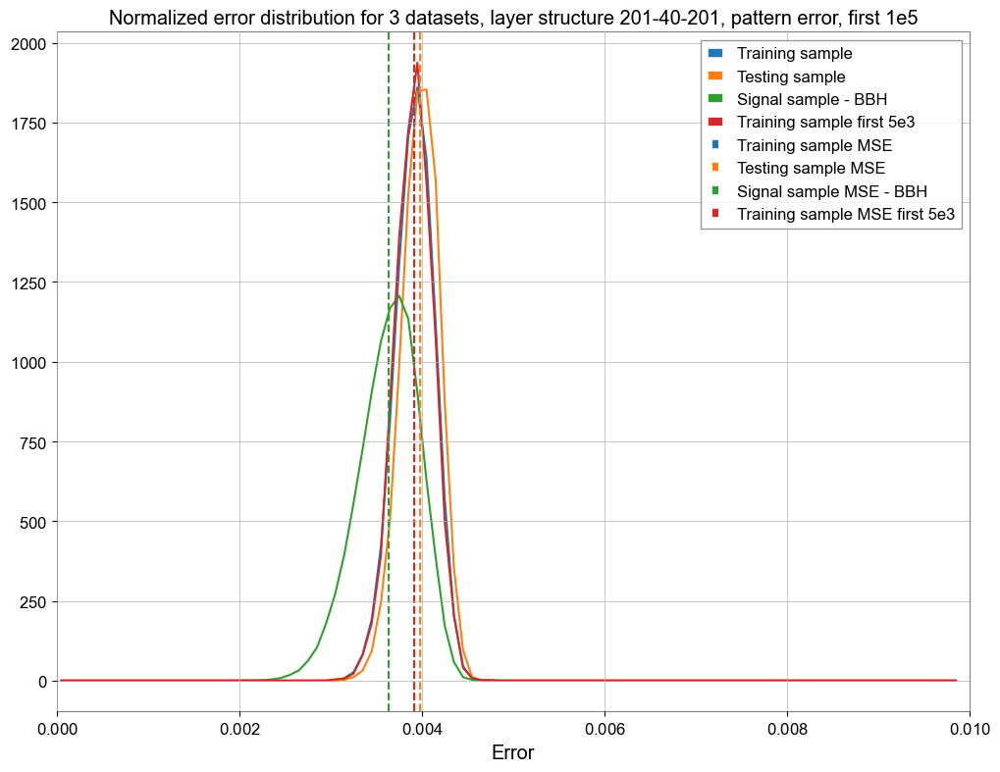

In [136]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, pattern error')
plt.legend()
plt.show()

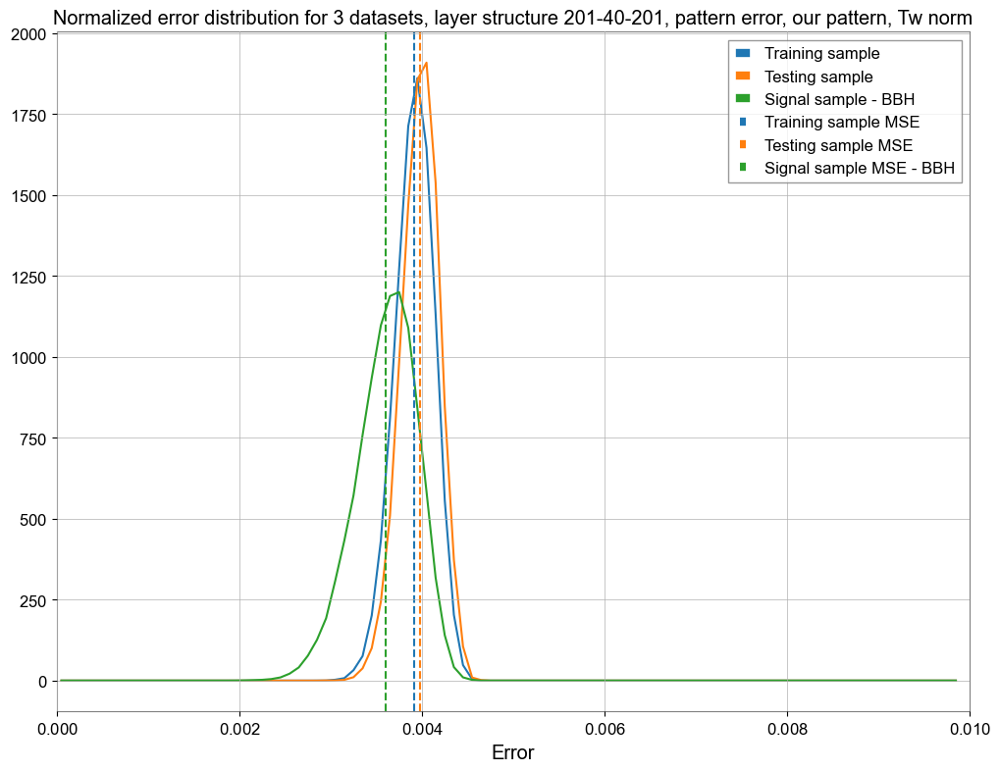

In [222]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, pattern error, our pattern, Tw norm')
plt.legend()
plt.show()

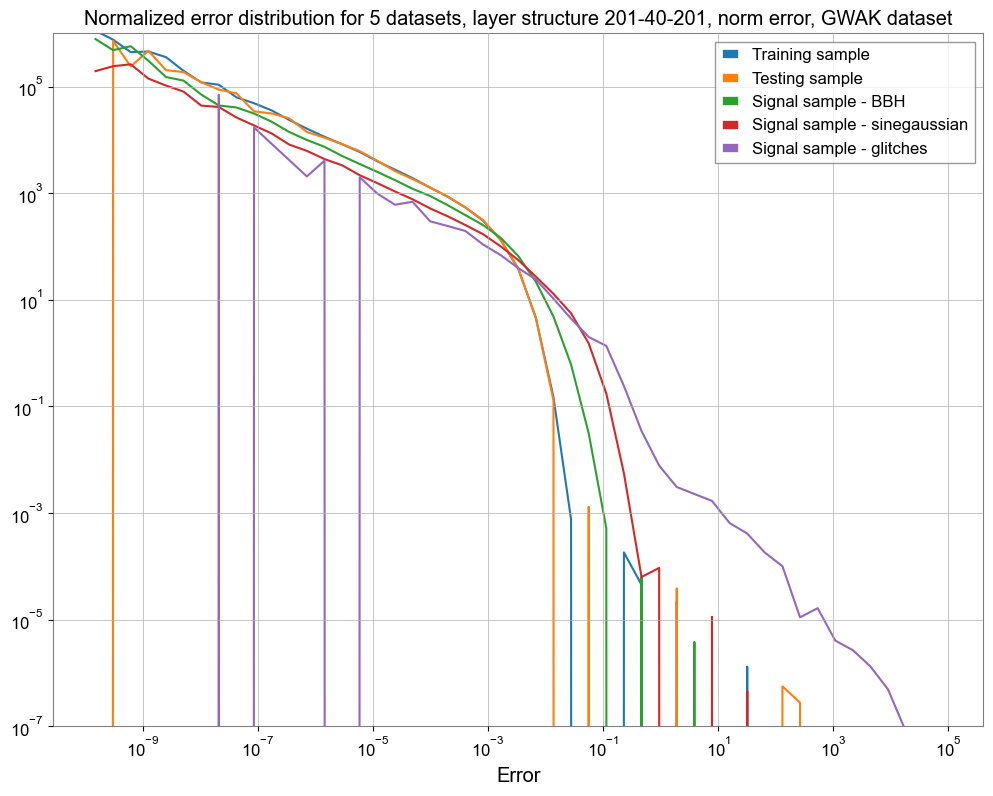

In [367]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.logspace(-10, 5, 50)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_1d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_1d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


# plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitch_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


# plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.ylim(1e-7,1e6)

plt.title('Normalized error distribution for 5 datasets, layer structure 201-40-201, norm error, GWAK dataset')
plt.legend()
plt.show()

In [345]:
ReconstructedError_injected_output_1d.min()

1.2789769243681803e-13

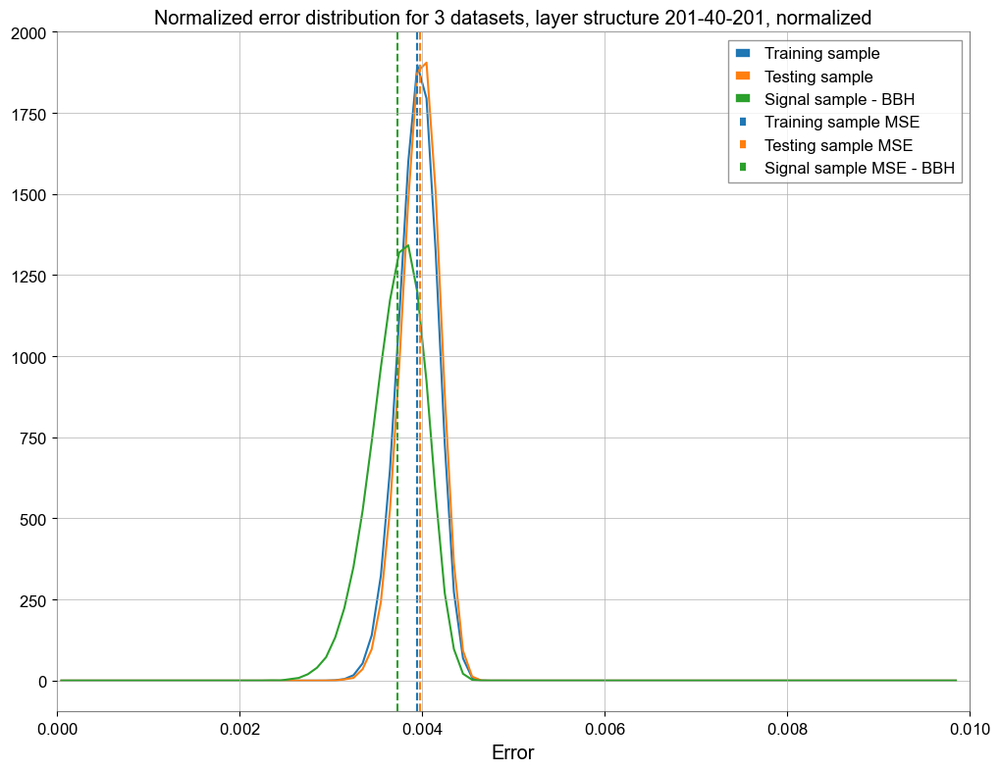

In [63]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 201-40-201, normalized')
plt.legend()
plt.show()

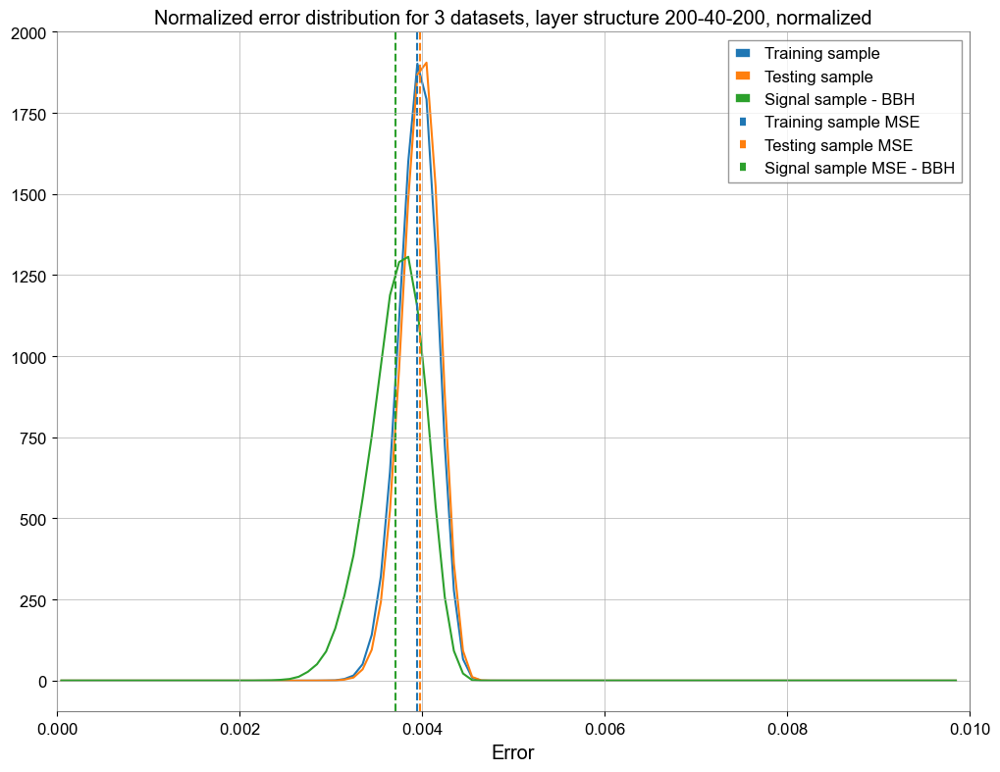

In [30]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 200-40-200, normalized')
plt.legend()
plt.show()

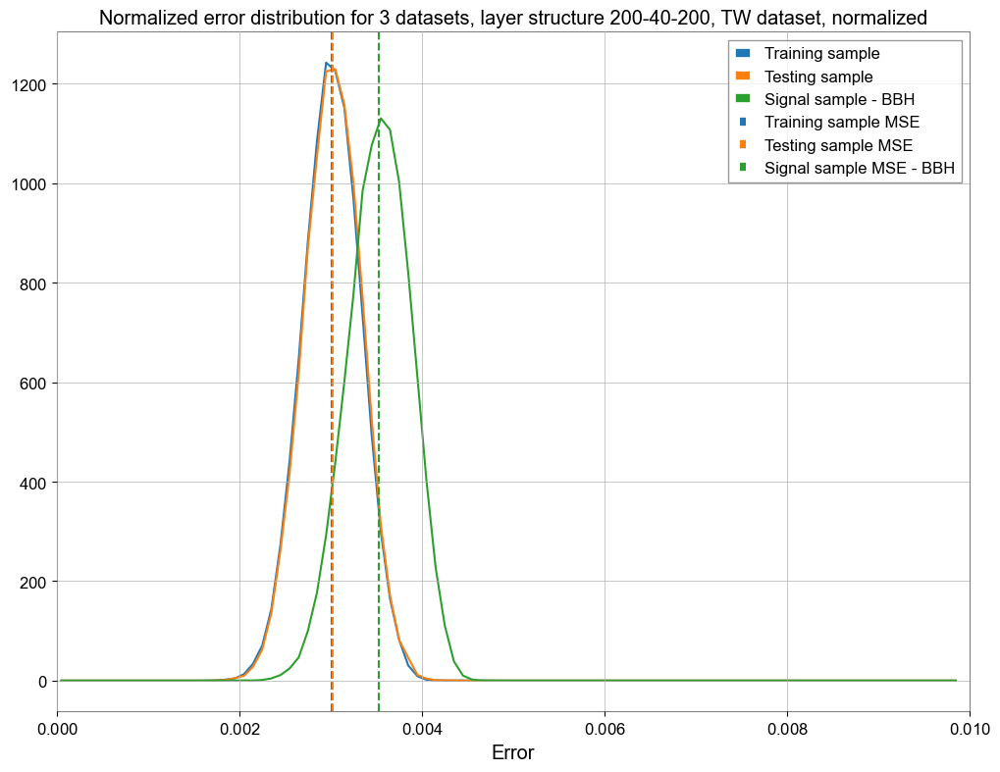

In [477]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 200-40-200, TW dataset, normalized')
plt.legend()
plt.show()

### Bunch plotting

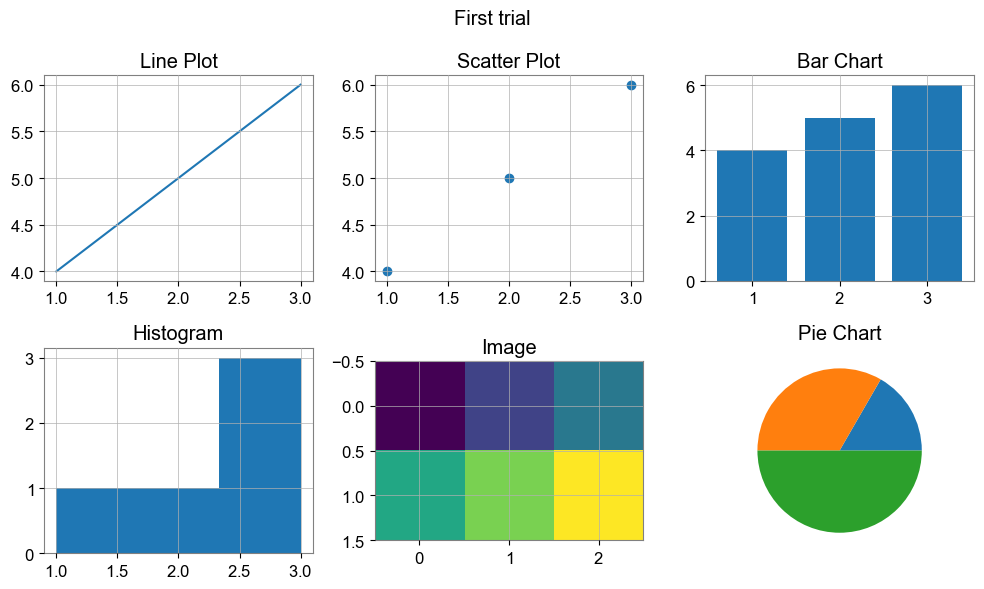

In [142]:
fig, axes = plt.subplots(2, 3, figsize=(10, 6))

# 在每个小图上进行绘制
axes[0, 0].plot([1, 2, 3], [4, 5, 6])  # 第一张小图
axes[0, 1].scatter([1, 2, 3], [4, 5, 6])  # 第二张小图
axes[0, 2].bar([1, 2, 3], [4, 5, 6])  # 第三张小图
axes[1, 0].hist([1, 2, 3, 3, 3], bins=3)  # 第四张小图
axes[1, 1].imshow([[1, 2, 3], [4, 5, 6]])  # 第五张小图
axes[1, 2].pie([1, 2, 3])  # 第六张小图

# 可以为每个小图添加标题等其他装饰
axes[0, 0].set_title("Line Plot")
axes[0, 1].set_title("Scatter Plot")
axes[0, 2].set_title("Bar Chart")
axes[1, 0].set_title("Histogram")
axes[1, 1].set_title("Image")
axes[1, 2].set_title("Pie Chart")

# 调整子图之间的距离
plt.suptitle('First trial')

plt.tight_layout()

# 显示图形
plt.show()

In [276]:
trainData_ini = trainData.clone()
testData_ini = testData.clone()
bbhData_ini = bbhData.clone()
sgData_ini = sgData.clone()

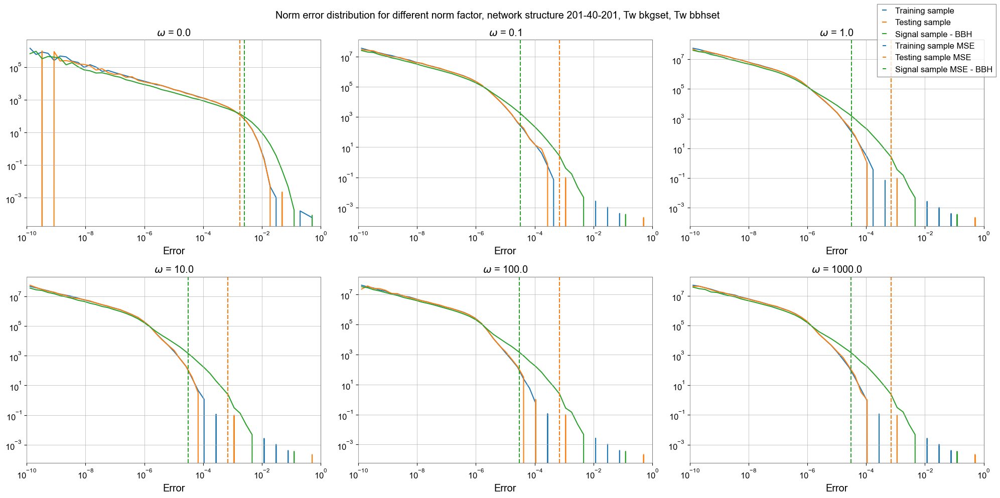

In [379]:
model_list = ['model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.logspace(-10, 0, 50)

legend_lines = []

for i in range(6):
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == -1:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
    counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
    # counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    # bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    # bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    # bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


    # plt.figure(figsize=(12, 9))
    axes[i//3, i % 3].plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    axes[i//3, i % 3].plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    axes[i//3, i % 3].plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    # axes[i//3, i % 3].plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    # plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


    axes[i//3, i % 3].axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    # axes[i//3, i % 3].axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    # plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


    axes[i//3, i % 3].set_xlim(1e-10, 1)
    axes[i//3, i % 3].set_xlabel('Error')
    axes[i//3, i % 3].set_xscale('log')
    axes[i//3, i % 3].set_yscale('log')
    axes[i//3, i % 3].set_title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
plt.suptitle('Norm error distribution for different norm factor, network structure 201-40-201, Tw bkgset, Tw bbhset')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

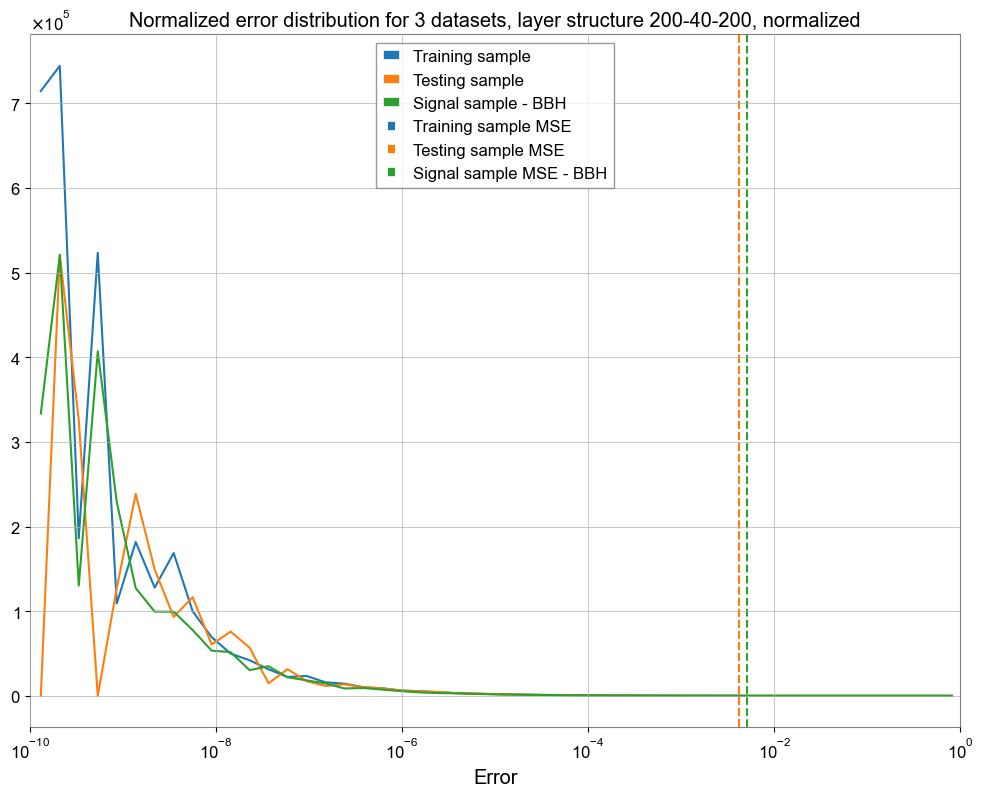

In [378]:
model = torch.load('../Model_cached/model_200-40-200_0_twdataset_normalized.pt')

trainData = trainData_ini[:,:200]
testData = testData_ini[:,:200]
bbhData = bbhData_ini[:,:200]
sgData = sgData_ini[:,:200]

_, decodedTestdata = model(trainData)
decodedTestdata = decodedTestdata.double()
reconstructedData_train = decodedTestdata.detach().numpy()
ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
MSE_train = ReconstructedError_train.mean()

X_train_output = X_train[:, :200]
reconstructedData_train_output = reconstructedData_train[:, :200]

ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
MSE_train_output_1d = ReconstructedError_train_output_1d.mean()

_, decodedTestdata = model(testData)
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()
ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
MSE_test = ReconstructedError_test.mean()

X_test_output = X_test[:, :200]
reconstructedData_test_output = reconstructedData_test[:, :200]

ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
MSE_test_output_1d = ReconstructedError_train_output_1d.mean()

_, decodedTestdata = model(bbhData)
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()
ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
MSE_injected = ReconstructedError_injected.mean()

ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()

_, decodedTestdata = model(sgData)
decodedTestdata = decodedTestdata.double()
reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()


counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(1e-10,1)
plt.xlabel('Error')
plt.xscale('log')
plt.title('Normalized norm error distribution for 3 datasets, layer structure 200-40-200, normalized')
plt.legend()
plt.show()

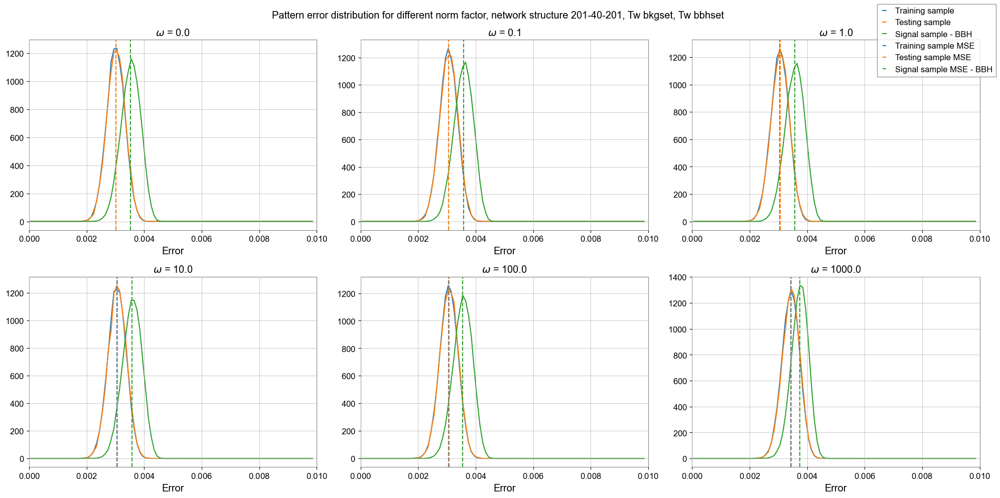

In [478]:
model_list = ['model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

legend_lines = []

for i in range(6):
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == -1:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
    # counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
    # counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    # bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    # bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


    # plt.figure(figsize=(12, 9))
    axes[i//3, i % 3].plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    axes[i//3, i % 3].plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    axes[i//3, i % 3].plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    # axes[i//3, i % 3].plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    # plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


    axes[i//3, i % 3].axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    # axes[i//3, i % 3].axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    # plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


    axes[i//3, i % 3].set_xlim(0, 0.01)
    axes[i//3, i % 3].set_xlabel('Error')
    axes[i//3, i % 3].set_title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
plt.suptitle('Pattern error distribution for different norm factor, network structure 201-40-201, Tw bkgset, Tw bbhset')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

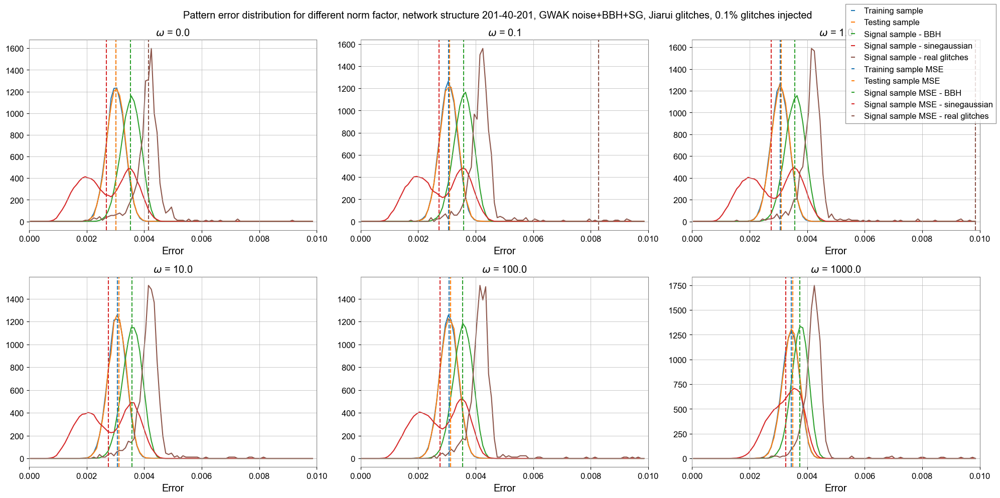

In [130]:
model_list = ['model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

legend_lines = []

for i in range(6):
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == -1:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
        glitchData = glitchData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
        glitchData = glitchData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    _, decodedTestdata = model(glitchData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_glitch = decodedTestdata.detach().numpy()
    ReconstructedError_glitch = torch.mean((glitchData - reconstructedData_glitch)**2,dim=1)
    MSE_glitch = ReconstructedError_glitch.mean()

    ReconstructedError_glitch_output_200d = np.mean((glitchData.numpy()[:, :200] - reconstructedData_glitch[:, :200])**2, axis = 1)
    MSE_glitch_output_200d = ReconstructedError_glitch_output_200d.mean()

    ReconstructedError_glitch_output_1d = (glitchData.numpy()[:, -1] - reconstructedData_glitch[:, -1])**2
    MSE_glitch_output_1d = ReconstructedError_glitch_output_1d.mean()
    
    

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
    counts_glitch, bin_position_glitch = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
    # counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
    # counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    bin_centers_glitch = (bin_position_glitch[:-1] + bin_position_glitch[1:]) / 2
    # bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    # bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


    # plt.figure(figsize=(12, 9))
    axes[i//3, i % 3].plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    axes[i//3, i % 3].plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    axes[i//3, i % 3].plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    axes[i//3, i % 3].plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    axes[i//3, i % 3].plot(bin_centers_glitch, counts_glitch, color = colors[5], label = 'Signal sample - real glitches')


    axes[i//3, i % 3].axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    axes[i//3, i % 3].axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    axes[i//3, i % 3].axvline(x = MSE_glitch_output_200d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


    axes[i//3, i % 3].set_xlim(0, 0.01)
    axes[i//3, i % 3].set_xlabel('Error')
    axes[i//3, i % 3].set_title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
plt.suptitle('Pattern error distribution for different norm factor, network structure 201-40-201, GWAK noise+BBH+SG, Jiarui glitches, 0.1% glitches injected')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

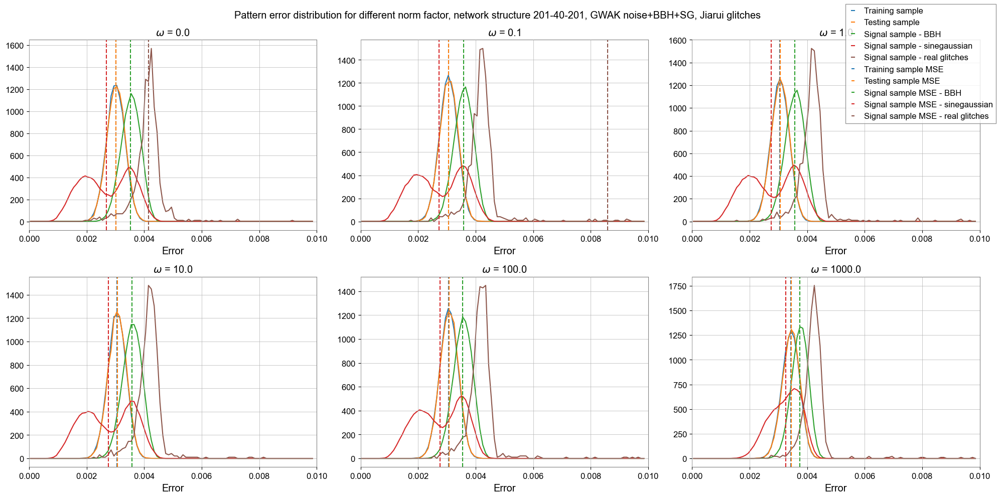

In [162]:
model_list = ['model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

legend_lines = []

for i in range(6):
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == -1:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
        glitchData = glitchData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
        glitchData = glitchData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    _, decodedTestdata = model(glitchData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_glitch = decodedTestdata.detach().numpy()
    ReconstructedError_glitch = torch.mean((glitchData - reconstructedData_glitch)**2,dim=1)
    MSE_glitch = ReconstructedError_glitch.mean()

    ReconstructedError_glitch_output_200d = np.mean((glitchData.numpy()[:, :200] - reconstructedData_glitch[:, :200])**2, axis = 1)
    MSE_glitch_output_200d = ReconstructedError_glitch_output_200d.mean()

    ReconstructedError_glitch_output_1d = (glitchData.numpy()[:, -1] - reconstructedData_glitch[:, -1])**2
    MSE_glitch_output_1d = ReconstructedError_glitch_output_1d.mean()
    
    

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
    counts_glitch, bin_position_glitch = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
    # counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
    # counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    bin_centers_glitch = (bin_position_glitch[:-1] + bin_position_glitch[1:]) / 2
    # bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    # bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


    # plt.figure(figsize=(12, 9))
    axes[i//3, i % 3].plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    axes[i//3, i % 3].plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    axes[i//3, i % 3].plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    axes[i//3, i % 3].plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    axes[i//3, i % 3].plot(bin_centers_glitch, counts_glitch, color = colors[5], label = 'Signal sample - real glitches')


    axes[i//3, i % 3].axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    axes[i//3, i % 3].axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    axes[i//3, i % 3].axvline(x = MSE_glitch_output_200d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


    axes[i//3, i % 3].set_xlim(0, 0.01)
    axes[i//3, i % 3].set_xlabel('Error')
    axes[i//3, i % 3].set_title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
plt.suptitle('Pattern error distribution for different norm factor, network structure 201-40-201, GWAK noise+BBH+SG, Jiarui glitches')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

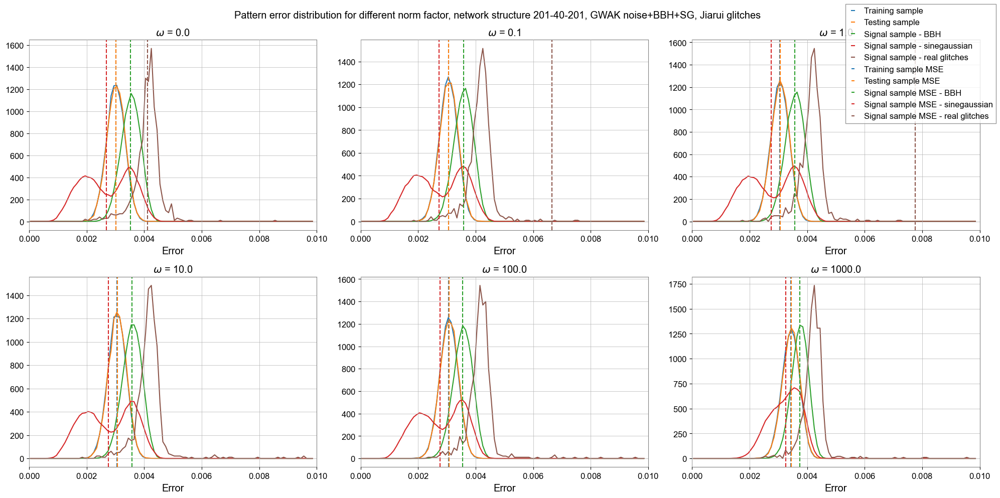

In [117]:
model_list = ['model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

legend_lines = []

for i in range(6):
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == -1:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
        glitchData = glitchData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
        glitchData = glitchData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    _, decodedTestdata = model(glitchData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_glitch = decodedTestdata.detach().numpy()
    ReconstructedError_glitch = torch.mean((glitchData - reconstructedData_glitch)**2,dim=1)
    MSE_glitch = ReconstructedError_glitch.mean()

    ReconstructedError_glitch_output_200d = np.mean((glitchData.numpy()[:, :200] - reconstructedData_glitch[:, :200])**2, axis = 1)
    MSE_glitch_output_200d = ReconstructedError_glitch_output_200d.mean()

    ReconstructedError_glitch_output_1d = (glitchData.numpy()[:, -1] - reconstructedData_glitch[:, -1])**2
    MSE_glitch_output_1d = ReconstructedError_glitch_output_1d.mean()
    
    

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
    counts_glitch, bin_position_glitch = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
    # counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
    # counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    bin_centers_glitch = (bin_position_glitch[:-1] + bin_position_glitch[1:]) / 2
    # bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    # bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


    # plt.figure(figsize=(12, 9))
    axes[i//3, i % 3].plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    axes[i//3, i % 3].plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    axes[i//3, i % 3].plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    axes[i//3, i % 3].plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    axes[i//3, i % 3].plot(bin_centers_glitch, counts_glitch, color = colors[5], label = 'Signal sample - real glitches')


    axes[i//3, i % 3].axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    axes[i//3, i % 3].axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    axes[i//3, i % 3].axvline(x = MSE_glitch_output_200d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


    axes[i//3, i % 3].set_xlim(0, 0.01)
    axes[i//3, i % 3].set_xlabel('Error')
    axes[i//3, i % 3].set_title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
plt.suptitle('Pattern error distribution for different norm factor, network structure 201-40-201, GWAK noise+BBH+SG, Jiarui glitches')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

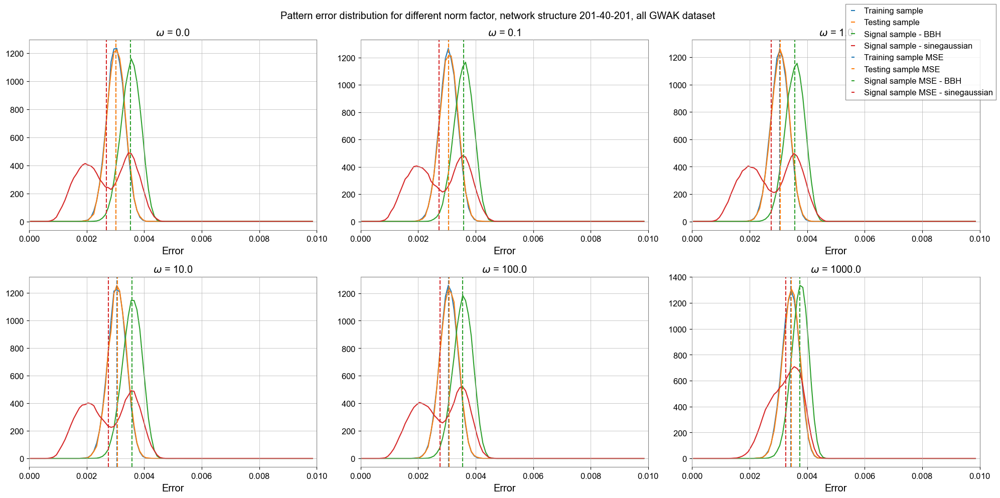

In [82]:
model_list = ['model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

legend_lines = []

for i in range(6):
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == -1:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
        glitchData = glitchData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
        glitchData = glitchData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    _, decodedTestdata = model(glitchData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_glitch = decodedTestdata.detach().numpy()
    ReconstructedError_glitch = torch.mean((glitchData - reconstructedData_glitch)**2,dim=1)
    MSE_glitch = ReconstructedError_glitch.mean()

    ReconstructedError_glitch_output_200d = np.mean((glitchData.numpy()[:, :200] - reconstructedData_glitch[:, :200])**2, axis = 1)
    MSE_glitch_output_200d = ReconstructedError_glitch_output_200d.mean()

    ReconstructedError_glitch_output_1d = (glitchData.numpy()[:, -1] - reconstructedData_glitch[:, -1])**2
    MSE_glitch_output_1d = ReconstructedError_glitch_output_1d.mean()
    
    

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
    counts_glitch, bin_position_glitch = np.histogram(ReconstructedError_glitch_output_200d, bins = bin_scheme, density = True)
    # counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
    # counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    bin_centers_glitch = (bin_position_glitch[:-1] + bin_position_glitch[1:]) / 2
    # bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    # bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


    # plt.figure(figsize=(12, 9))
    axes[i//3, i % 3].plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    axes[i//3, i % 3].plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    axes[i//3, i % 3].plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    axes[i//3, i % 3].plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    axes[i//3, i % 3]..plot(bin_centers_glitch, counts_glitch, color = colors[5], label = 'Signal sample - real glitches')


    axes[i//3, i % 3].axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    axes[i//3, i % 3].axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    axes[i//3, i % 3].axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    axes[i//3, i % 3].axvline(x = MSE_glitch_output_200d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


    axes[i//3, i % 3].set_xlim(0, 0.01)
    axes[i//3, i % 3].set_xlabel('Error')
    axes[i//3, i % 3].set_title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
plt.suptitle('Pattern error distribution for different norm factor, network structure 201-40-201, all GWAK dataset')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

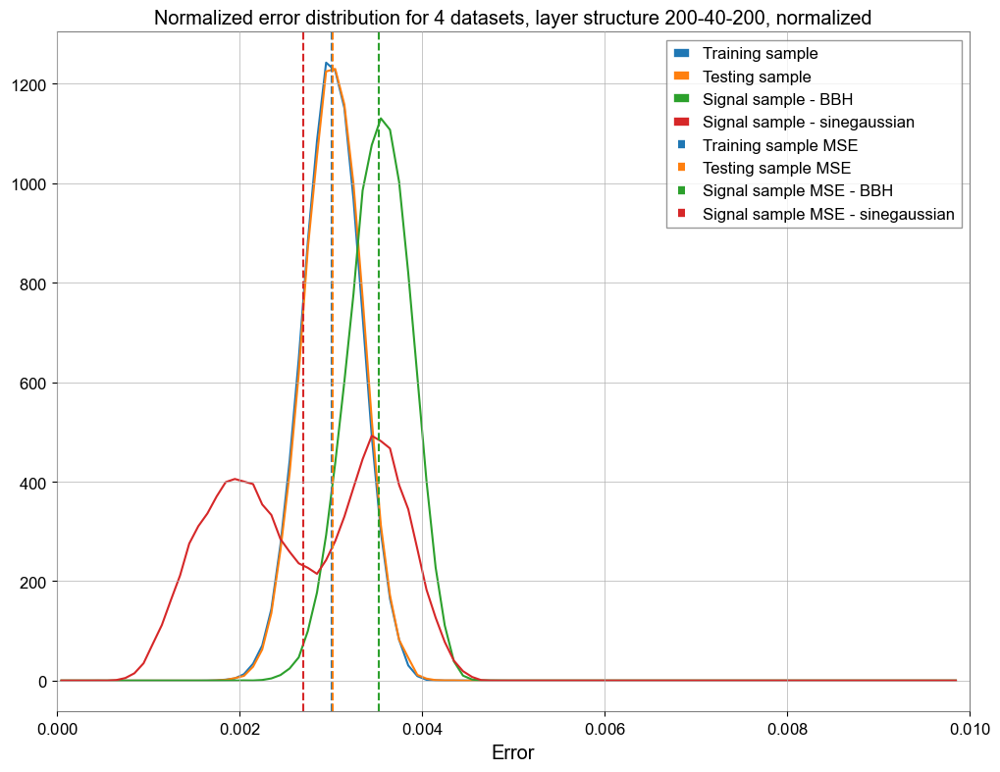

In [83]:
model = torch.load('../Model_cached/model_200-40-200_0_twdataset_normalized.pt')

trainData = trainData_ini[:,:200]
testData = testData_ini[:,:200]
bbhData = bbhData_ini[:,:200]
sgData = sgData_ini[:,:200]

_, decodedTestdata = model(trainData)
decodedTestdata = decodedTestdata.double()
reconstructedData_train = decodedTestdata.detach().numpy()
ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
MSE_train = ReconstructedError_train.mean()

X_train_output = X_train[:, :200]
reconstructedData_train_output = reconstructedData_train[:, :200]

ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
MSE_train_output_1d = ReconstructedError_train_output_1d.mean()

_, decodedTestdata = model(testData)
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()
ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
MSE_test = ReconstructedError_test.mean()

X_test_output = X_test[:, :200]
reconstructedData_test_output = reconstructedData_test[:, :200]

ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
MSE_test_output_1d = ReconstructedError_train_output_1d.mean()

_, decodedTestdata = model(bbhData)
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()
ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
MSE_injected = ReconstructedError_injected.mean()

ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()

_, decodedTestdata = model(sgData)
decodedTestdata = decodedTestdata.double()
reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()


counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 4 datasets, layer structure 200-40-200, normalized')
plt.legend()
plt.show()

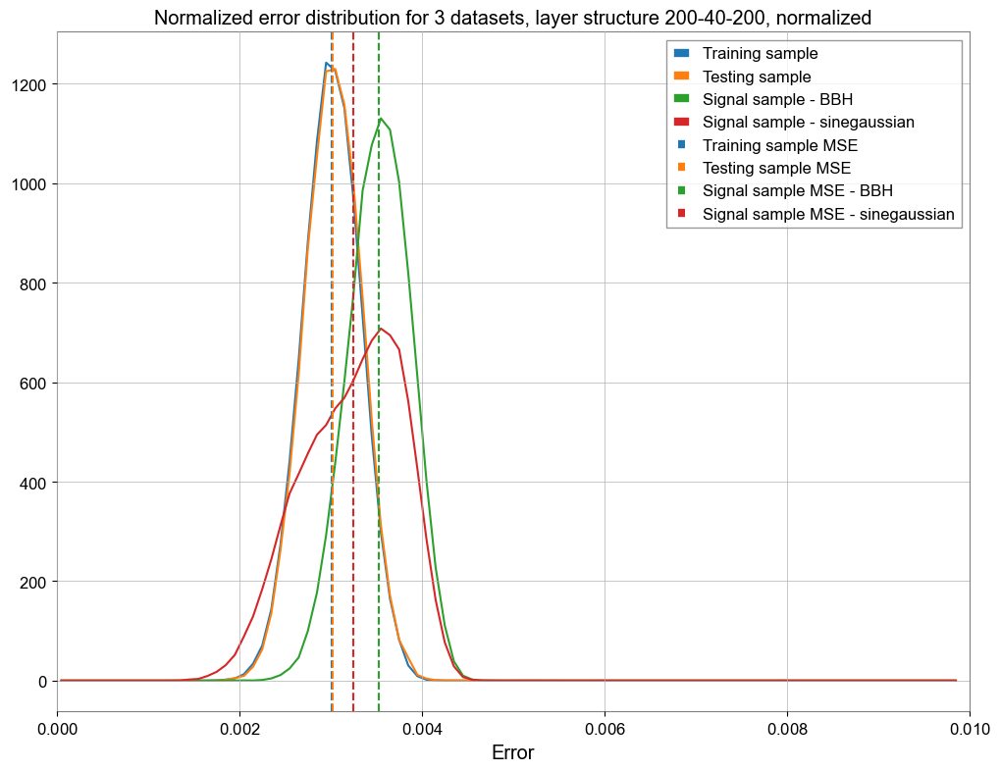

In [323]:
model = torch.load('../Model_cached/model_200-40-200_0_twdataset_normalized.pt')

trainData = trainData_ini[:,:200]
testData = testData_ini[:,:200]
bbhData = bbhData_ini[:,:200]

_, decodedTestdata = model(trainData)
decodedTestdata = decodedTestdata.double()
reconstructedData_train = decodedTestdata.detach().numpy()
ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
MSE_train = ReconstructedError_train.mean()

X_train_output = X_train[:, :200]
reconstructedData_train_output = reconstructedData_train[:, :200]

ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
MSE_train_output_1d = ReconstructedError_train_output_1d.mean()

_, decodedTestdata = model(testData)
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()
ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
MSE_test = ReconstructedError_test.mean()

X_test_output = X_test[:, :200]
reconstructedData_test_output = reconstructedData_test[:, :200]

ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
MSE_test_output_1d = ReconstructedError_train_output_1d.mean()

_, decodedTestdata = model(bbhData)
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()
ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
MSE_injected = ReconstructedError_injected.mean()

ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()

_, decodedTestdata = autoencoder(sgData)
decodedTestdata = decodedTestdata.double()
reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()


counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 200-40-200, normalized')
plt.legend()
plt.show()

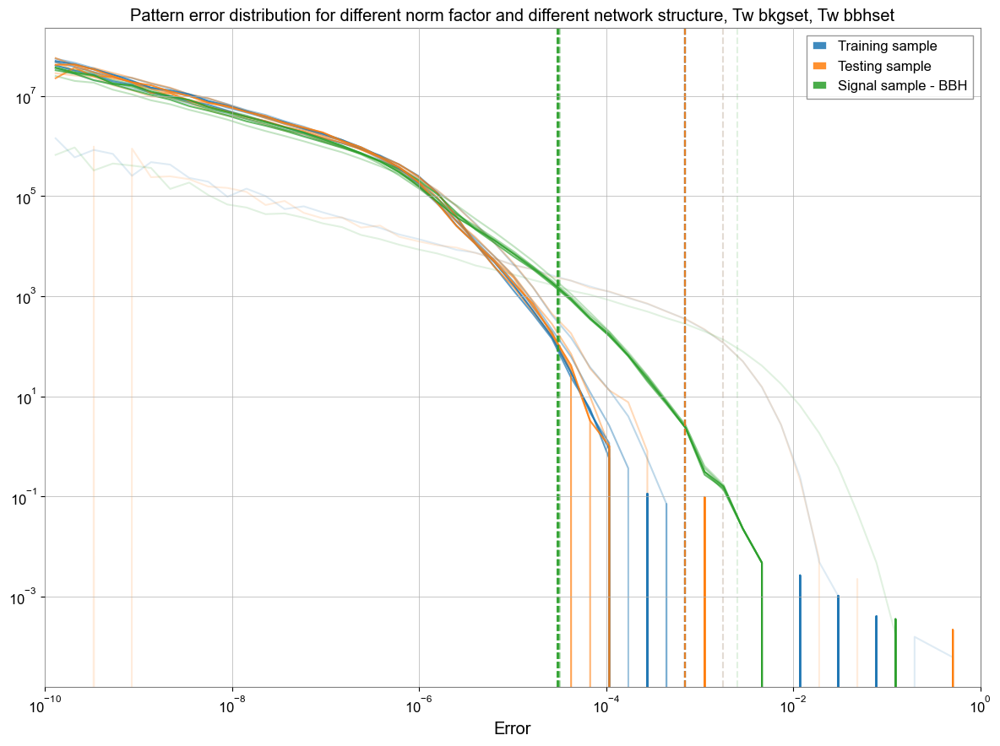

In [382]:
model_list = ['model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

plt.figure(figsize=(12, 9))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
# bin_scheme = np.arange(0, 1e-2, 1e-4)
bin_scheme = np.logspace(-10, 0, 50)
alpha_set = np.arange(1/7,1.01, 1/7)

legend_lines = []

for i in range(6):
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == -1:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_1d, bins = bin_scheme, density = True)
    # counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
    # counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    # bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    # bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


    # plt.figure(figsize=(12, 9))
    line1,  = plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample', alpha = alpha_set[i])
    line2,  =plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample', alpha = alpha_set[i])
    line3,  =plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH', alpha = alpha_set[i])
    # plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    # plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


    plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE', alpha = alpha_set[i])
    plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE', alpha = alpha_set[i])
    plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH', alpha = alpha_set[i])
    # plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    # plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(1e-10, 1)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Error')
# plt.title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
# plt.legend(loc='upper right')

legend_lines = []

# 将特定的线条添加到图例列表中
legend_lines.append(line1)
legend_lines.append(line2)
legend_lines.append(line3)

# 创建图例，并只显示特定的线条
plt.legend(handles=legend_lines)

# 调整子图之间的距离
plt.title('Pattern error distribution for different norm factor and different network structure, Tw bkgset, Tw bbhset')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

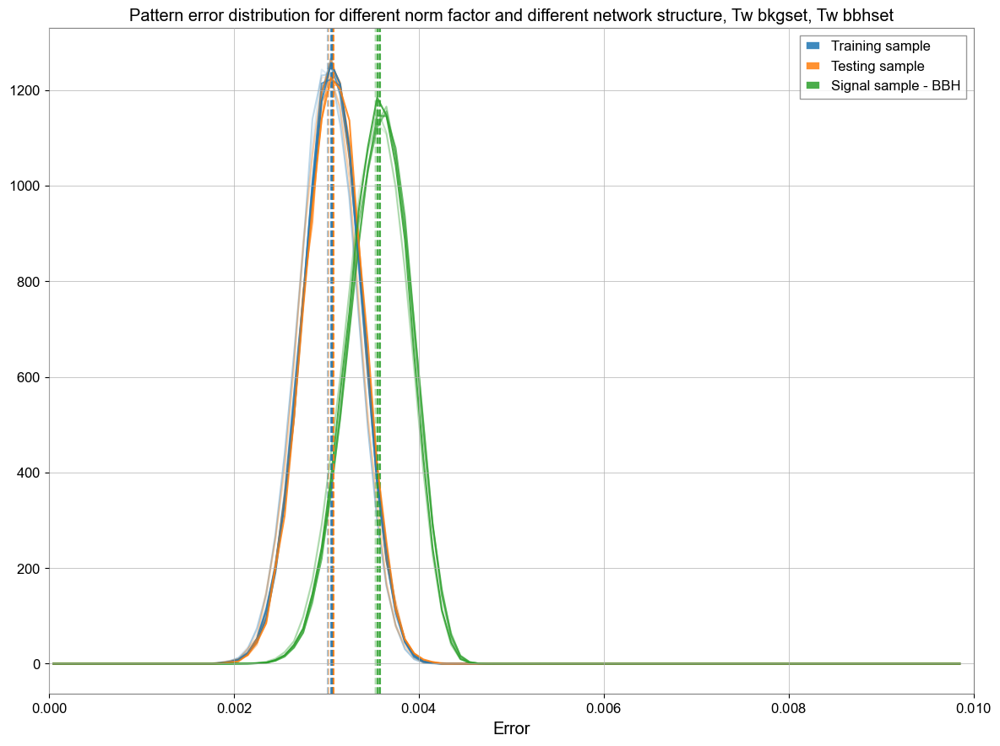

In [371]:
model_list = ['model_200-40-200_0_twdataset_normalized.pt','model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

plt.figure(figsize=(12, 9))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)
alpha_set = np.arange(1/7,1.01, 1/7)

legend_lines = []

for i in range(6):
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == 0:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    

    counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_200d, bins = bin_scheme, density = True)
    counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_200d, bins = bin_scheme, density = True)
    counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_200d, bins = bin_scheme, density = True)
    counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_200d, bins = bin_scheme, density = True)
    # counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
    # counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

    bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
    bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
    bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
    bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
    # bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
    # bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


    # plt.figure(figsize=(12, 9))
    line1,  = plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample', alpha = alpha_set[i])
    line2,  =plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample', alpha = alpha_set[i])
    line3,  =plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH', alpha = alpha_set[i])
    # plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    # plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


    plt.axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE', alpha = alpha_set[i])
    plt.axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE', alpha = alpha_set[i])
    plt.axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH', alpha = alpha_set[i])
    # plt.axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    # plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
# plt.title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
# plt.legend(loc='upper right')

legend_lines = []

# 将特定的线条添加到图例列表中
legend_lines.append(line1)
legend_lines.append(line2)
legend_lines.append(line3)

# 创建图例，并只显示特定的线条
plt.legend(handles=legend_lines)

# 调整子图之间的距离
plt.title('Pattern error distribution for different norm factor and different network structure, Tw bkgset, Tw bbhset')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

ROC analysis procedure
---

### 1-d pattern error ROC analysis

In [264]:
def upperTPRFPRcalc(trainerror, signalerror, FPRlist):
    TPRlist = np.zeros(len(FPRlist))
    length_of_train_sample = len(trainerror)
    # print(length_of_train_sample)
    length_of_signal_value = len(signalerror)
    # print(length_of_signal_value)
    
    for i in range(len(FPRlist)):
        index_number = int(length_of_train_sample * FPRlist[i])
        threshold = np.sort(trainerror)[-index_number]
            
        # print(threshold)
        # print(np.argwhere(signalerror > threshold).shape)
        TPRlist[i] = np.argwhere(signalerror > threshold).shape[0] / length_of_signal_value
    
    TPRlist[-1] = 1
    
    return TPRlist

def lowerTPRFPRcalc(trainerror, signalerror, FPRlist):
    TPRlist = np.zeros(len(FPRlist))
    length_of_train_sample = len(trainerror)
    # print(length_of_train_sample)
    length_of_signal_value = len(signalerror)
    # print(length_of_signal_value)
    
    for i in range(len(FPRlist)):
        index_number = int(length_of_train_sample * FPRlist[i])
        if index_number == 0:
            threshold = np.sort(trainerror)[index_number]
        else:
            threshold = np.sort(trainerror)[index_number-1]
        # print(np.sort(trainerror))
        # print(threshold)
        # print(np.argwhere(signalerror < threshold).shape)
        TPRlist[i] = np.argwhere(signalerror < threshold).shape[0] / length_of_signal_value
    
    TPRlist[-1] = 1
    
    return TPRlist

In [265]:
FPR_list = np.logspace(-3,0,30)

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_5104\1236658604.py:115: DeprecationWarning: 'scipy.integrate.trapz' is deprecated in favour of 'scipy.integrate.trapezoid' and will be removed in SciPy 1.14.0
  AUC_list_BBH.append(integrate.trapz(TPR_list_BBH, FPR_list))


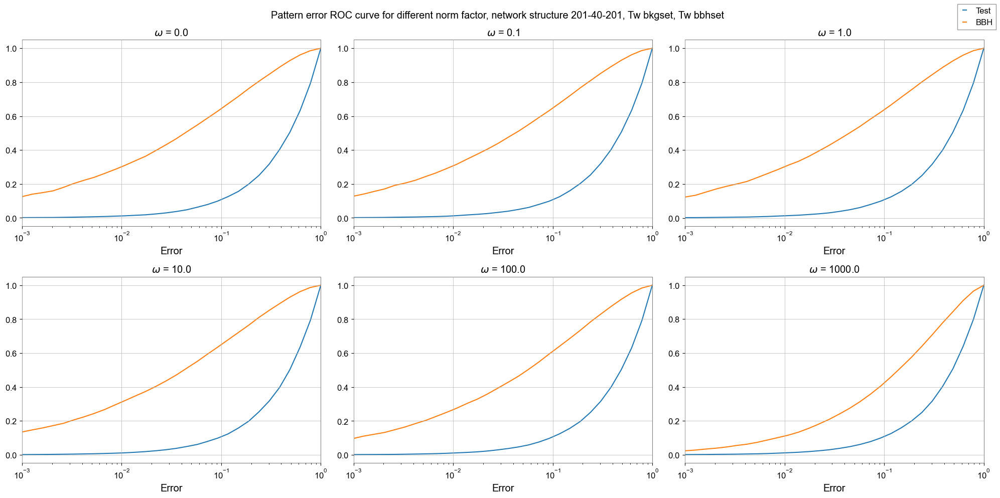

In [482]:
AUC_list_BBH = []

model_list = ['model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

legend_lines = []

for i in range(6):
    TPR_test_list = []
    TPR_BBH_list = []
    TPR_SG_list = []
    
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == -1:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    
    TPR_list_test = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_test_output_200d.flatten(), FPR_list)
    TPR_list_BBH = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_injected_output_200d.flatten(), FPR_list)
    TPR_list_SG = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_sinegaussian_output_200d.flatten(), FPR_list)
    

    # hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_200d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])
    # hist_bunch_noise = hist

    # for FPR in FPR_list:
    #     mask = FPR_mask(hist_bunch_noise, FPR)

    #     hist_test, _, _ = np.histogram2d(ReconstructedError_test_output_200d,ReconstructedError_test_output_1d, bins=[bins_x, bins_y])
    #     hist_BBH, _, _ = np.histogram2d(ReconstructedError_injected_output_200d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])
    #     hist_SG, _, _ = np.histogram2d(ReconstructedError_sinegaussian_output_200d,ReconstructedError_sinegaussian_output_1d, bins=[bins_x, bins_y])
    #     # hist_Glitches, _, _ = np.histogram2d(ReconstructedError_glitches_fake_output_100d,ReconstructedError_glitches_fake_output_1d, bins=[bins_x, bins_y])
    #     # hist_Glitches_real, _, _ = np.histogram2d(ReconstructedError_glitches_real_output_100d,ReconstructedError_glitches_real_output_1d, bins=[bins_x, bins_y])

    #     _, TPR_test = Mask_and_TPR_computing(hist_test, mask)
    #     _, TPR_BBH = Mask_and_TPR_computing(hist_BBH, mask)
    #     _, TPR_SG = Mask_and_TPR_computing(hist_SG, mask)
    #     # _, TPR_Glitches = Mask_and_TPR_computing(hist_Glitches, mask)
    #     # _, TPR_Glitches_real = Mask_and_TPR_computing(hist_Glitches_real, mask)

    #     TPR_test_list.append(TPR_test)
    #     TPR_BBH_list.append(TPR_BBH)
    #     TPR_SG_list.append(TPR_SG)
        # TPR_Glitches_list.append(TPR_Glitches)
        # TPR_Glitches_real_list.append(TPR_Glitches_real)

    AUC_list_BBH.append(integrate.trapz(TPR_list_BBH, FPR_list))

    # plt.figure(figsize=(12, 9))
    # axes[i//3, i % 3].plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    # axes[i//3, i % 3].plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    # axes[i//3, i % 3].plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    # axes[i//3, i % 3].plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    # # plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


    # axes[i//3, i % 3].axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    # axes[i//3, i % 3].axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    # axes[i//3, i % 3].axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    # axes[i//3, i % 3].axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    # plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')
    
    axes[i//3, i % 3].plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
    axes[i//3, i % 3].plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')
    # axes[i//3, i % 3].plot(FPR_list, TPR_SG_list, color = colors[2], label = 'SG')
    # axes[i//3, i % 3].plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
    # axes[i//3, i % 3].plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

    axes[i//3, i % 3].set_xlim(1e-3, 1e0)
    axes[i//3, i % 3].set_xscale('log')
    axes[i//3, i % 3].set_yscale('linear')
    # plt.legend()
    # plt.title('ROC curve for 101-20-101 DNN AE, bunch, pattern error, norm factor = 0.1, upper side')


    # axes[i//3, i % 3].set_xlim(0, 0.01)
    axes[i//3, i % 3].set_xlabel('Error')
    axes[i//3, i % 3].set_title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
plt.suptitle('Pattern error ROC curve for different norm factor, network structure 201-40-201, Tw bkgset, Tw bbhset')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

In [131]:
plt.plot(np.insert(omega_list,0,0), AUC_list_BBH)
plt.xlim(1e-2, 1000)
plt.ylim(0.5, 1)
plt.xscale('log')
plt.xlabel('Norm factor $\omega$')
plt.ylabel('AUC')

plt.title('AUC curve for pattern error anomaly detection using different norm factor')

NameError: name 'AUC_list_BBH' is not defined

Text(0.5, 1.0, 'AUC curve for pattern error anomaly detection using different norm factor')

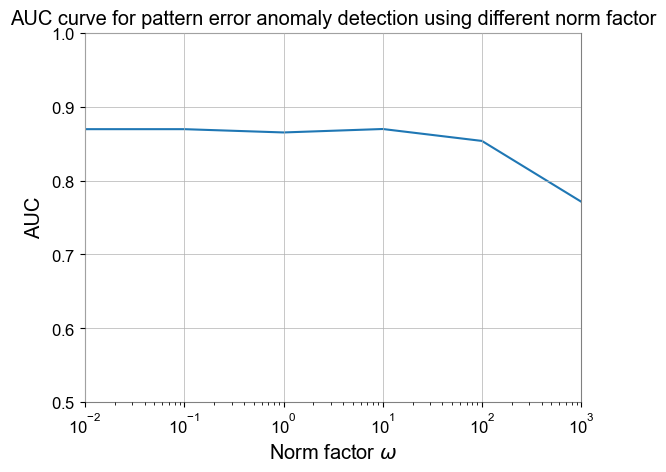

In [483]:
plt.plot(np.insert(omega_list,0,0), AUC_list_BBH)
plt.xlim(1e-2, 1000)
plt.ylim(0.5, 1)
plt.xscale('log')
plt.xlabel('Norm factor $\omega$')
plt.ylabel('AUC')

plt.title('AUC curve for pattern error anomaly detection using different norm factor')

In [342]:
model = torch.load('../Model_cached/model_200-40-200_0_twdataset_normalized.pt')

trainData = trainData_ini[:,:200]
testData = testData_ini[:,:200]
bbhData = bbhData_ini[:,:200]

_, decodedTestdata = model(trainData)
decodedTestdata = decodedTestdata.double()
reconstructedData_train = decodedTestdata.detach().numpy()
ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
MSE_train = ReconstructedError_train.mean()

X_train_output = X_train[:, :200]
reconstructedData_train_output = reconstructedData_train[:, :200]

ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
MSE_train_output_1d = ReconstructedError_train_output_1d.mean()

_, decodedTestdata = model(testData)
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()
ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
MSE_test = ReconstructedError_test.mean()

X_test_output = X_test[:, :200]
reconstructedData_test_output = reconstructedData_test[:, :200]

ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
MSE_test_output_1d = ReconstructedError_train_output_1d.mean()

_, decodedTestdata = model(bbhData)
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()
ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
MSE_injected = ReconstructedError_injected.mean()

ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()

_, decodedTestdata = autoencoder(sgData)
decodedTestdata = decodedTestdata.double()
reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()

In [339]:
model = torch.load('../Model_cached/model_201-40-201_10.0_twdataset.pt')

trainData = trainData_ini
testData = testData_ini
bbhData = bbhData_ini

_, decodedTestdata = model(trainData)
decodedTestdata = decodedTestdata.double()
reconstructedData_train = decodedTestdata.detach().numpy()
ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
MSE_train = ReconstructedError_train.mean()

X_train_output = X_train[:, :200]
reconstructedData_train_output = reconstructedData_train[:, :200]

ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
MSE_train_output_1d = ReconstructedError_train_output_1d.mean()

_, decodedTestdata = model(testData)
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()
ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
MSE_test = ReconstructedError_test.mean()

X_test_output = X_test[:, :200]
reconstructedData_test_output = reconstructedData_test[:, :200]

ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
MSE_test_output_1d = ReconstructedError_train_output_1d.mean()

_, decodedTestdata = model(bbhData)
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()
ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
MSE_injected = ReconstructedError_injected.mean()

ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()

_, decodedTestdata = autoencoder(sgData)
decodedTestdata = decodedTestdata.double()
reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()

In [266]:
TPR_list_test = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_test_output_200d.flatten(), FPR_list)
TPR_list_BBH = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_injected_output_200d.flatten(), FPR_list)
TPR_list_SG = lowerTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_sinegaussian_output_200d.flatten(), FPR_list)
TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_glitch_output_200d.flatten(), FPR_list)
# TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_fake_output_100d.flatten(), FPR_list)

In [ ]:
TPR_list_test = lowerTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_test_output_200d.flatten(), FPR_list)
TPR_list_BBH = lowerTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_injected_output_200d.flatten(), FPR_list)
TPR_list_SG = lowerTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_sinegaussian_output_200d.flatten(), FPR_list)
# TPR_list_real_glitches = lowerTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_real_output_100d.flatten(), FPR_list)
# TPR_list_fake_glitches = lowerTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_fake_output_100d.flatten(), FPR_list)

In [ ]:
TPR_list_test = upperTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_test_output_1d.flatten(), FPR_list)
TPR_list_BBH = upperTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_injected_output_1d.flatten(), FPR_list)
TPR_list_SG = upperTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_sinegaussian_output_1d.flatten(), FPR_list)
# TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_glitches_real_output_1d.flatten(), FPR_list)
# TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_glitches_fake_output_1d.flatten(), FPR_list)

In [ ]:
TPR_list_test = lowerTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_test_output_1d.flatten(), FPR_list)
TPR_list_BBH = lowerTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_injected_output_1d.flatten(), FPR_list)
TPR_list_SG = lowerTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_sinegaussian_output_1d.flatten(), FPR_list)
# TPR_list_real_glitches = lowerTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_glitches_real_output_1d.flatten(), FPR_list)
# TPR_list_fake_glitches = lowerTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_glitches_fake_output_1d.flatten(), FPR_list)

In [270]:
from sklearn.metrics import auc

Text(0.5, 1.0, 'Pattern ROC curve, network structure 201-40-201, GWAK set+Jiarui noise')

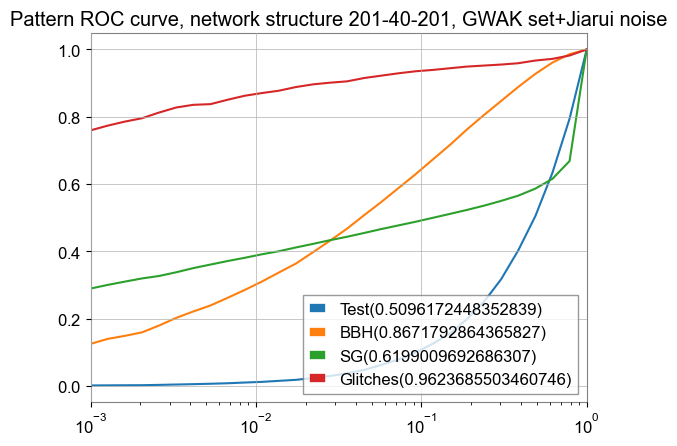

In [271]:
plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test(' + str(auc(FPR_list, TPR_list_test)) + ")")
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH(' + str(auc(FPR_list, TPR_list_BBH)) + ")")
plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG(' + str(auc(FPR_list, TPR_list_SG)) + ")")
plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'Glitches(' + str(auc(FPR_list, TPR_list_real_glitches)) + ")")
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
# plt.title('Pattern ROC curve, network structure 201-40-201, GWAK set+Jiarui noise')
plt.title('ROC curve for time series')

Text(0.5, 1.0, 'Pattern ROC curve, network structure 201-40-201, norm factor = 10, Tw bkgset, Tw bbhset, Tw SGset')

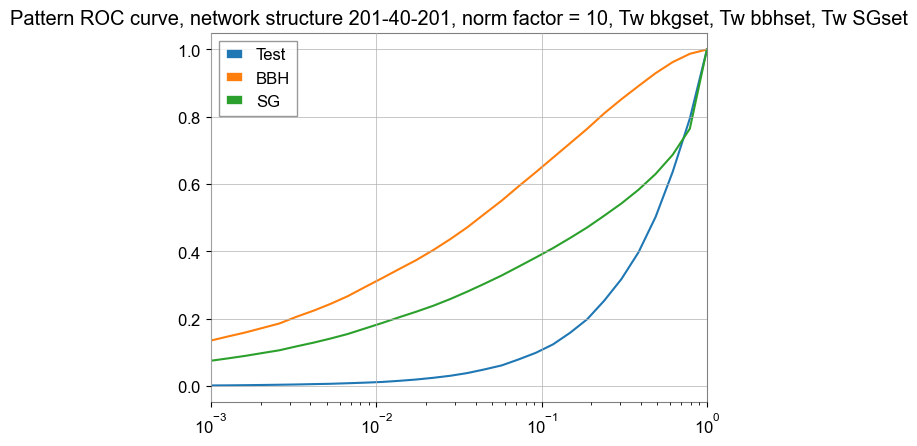

In [341]:
plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')
plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG')
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('Pattern ROC curve, network structure 201-40-201, norm factor = 0, Tw bkgset, Tw bbhset, Tw SGset')

### 2-d pattern error-norm error ROC analysis

In [24]:
def FPR_mask(hist, FPR):
    hist_sorted = np.sort(hist, axis=None)

    total_hist_sum = hist_sorted.sum()
    threshold = int(FPR * total_hist_sum)

    sum = hist_sorted[0]
    i = 0
    while(sum < threshold):
        i += 1
        sum += hist_sorted[i]
    
    mask = np.argwhere(hist > hist_sorted[i])

    mask_Boolen = np.zeros((hist.shape[0], hist.shape[1]), dtype=bool)
    mask_Boolen[mask[:, 0], mask[:, 1]] = True

    return mask_Boolen

def Mask_and_TPR_computing(hist, mask):

    hist_masked = hist.copy()
    hist_masked[mask] = 0
    denominator = hist.sum()
    numerator = hist_masked.sum()

    print(numerator, denominator)

    return hist_masked, numerator/denominator

In [25]:
bins_x = np.arange(0, 0.02, 1e-4)
bins_y = np.logspace(-9, 0, num = 200)

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_23000\174479522.py:5: RuntimeWarning: divide by zero encountered in log
  hist= np.log(hist)


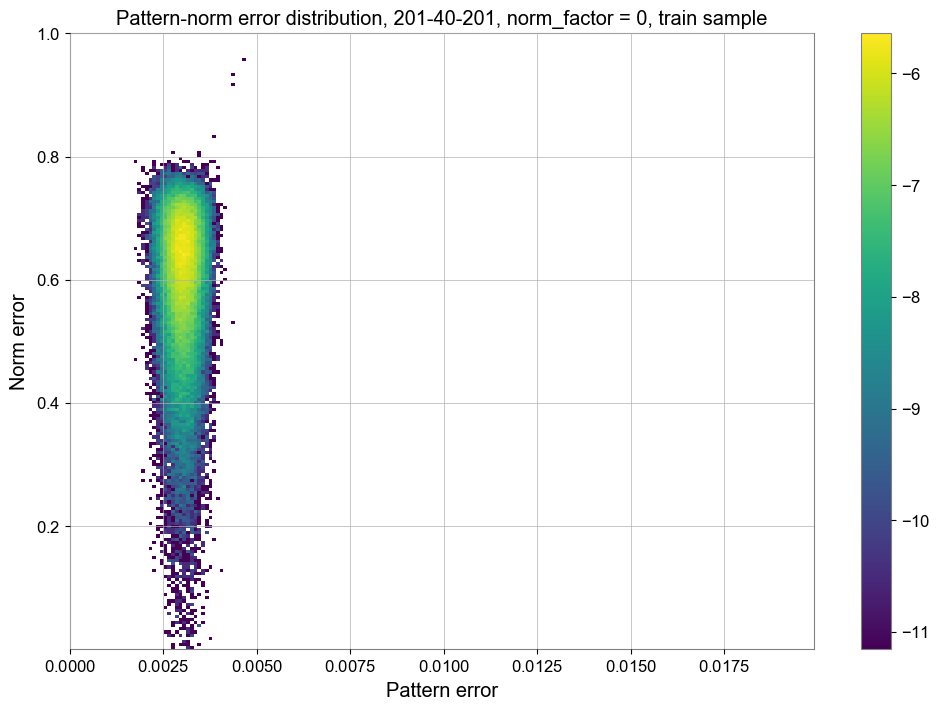

In [43]:
hist_bunch_noise, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_200d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])


hist = hist_bunch_noise / hist_bunch_noise.sum()
hist= np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])

plt.figure(figsize=(12, 8)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 201-40-201, norm_factor = 0, train sample')
plt.xlabel('Pattern error')
plt.ylabel("Norm error")
# plt.yticks(np.arange(0,1,1/10), np.arange(0, 200, 20))
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, bins_x[-1])


# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_5104\3446307433.py:5: RuntimeWarning: divide by zero encountered in log
  hist= np.log(hist)


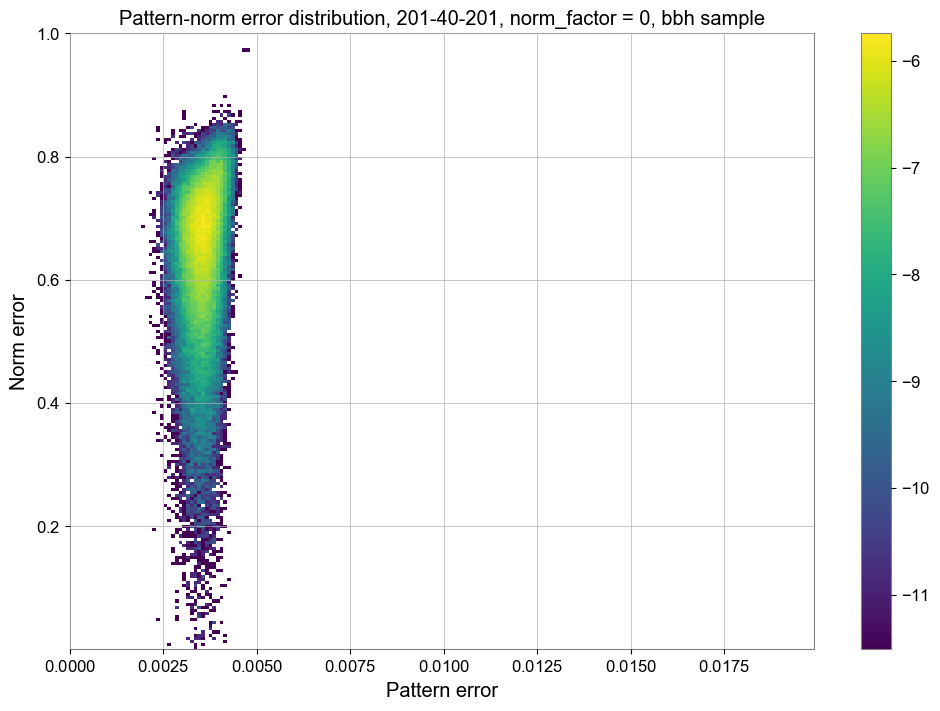

In [389]:
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_200d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])


hist = hist / hist.sum()
hist= np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])

plt.figure(figsize=(12, 8)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 201-40-201, norm_factor = 0, bbh sample')
plt.xlabel('Pattern error')
plt.ylabel("Norm error")
# plt.yticks(np.arange(0,1,1/10), np.arange(0, 200, 20))
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, bins_x[-1])


# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_23000\927303071.py:5: RuntimeWarning: divide by zero encountered in log
  hist= np.log(hist)


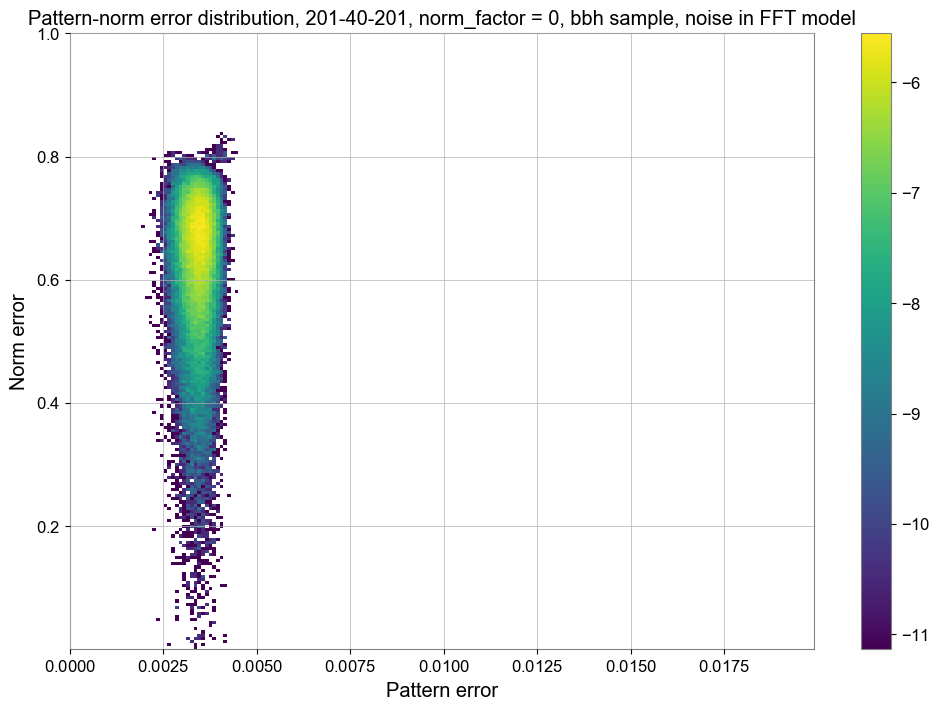

In [53]:
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_200d[indices],ReconstructedError_injected_output_1d[indices], bins=[bins_x, bins_y])


hist = hist / hist.sum()
hist= np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])

plt.figure(figsize=(12, 8)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 201-40-201, norm_factor = 0, bbh sample, noise in FFT model')
plt.xlabel('Pattern error')
plt.ylabel("Norm error")
# plt.yticks(np.arange(0,1,1/10), np.arange(0, 200, 20))
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, bins_x[-1])


# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_23000\3587665994.py:5: RuntimeWarning: divide by zero encountered in log
  hist= np.log(hist)


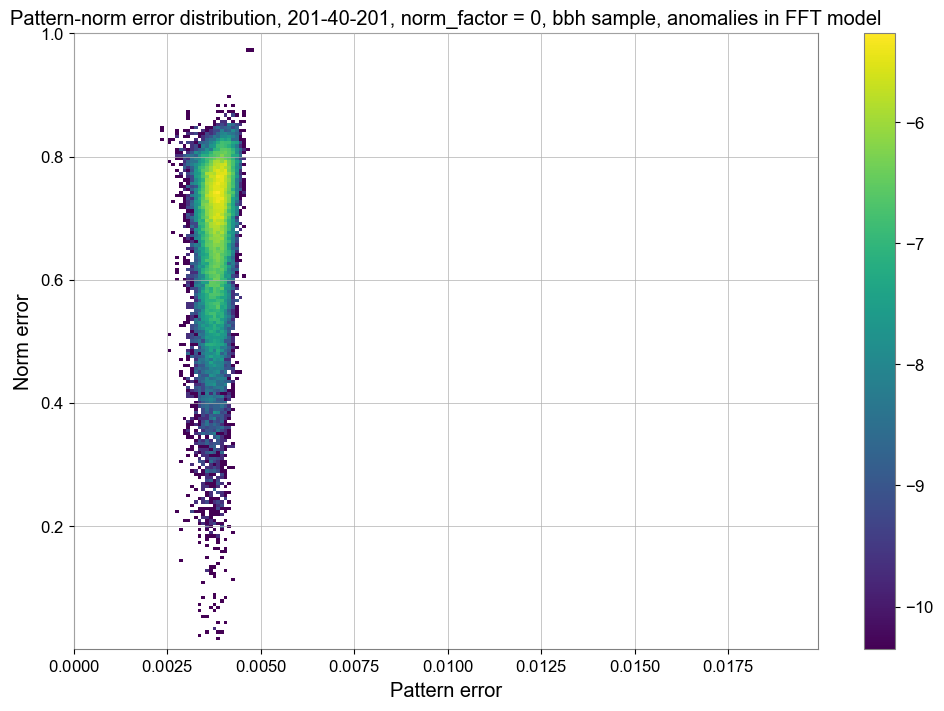

In [55]:
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_200d[id_anomaly],ReconstructedError_injected_output_1d[id_anomaly], bins=[bins_x, bins_y])


hist = hist / hist.sum()
hist= np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])

plt.figure(figsize=(12, 8)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 201-40-201, norm_factor = 0, bbh sample, anomalies in FFT model')
plt.xlabel('Pattern error')
plt.ylabel("Norm error")
# plt.yticks(np.arange(0,1,1/10), np.arange(0, 200, 20))
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, bins_x[-1])


# 显示图形
plt.show()

In [39]:
# mask for the data sample
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_200d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])
hist_bunch_noise = hist
mask = FPR_mask(hist_bunch_noise, 0)

In [33]:
id_anomaly = np.setdiff1d(np.arange(0,1e5), indices).astype(int)

In [36]:
id_anomaly.shape

(31380,)

11578.0 31362.0
0.36917288438237356


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_23000\3359999521.py:4: RuntimeWarning: divide by zero encountered in log
  hist= np.log(hist)


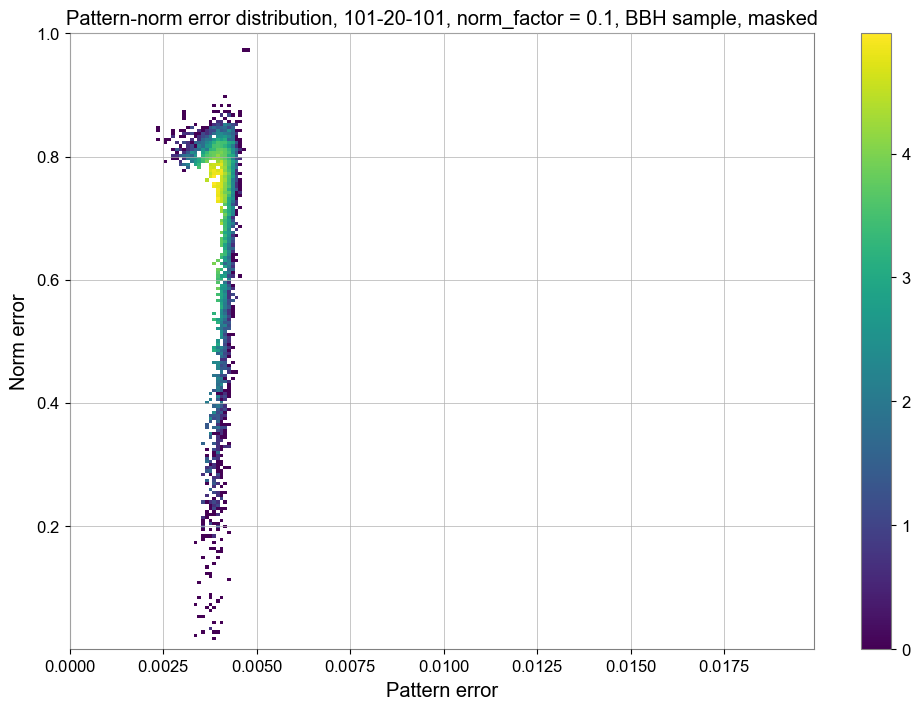

In [56]:
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_200d[id_anomaly],ReconstructedError_injected_output_1d[id_anomaly], bins=[bins_x, bins_y])
hist, TPR_BBH = Mask_and_TPR_computing(hist, mask)

hist= np.log(hist)

print(TPR_BBH)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(12, 8)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0.1, BBH sample, masked')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
# plt.ylabel("y = $200 \\times log_{10^9}(10^9 \\times \\text{Norm error})$")
# plt.yticks(np.arange(0,1,1/10), np.arange(0, 200, 20))
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, bins_x[-1])

# 显示图形
plt.show()

In [47]:
mask_reversed = np.argwhere(hist_bunch_noise == 0)

In [48]:
mask_reversed

array([[  0,   0],
       [  0,   1],
       [  0,   2],
       ...,
       [198, 196],
       [198, 197],
       [198, 198]], dtype=int64)

In [49]:
id_outliner = np.zeros(0, dtype=int)

x = ReconstructedError_injected_output_200d
y = ReconstructedError_injected_output_1d

for i in range(len(mask_reversed)):
    id_outliner_cache = np.argwhere((x >= x_edges[mask_reversed[i][0]]) & (x <= x_edges[mask_reversed[i][0] + 1]) &
                      (y >= y_edges[mask_reversed[i][1]]) & (y <= y_edges[mask_reversed[i][1] + 1]))

    id_outliner = np.append(id_outliner, id_outliner_cache[:, 0])

# 打印事件ID
print(id_outliner)

[90580   856 83867 ... 55349 99789 99787]


In [57]:
id_outliner.shape

(13999,)

In [51]:
np.save('../Data_cached/id_for_outliner_for_BBH_in_timeseries_study.npy', id_outliner)

In [397]:
- 0.1 * len(ReconstructedError_train_output_200d)

-7000.0

In [398]:
threshold = np.sort(ReconstructedError_train_output_200d)[-7000]

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_5104\3389179263.py:5: RuntimeWarning: divide by zero encountered in log
  hist= np.log(hist)


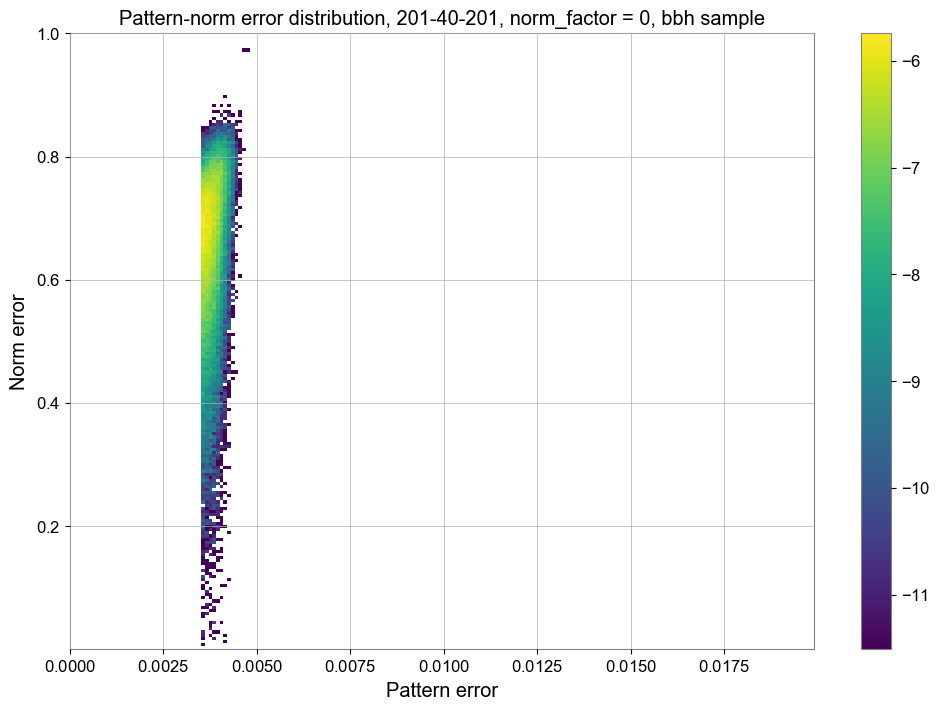

In [400]:
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_200d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])


hist = hist / hist.sum()
hist= np.log(hist)

selected_hist = np.where(x_edges[:-1] > threshold, hist.T, np.nan)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])

plt.figure(figsize=(12, 8)) 
plt.imshow(selected_hist, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 201-40-201, norm_factor = 0, bbh sample')
plt.xlabel('Pattern error')
plt.ylabel("Norm error")
# plt.yticks(np.arange(0,1,1/10), np.arange(0, 200, 20))
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, bins_x[-1])


# 显示图形
plt.show()

In [276]:
TPR_test_list = []
TPR_BBH_list = []
TPR_SG_list = []
TPR_Glitches_list = []

In [277]:
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_200d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])
hist_bunch_noise = hist

for FPR in FPR_list:
    mask = FPR_mask(hist_bunch_noise, FPR)

    hist_test, _, _ = np.histogram2d(ReconstructedError_test_output_200d,ReconstructedError_test_output_1d, bins=[bins_x, bins_y])
    hist_BBH, _, _ = np.histogram2d(ReconstructedError_injected_output_200d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])
    hist_SG, _, _ = np.histogram2d(ReconstructedError_sinegaussian_output_200d,ReconstructedError_sinegaussian_output_1d, bins=[bins_x, bins_y])
    hist_Glitches, _, _ = np.histogram2d(ReconstructedError_glitch_output_200d,ReconstructedError_glitch_output_1d, bins=[bins_x, bins_y])
    # hist_Glitches_real, _, _ = np.histogram2d(ReconstructedError_glitches_real_output_100d,ReconstructedError_glitches_real_output_1d, bins=[bins_x, bins_y])

    _, TPR_test = Mask_and_TPR_computing(hist_test, mask)
    _, TPR_BBH = Mask_and_TPR_computing(hist_BBH, mask)
    _, TPR_SG = Mask_and_TPR_computing(hist_SG, mask)
    _, TPR_Glitches = Mask_and_TPR_computing(hist_Glitches, mask)
    # _, TPR_Glitches_real = Mask_and_TPR_computing(hist_Glitches_real, mask)

    TPR_test_list.append(TPR_test)
    TPR_BBH_list.append(TPR_BBH)
    TPR_SG_list.append(TPR_SG)
    TPR_Glitches_list.append(TPR_Glitches)
    # TPR_Glitches_real_list.append(TPR_Glitches_real)

249.0 19980.0
19938.0 99936.0
45036.0 99943.0
846.0 922.0
249.0 19980.0
19938.0 99936.0
45036.0 99943.0
846.0 922.0
249.0 19980.0
19938.0 99936.0
45036.0 99943.0
846.0 922.0
249.0 19980.0
19938.0 99936.0
45036.0 99943.0
846.0 922.0
249.0 19980.0
19938.0 99936.0
45036.0 99943.0
846.0 922.0
249.0 19980.0
19938.0 99936.0
45036.0 99943.0
846.0 922.0
249.0 19980.0
19938.0 99936.0
45036.0 99943.0
846.0 922.0
249.0 19980.0
19938.0 99936.0
45036.0 99943.0
846.0 922.0
377.0 19980.0
22941.0 99936.0
48599.0 99943.0
861.0 922.0
377.0 19980.0
22941.0 99936.0
48599.0 99943.0
861.0 922.0
377.0 19980.0
22941.0 99936.0
48599.0 99943.0
861.0 922.0
509.0 19980.0
25103.0 99936.0
50843.0 99943.0
867.0 922.0
509.0 19980.0
25103.0 99936.0
50843.0 99943.0
867.0 922.0
593.0 19980.0
27440.0 99936.0
52363.0 99943.0
868.0 922.0
700.0 19980.0
29273.0 99936.0
53717.0 99943.0
873.0 922.0
801.0 19980.0
30927.0 99936.0
54717.0 99943.0
880.0 922.0
1050.0 19980.0
34374.0 99936.0
57455.0 99943.0
888.0 922.0
1268.0 19980.

Text(0.5, 1.0, '2D ROC curve for time series')

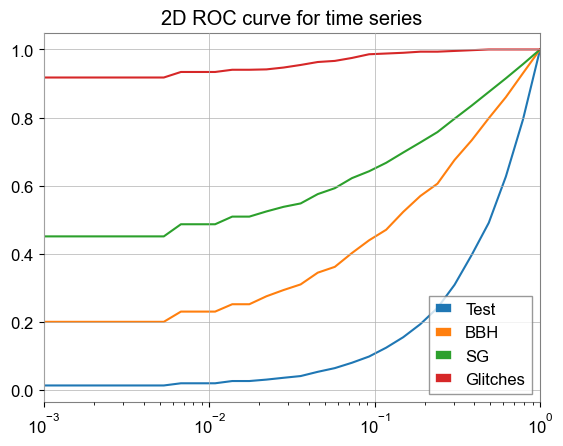

In [279]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd','#8c564b']

plt.plot(FPR_list, TPR_test_list, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_BBH_list, color = colors[1], label = 'BBH')
plt.plot(FPR_list, TPR_SG_list, color = colors[2], label = 'SG')
plt.plot(FPR_list, TPR_Glitches_list, color = colors[3], label = 'Glitches')
# plt.plot(FPR_list, TPR_100_Glitches_real_list, color = colors[4], label = 'Real Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
# plt.title('ROC curve for 101-20-101 DNN AE, pattern error-norm error, norm factor = 0, GWAK noise, rFFTed, absed, upper side')
plt.title('2D ROC curve for time series')

249.0 19980.0
19938.0 99936.0
44618.0 99949.0
249.0 19980.0
19938.0 99936.0
44618.0 99949.0
249.0 19980.0
19938.0 99936.0
44618.0 99949.0
249.0 19980.0
19938.0 99936.0
44618.0 99949.0
249.0 19980.0
19938.0 99936.0
44618.0 99949.0
249.0 19980.0
19938.0 99936.0
44618.0 99949.0
249.0 19980.0
19938.0 99936.0
44618.0 99949.0
249.0 19980.0
19938.0 99936.0
44618.0 99949.0
377.0 19980.0
22941.0 99936.0
48148.0 99949.0
377.0 19980.0
22941.0 99936.0
48148.0 99949.0
377.0 19980.0
22941.0 99936.0
48148.0 99949.0
509.0 19980.0
25103.0 99936.0
50224.0 99949.0
509.0 19980.0
25103.0 99936.0
50224.0 99949.0
593.0 19980.0
27440.0 99936.0
51600.0 99949.0
700.0 19980.0
29273.0 99936.0
52993.0 99949.0
801.0 19980.0
30927.0 99936.0
53940.0 99949.0
1050.0 19980.0
34374.0 99936.0
56609.0 99949.0
1268.0 19980.0
36086.0 99936.0
58348.0 99949.0
1583.0 19980.0
40146.0 99936.0
61269.0 99949.0
1948.0 19980.0
43879.0 99936.0
63219.0 99949.0
2467.0 19980.0
46978.0 99936.0
65732.0 99949.0
3084.0 19980.0
52237.0 99936.

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_5104\1348662621.py:111: DeprecationWarning: 'scipy.integrate.trapz' is deprecated in favour of 'scipy.integrate.trapezoid' and will be removed in SciPy 1.14.0
  AUC_list_BBH.append(integrate.trapz(TPR_BBH_list, FPR_list))


171.0 19512.0
19041.0 98030.0
44759.0 98806.0
171.0 19512.0
19041.0 98030.0
44759.0 98806.0
171.0 19512.0
19041.0 98030.0
44759.0 98806.0
171.0 19512.0
19041.0 98030.0
44759.0 98806.0
171.0 19512.0
19041.0 98030.0
44759.0 98806.0
171.0 19512.0
19041.0 98030.0
44759.0 98806.0
254.0 19512.0
22588.0 98030.0
48819.0 98806.0
254.0 19512.0
22588.0 98030.0
48819.0 98806.0
254.0 19512.0
22588.0 98030.0
48819.0 98806.0
254.0 19512.0
22588.0 98030.0
48819.0 98806.0
351.0 19512.0
25565.0 98030.0
51251.0 98806.0
448.0 19512.0
28039.0 98030.0
53414.0 98806.0
448.0 19512.0
28039.0 98030.0
53414.0 98806.0
561.0 19512.0
30298.0 98030.0
55083.0 98806.0
682.0 19512.0
32629.0 98030.0
56724.0 98806.0
887.0 19512.0
36152.0 98030.0
59090.0 98806.0
1078.0 19512.0
38837.0 98030.0
60978.0 98806.0
1330.0 19512.0
41109.0 98030.0
62499.0 98806.0
1668.0 19512.0
44262.0 98030.0
64632.0 98806.0
2051.0 19512.0
47678.0 98030.0
66750.0 98806.0
2550.0 19512.0
49934.0 98030.0
68754.0 98806.0
3060.0 19512.0
53087.0 98030.

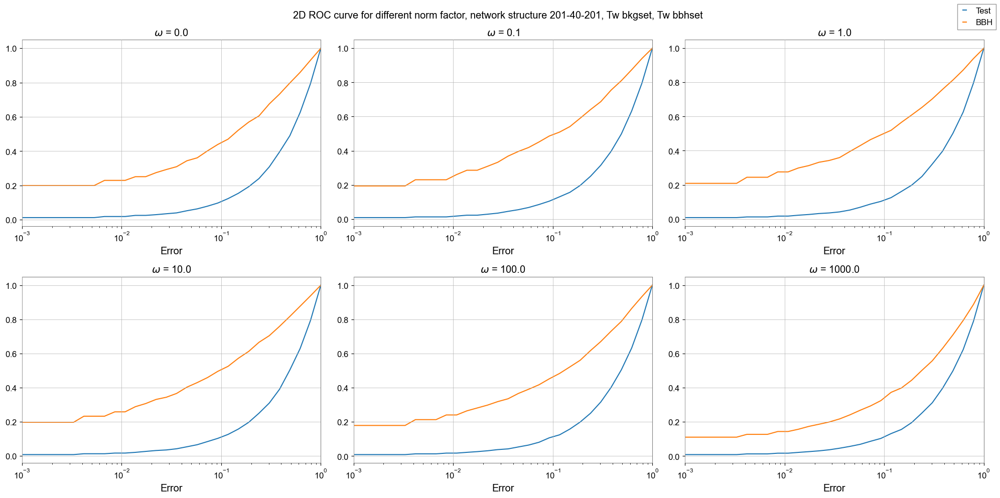

In [486]:
AUC_list_BBH = []

model_list = ['model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

legend_lines = []

for i in range(6):
    TPR_test_list = []
    TPR_BBH_list = []
    TPR_SG_list = []
    
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == -1:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    

    hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_200d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])
    hist_bunch_noise = hist

    for FPR in FPR_list:
        mask = FPR_mask(hist_bunch_noise, FPR)

        hist_test, _, _ = np.histogram2d(ReconstructedError_test_output_200d,ReconstructedError_test_output_1d, bins=[bins_x, bins_y])
        hist_BBH, _, _ = np.histogram2d(ReconstructedError_injected_output_200d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])
        hist_SG, _, _ = np.histogram2d(ReconstructedError_sinegaussian_output_200d,ReconstructedError_sinegaussian_output_1d, bins=[bins_x, bins_y])
        # hist_Glitches, _, _ = np.histogram2d(ReconstructedError_glitches_fake_output_100d,ReconstructedError_glitches_fake_output_1d, bins=[bins_x, bins_y])
        # hist_Glitches_real, _, _ = np.histogram2d(ReconstructedError_glitches_real_output_100d,ReconstructedError_glitches_real_output_1d, bins=[bins_x, bins_y])

        _, TPR_test = Mask_and_TPR_computing(hist_test, mask)
        _, TPR_BBH = Mask_and_TPR_computing(hist_BBH, mask)
        _, TPR_SG = Mask_and_TPR_computing(hist_SG, mask)
        # _, TPR_Glitches = Mask_and_TPR_computing(hist_Glitches, mask)
        # _, TPR_Glitches_real = Mask_and_TPR_computing(hist_Glitches_real, mask)

        TPR_test_list.append(TPR_test)
        TPR_BBH_list.append(TPR_BBH)
        TPR_SG_list.append(TPR_SG)
        # TPR_Glitches_list.append(TPR_Glitches)
        # TPR_Glitches_real_list.append(TPR_Glitches_real)

    AUC_list_BBH.append(integrate.trapz(TPR_BBH_list, FPR_list))

    # plt.figure(figsize=(12, 9))
    # axes[i//3, i % 3].plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    # axes[i//3, i % 3].plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    # axes[i//3, i % 3].plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    # axes[i//3, i % 3].plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    # # plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


    # axes[i//3, i % 3].axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    # axes[i//3, i % 3].axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    # axes[i//3, i % 3].axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    # axes[i//3, i % 3].axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    # plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')
    
    axes[i//3, i % 3].plot(FPR_list, TPR_test_list, color = colors[0], label = 'Test')
    axes[i//3, i % 3].plot(FPR_list, TPR_BBH_list, color = colors[1], label = 'BBH')
    # axes[i//3, i % 3].plot(FPR_list, TPR_SG_list, color = colors[2], label = 'SG')
    # axes[i//3, i % 3].plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
    # axes[i//3, i % 3].plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

    axes[i//3, i % 3].set_xlim(1e-3, 1e0)
    axes[i//3, i % 3].set_xscale('log')
    axes[i//3, i % 3].set_yscale('linear')
    # plt.legend()
    # plt.title('ROC curve for 101-20-101 DNN AE, bunch, pattern error, norm factor = 0.1, upper side')


    # axes[i//3, i % 3].set_xlim(0, 0.01)
    axes[i//3, i % 3].set_xlabel('Error')
    axes[i//3, i % 3].set_title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
plt.suptitle('2D ROC curve for different norm factor, network structure 201-40-201, Tw bkgset, Tw bbhset')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

Text(0.5, 1.0, 'AUC curve for 2d anomaly detection using different norm factor')

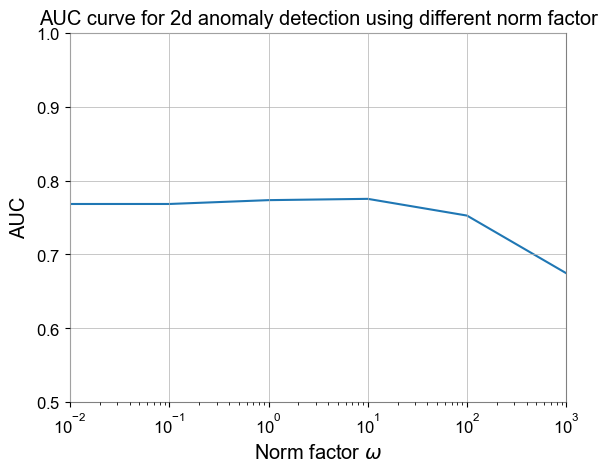

In [441]:
plt.plot(np.insert(omega_list,0,0), AUC_list_BBH)
plt.xlim(1e-2, 1000)
plt.ylim(0.5, 1)
plt.xscale('log')
plt.xlabel('Norm factor $\omega$')
plt.ylabel('AUC')

plt.title('AUC curve for 2d anomaly detection using different norm factor')

249.0 19980.0
19938.0 99936.0
33186.0 98121.0
249.0 19980.0
19938.0 99936.0
33186.0 98121.0
249.0 19980.0
19938.0 99936.0
33186.0 98121.0
249.0 19980.0
19938.0 99936.0
33186.0 98121.0
249.0 19980.0
19938.0 99936.0
33186.0 98121.0
249.0 19980.0
19938.0 99936.0
33186.0 98121.0
249.0 19980.0
19938.0 99936.0
33186.0 98121.0
249.0 19980.0
19938.0 99936.0
33186.0 98121.0
377.0 19980.0
22941.0 99936.0
40564.0 98121.0
377.0 19980.0
22941.0 99936.0
40564.0 98121.0
377.0 19980.0
22941.0 99936.0
40564.0 98121.0
509.0 19980.0
25103.0 99936.0
45305.0 98121.0
509.0 19980.0
25103.0 99936.0
45305.0 98121.0
593.0 19980.0
27440.0 99936.0
48282.0 98121.0
700.0 19980.0
29273.0 99936.0
52029.0 98121.0
801.0 19980.0
30927.0 99936.0
54667.0 98121.0
1050.0 19980.0
34374.0 99936.0
58916.0 98121.0
1268.0 19980.0
36086.0 99936.0
62159.0 98121.0
1583.0 19980.0
40146.0 99936.0
65867.0 98121.0
1948.0 19980.0
43879.0 99936.0
68882.0 98121.0
2467.0 19980.0
46978.0 99936.0
72230.0 98121.0
3084.0 19980.0
52237.0 99936.

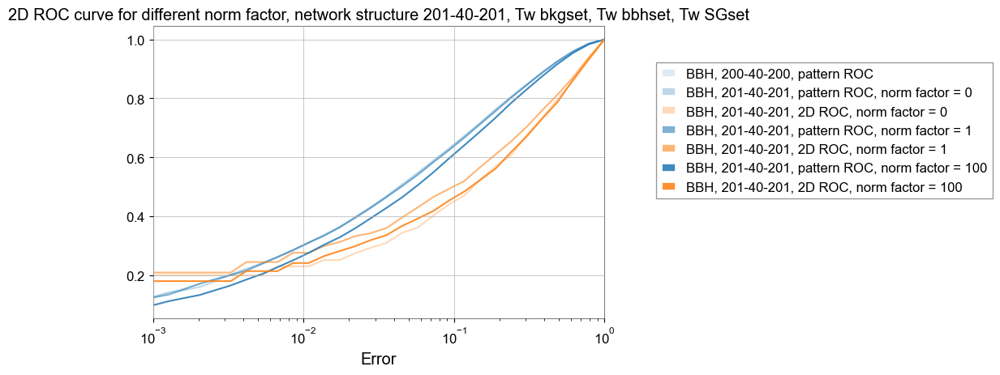

In [359]:
model_list = ['model_200-40-200_0_twdataset_normalized.pt', 'model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

# fig, axes = plt.subplots(2, 3, figsize=(20, 10))
# fig = 

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

legend_lines = []

alpha_set = np.arange(1/7,1.01,1/7)
norm_factor_set = [0,0.1, 1, 10, 100, 1000]

for i in range(7):
    TPR_test_list = []
    TPR_BBH_list = []
    TPR_SG_list = []
    
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == 0:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        # sgData = sgData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        # sgData = sgData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    # _, decodedTestdata = model(sgData)
    # decodedTestdata = decodedTestdata.double()
    # reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    # ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    # MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    # ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    # MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    # ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    # MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    if i == 0:
        
        TPR_list_test = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_test_output_200d.flatten(), FPR_list)
        TPR_list_BBH = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_injected_output_200d.flatten(), FPR_list)
        TPR_list_SG = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_sinegaussian_output_200d.flatten(), FPR_list)
        # TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_real_output_100d.flatten(), FPR_list)
        # TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_fake_output_100d.flatten(), FPR_list)
        
        plt.plot(FPR_list, TPR_list_BBH, color = colors[0], label = 'BBH, 200-40-200, pattern ROC', alpha = alpha_set[i])
    
    elif i in [1,3,5]:
        TPR_list_test = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_test_output_200d.flatten(), FPR_list)
        TPR_list_BBH = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_injected_output_200d.flatten(), FPR_list)
        TPR_list_SG = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_sinegaussian_output_200d.flatten(), FPR_list)
        # TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_real_output_100d.flatten(), FPR_list)
        # TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_fake_output_100d.flatten(), FPR_list)
        
        # plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH, 200-40-200 pattern ROC', alpha = alpha_set[i])
        plt.plot(FPR_list, TPR_list_BBH, color = colors[0], label = 'BBH, 201-40-201, pattern ROC, norm factor = ' + str(norm_factor_set[i - 1]), alpha = alpha_set[i])
        
    

        hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_200d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])
        hist_bunch_noise = hist

        for FPR in FPR_list:
            mask = FPR_mask(hist_bunch_noise, FPR)

            hist_test, _, _ = np.histogram2d(ReconstructedError_test_output_200d,ReconstructedError_test_output_1d, bins=[bins_x, bins_y])
            hist_BBH, _, _ = np.histogram2d(ReconstructedError_injected_output_200d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])
            hist_SG, _, _ = np.histogram2d(ReconstructedError_sinegaussian_output_200d,ReconstructedError_sinegaussian_output_1d, bins=[bins_x, bins_y])
            # hist_Glitches, _, _ = np.histogram2d(ReconstructedError_glitches_fake_output_100d,ReconstructedError_glitches_fake_output_1d, bins=[bins_x, bins_y])
            # hist_Glitches_real, _, _ = np.histogram2d(ReconstructedError_glitches_real_output_100d,ReconstructedError_glitches_real_output_1d, bins=[bins_x, bins_y])

            _, TPR_test = Mask_and_TPR_computing(hist_test, mask)
            _, TPR_BBH = Mask_and_TPR_computing(hist_BBH, mask)
            _, TPR_SG = Mask_and_TPR_computing(hist_SG, mask)
            # _, TPR_Glitches = Mask_and_TPR_computing(hist_Glitches, mask)
            # _, TPR_Glitches_real = Mask_and_TPR_computing(hist_Glitches_real, mask)

            TPR_test_list.append(TPR_test)
            TPR_BBH_list.append(TPR_BBH)
            TPR_SG_list.append(TPR_SG)
            # TPR_Glitches_list.append(TPR_Glitches)
            # TPR_Glitches_real_list.append(TPR_Glitches_real)

        
        # plt.figure(figsize=(12, 9))
        # axes[i//3, i % 3].plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
        # axes[i//3, i % 3].plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
        # axes[i//3, i % 3].plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
        # axes[i//3, i % 3].plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
        # # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
        # # plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


        # axes[i//3, i % 3].axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
        # axes[i//3, i % 3].axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
        # axes[i//3, i % 3].axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
        # axes[i//3, i % 3].axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
        # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
        # plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')
        
        # axes[i//3, i % 3].plot(FPR_list, TPR_test_list, color = colors[0], label = 'Test')
        plt.plot(FPR_list, TPR_BBH_list, color = colors[1], label = 'BBH, 201-40-201, 2D ROC, norm factor = ' + str(norm_factor_set[i - 1]), alpha = alpha_set[i])
        # axes[i//3, i % 3].plot(FPR_list, TPR_SG_list, color = colors[2], label = 'SG')
        # axes[i//3, i % 3].plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
        # axes[i//3, i % 3].plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')


    # plt.legend()
    # plt.title('ROC curve for 101-20-101 DNN AE, bunch, pattern error, norm factor = 0.1, upper side')


    # axes[i//3, i % 3].set_xlim(0, 0.01)

    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

# handles, labels = axes[0,0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')

plt.xlabel('Error')
# plt.title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))

plt.title('2D ROC curve for different norm factor, network structure 201-40-201, Tw bkgset, Tw bbhset, Tw SGset')

plt.tight_layout()
plt.legend(loc = 'upper left', bbox_to_anchor = (1.1,0.9))
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

### 2d glitches pattern-error norm-error scatter plot

In [126]:
np.argwhere(data_glitch_snr>8).shape[0]

1003

In [127]:
np.argwhere(data_glitch_snr>10).shape[0]

438

In [128]:
np.argwhere(data_glitch_snr>15).shape[0]

155

In [129]:
np.argwhere(data_glitch_snr>20).shape[0]

111

In [131]:
color_list = np.where(data_glitch_snr < 8, 0, np.where(data_glitch_snr < 10, 0, np.where(data_glitch_snr < 15, 1, np.where(data_glitch_snr < 20, 2, 3))))

In [167]:
from matplotlib.colors import ListedColormap, BoundaryNorm

In [170]:
data_glitch_snr.max()

8897.463991276323

Text(0.5, 1.0, '2d distribution of glitches with respect to SNR')

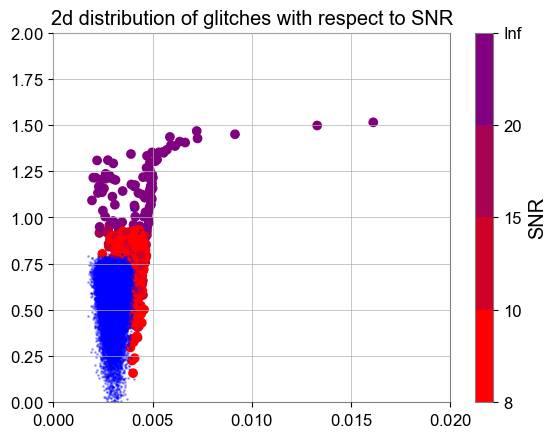

In [373]:
x = ReconstructedError_glitch_output_200d
y = np.log10(ReconstructedError_glitch_output_1d * 10**9)/9

x_train = ReconstructedError_train_output_200d
y_train = np.log10(ReconstructedError_train_output_1d * 10**9)/9





bounds = [8,10,15,20,9000]
cmap = ListedColormap([(0.5,0,0.5),
                        (0.66,0,0.32),
                        (0.82,0,0.16),
                        (1,0,0)][::-1])

norm = BoundaryNorm(bounds, cmap.N)

scatter = plt.scatter(x,y,c = data_glitch_snr,cmap = cmap, norm = norm)

cbar = plt.colorbar(scatter, ticks=bounds, format='%.1f')
cbar.set_label('SNR')
cbar.ax.set_yticklabels(['8', '10', '15', '20', 'Inf'])


plt.scatter(x_train, y_train, c = 'blue', alpha = 0.3,s=1)
plt.xlim(0,0.02)
plt.ylim(0,2)

plt.title('2d distribution of glitches with respect to SNR')

# plt.colorbar()

(0.0, 2.0)

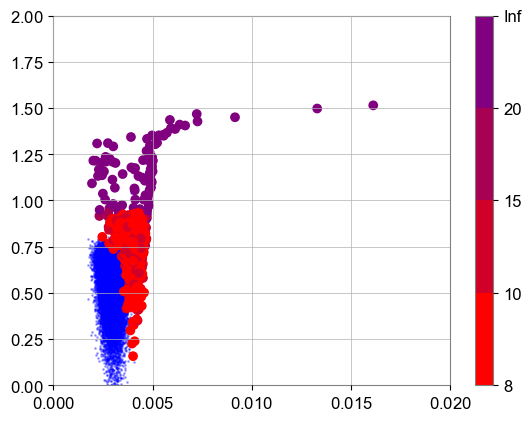

In [368]:
x = ReconstructedError_glitch_output_200d
y = np.log10(ReconstructedError_glitch_output_1d * 10**9)/9

x_train = ReconstructedError_train_output_200d
y_train = np.log10(ReconstructedError_train_output_1d * 10**9)/9



plt.scatter(x_train, y_train, c = 'blue', alpha = 0.3,s=1)

bounds = [8,10,15,20,9000]
cmap = ListedColormap([(0.5,0,0.5),
                        (0.66,0,0.32),
                        (0.82,0,0.16),
                        (1,0,0)][::-1])

norm = BoundaryNorm(bounds, cmap.N)

scatter = plt.scatter(x,y,c = data_glitch_snr,cmap = cmap, norm = norm)

cbar = plt.colorbar(scatter, ticks=bounds, format='%.1f')
cbar.ax.set_yticklabels(['8', '10', '15', '20', 'Inf'])
plt.xlim(0,0.02)
plt.ylim(0,2)

# plt.colorbar()

### 2d -> 1d geometric mean ROC analysis

In [451]:
geometric_mean_train_same_weight = np.sqrt(ReconstructedError_train_output_200d * ReconstructedError_train_output_1d)
geometric_mean_test_same_weight = np.sqrt(ReconstructedError_test_output_200d * ReconstructedError_test_output_1d)
geometric_mean_bbh_same_weight = np.sqrt(ReconstructedError_injected_output_200d * ReconstructedError_injected_output_1d)

(array([4.99824974e+02, 4.69570436e+02, 4.49317398e+02,
        4.50067510e+02, 4.39065860e+02, 3.78806821e+02,
        3.56803521e+02, 3.34050108e+02, 2.89293394e+02,
        2.45786868e+02, 2.13782067e+02, 1.85277792e+02,
        1.47022053e+02, 1.22518378e+02, 9.97649647e+01,
        8.15122268e+01, 5.60084013e+01, 4.57568635e+01,
        4.12561884e+01, 2.57538631e+01, 1.92528879e+01,
        1.55023253e+01, 1.02515377e+01, 9.25138771e+00,
        3.50052508e+00, 5.25078762e+00, 2.25033755e+00,
        1.00015002e+00, 1.00015002e+00, 7.50112517e-01,
        2.50037506e-01, 0.00000000e+00, 0.00000000e+00,
        2.50037506e-01, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.000000

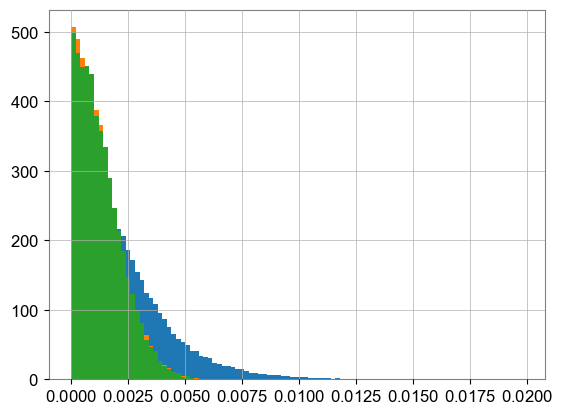

In [452]:
bin_scheme_geometric_mean = np.arange(0, 0.02, 0.02/100)
plt.hist(geometric_mean_bbh_same_weight, bins = bin_scheme_geometric_mean, density=True)
plt.hist(geometric_mean_train_same_weight, bins = bin_scheme_geometric_mean, density=True)
plt.hist(geometric_mean_test_same_weight, bins = bin_scheme_geometric_mean, density=True)

(array([4.99824974e+02, 4.69570436e+02, 4.49317398e+02,
        4.50067510e+02, 4.39065860e+02, 3.78806821e+02,
        3.56803521e+02, 3.34050108e+02, 2.89293394e+02,
        2.45786868e+02, 2.13782067e+02, 1.85277792e+02,
        1.47022053e+02, 1.22518378e+02, 9.97649647e+01,
        8.15122268e+01, 5.60084013e+01, 4.57568635e+01,
        4.12561884e+01, 2.57538631e+01, 1.92528879e+01,
        1.55023253e+01, 1.02515377e+01, 9.25138771e+00,
        3.50052508e+00, 5.25078762e+00, 2.25033755e+00,
        1.00015002e+00, 1.00015002e+00, 7.50112517e-01,
        2.50037506e-01, 0.00000000e+00, 0.00000000e+00,
        2.50037506e-01, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.000000

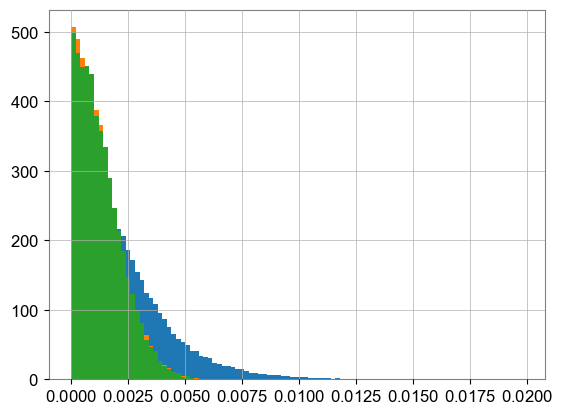

In [424]:
bin_scheme_geometric_mean = np.arange(0, 0.02, 0.02/100)
plt.hist(geometric_mean_bbh_same_weight, bins = bin_scheme_geometric_mean, density=True)
plt.hist(geometric_mean_train_same_weight, bins = bin_scheme_geometric_mean, density=True)
plt.hist(geometric_mean_test_same_weight, bins = bin_scheme_geometric_mean, density=True)

In [453]:
FPR_list = np.logspace(-3,0,30)

In [454]:
TPR_list_test = upperTPRFPRcalc(geometric_mean_train_same_weight.flatten(), geometric_mean_test_same_weight.flatten(), FPR_list)
TPR_list_BBH = upperTPRFPRcalc(geometric_mean_train_same_weight.flatten(), geometric_mean_bbh_same_weight.flatten(), FPR_list)
# TPR_list_SG = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_sinegaussian_output_200d.flatten(), FPR_list)
# TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_real_output_100d.flatten(), FPR_list)
# TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_fake_output_100d.flatten(), FPR_list)

Text(0.5, 1.0, 'Geometric mean ROC curve, network structure 201-40-201, normfactor = 0, Tw bkgset, Tw bbhset')

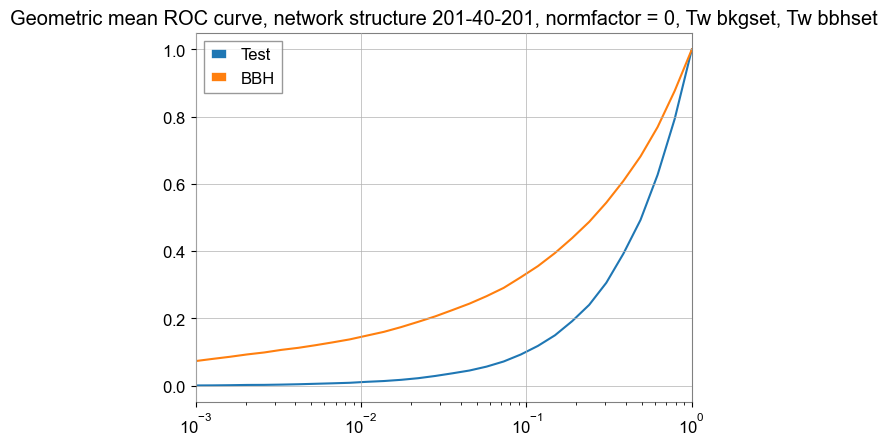

In [455]:
plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')
# plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG')
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('Geometric mean ROC curve, network structure 201-40-201, normfactor = 0, Tw bkgset, Tw bbhset')

Text(0.5, 1.0, 'Geometric mean ROC curve, network structure 201-40-201, normfactor = 0, Tw bkgset, Tw bbhset')

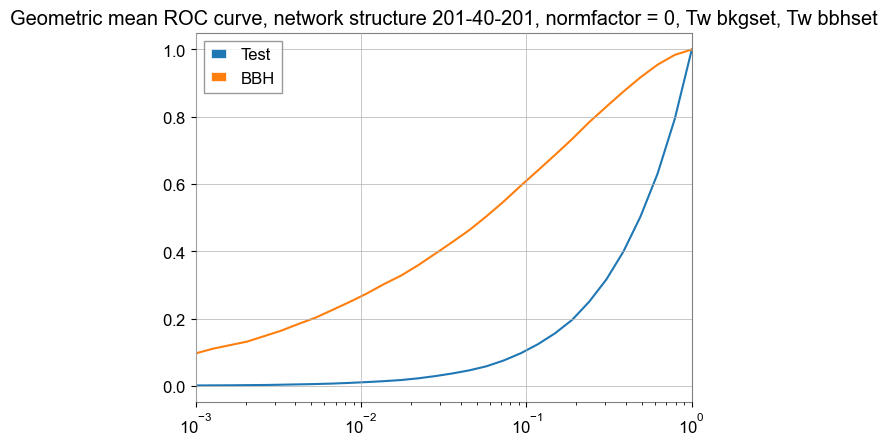

In [425]:
plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')
# plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG')
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('Geometric mean ROC curve, network structure 201-40-201, normfactor = 0, Tw bkgset, Tw bbhset')

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_5104\1843562771.py:119: DeprecationWarning: 'scipy.integrate.trapz' is deprecated in favour of 'scipy.integrate.trapezoid' and will be removed in SciPy 1.14.0
  AUC_list_BBH.append(integrate.trapz(TPR_list_BBH, FPR_list))


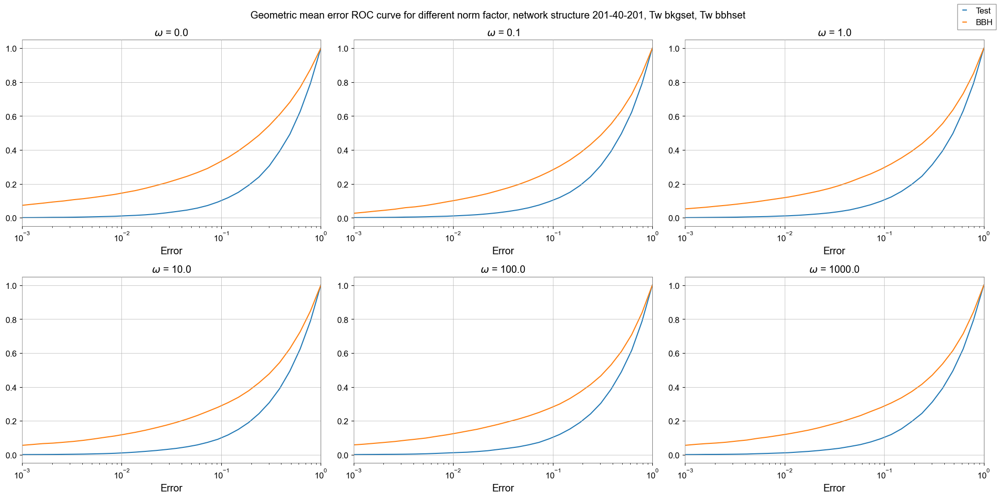

In [443]:
AUC_list_BBH = []

model_list = ['model_201-40-201_0_twset.pt', 'model_201-40-201_0.1_twdataset.pt', 'model_201-40-201_1.0_twdataset.pt', 'model_201-40-201_10.0_twdataset.pt', 'model_201-40-201_100.0_twdataset.pt', 'model_201-40-201_1000.0_twdataset.pt']

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

legend_lines = []

for i in range(6):
    TPR_test_list = []
    TPR_BBH_list = []
    TPR_SG_list = []
    
    model = torch.load('../model_cached/' + model_list[i])
    
    if i == -1:
        trainData = trainData_ini[:,:200]
        testData = testData_ini[:,:200]
        bbhData = bbhData_ini[:,:200]
        sgData = sgData_ini[:,:200]
    else:
        trainData = trainData_ini
        testData = testData_ini
        bbhData = bbhData_ini
        sgData = sgData_ini
    
    _, decodedTestdata = model(trainData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_train = decodedTestdata.detach().numpy()
    ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
    MSE_train = ReconstructedError_train.mean()

    X_train_output = X_train[:, :200]
    reconstructedData_train_output = reconstructedData_train[:, :200]

    ReconstructedError_train_output_200d = np.mean((trainData.numpy()[:, :200] - reconstructedData_train[:, :200])**2, axis = 1)
    MSE_train_output_200d = ReconstructedError_train_output_200d.mean()

    ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
    MSE_train_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(testData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
    MSE_test = ReconstructedError_test.mean()

    X_test_output = X_test[:, :200]
    reconstructedData_test_output = reconstructedData_test[:, :200]

    ReconstructedError_test_output_200d = np.mean((testData.numpy()[:, :200] - reconstructedData_test[:, :200])**2, axis = 1)
    MSE_test_output_200d = ReconstructedError_test_output_200d.mean()

    ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
    MSE_test_output_1d = ReconstructedError_train_output_1d.mean()
    
    _, decodedTestdata = model(bbhData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
    MSE_injected = ReconstructedError_injected.mean()

    ReconstructedError_injected_output_200d = np.mean((bbhData.numpy()[:, :200] - reconstructedData_injected[:, :200])**2, axis = 1)
    MSE_injected_output_200d = ReconstructedError_injected_output_200d.mean()

    ReconstructedError_injected_output_1d = (bbhData.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
    MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()
    
    # data_sinegaussian_tensored = sgData
    _, decodedTestdata = model(sgData)
    decodedTestdata = decodedTestdata.double()
    reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
    ReconstructedError_sinegaussian = torch.mean((sgData - reconstructedData_sinegaussian)**2,dim=1)
    MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

    ReconstructedError_sinegaussian_output_200d = np.mean((sgData.numpy()[:, :200] - reconstructedData_sinegaussian[:, :200])**2, axis = 1)
    MSE_sinegaussian_output_200d = ReconstructedError_sinegaussian_output_200d.mean()

    ReconstructedError_sinegaussian_output_1d = (sgData.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
    MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()
    
    geometric_mean_train_same_weight = np.sqrt(ReconstructedError_train_output_200d * ReconstructedError_train_output_1d)
    geometric_mean_test_same_weight = np.sqrt(ReconstructedError_test_output_200d * ReconstructedError_test_output_1d)
    geometric_mean_bbh_same_weight = np.sqrt(ReconstructedError_injected_output_200d * ReconstructedError_injected_output_1d)
    
    
    TPR_list_test = upperTPRFPRcalc(geometric_mean_train_same_weight.flatten(), geometric_mean_test_same_weight.flatten(), FPR_list)
    TPR_list_BBH = upperTPRFPRcalc(geometric_mean_train_same_weight.flatten(), geometric_mean_bbh_same_weight.flatten(), FPR_list)
    # TPR_list_SG = upperTPRFPRcalc(geometric_mean_train_same_weight.flatten(), geometric_mean_train_same_weight.flatten(), FPR_list)
    

    # hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_200d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])
    # hist_bunch_noise = hist

    # for FPR in FPR_list:
    #     mask = FPR_mask(hist_bunch_noise, FPR)

    #     hist_test, _, _ = np.histogram2d(ReconstructedError_test_output_200d,ReconstructedError_test_output_1d, bins=[bins_x, bins_y])
    #     hist_BBH, _, _ = np.histogram2d(ReconstructedError_injected_output_200d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])
    #     hist_SG, _, _ = np.histogram2d(ReconstructedError_sinegaussian_output_200d,ReconstructedError_sinegaussian_output_1d, bins=[bins_x, bins_y])
    #     # hist_Glitches, _, _ = np.histogram2d(ReconstructedError_glitches_fake_output_100d,ReconstructedError_glitches_fake_output_1d, bins=[bins_x, bins_y])
    #     # hist_Glitches_real, _, _ = np.histogram2d(ReconstructedError_glitches_real_output_100d,ReconstructedError_glitches_real_output_1d, bins=[bins_x, bins_y])

    #     _, TPR_test = Mask_and_TPR_computing(hist_test, mask)
    #     _, TPR_BBH = Mask_and_TPR_computing(hist_BBH, mask)
    #     _, TPR_SG = Mask_and_TPR_computing(hist_SG, mask)
    #     # _, TPR_Glitches = Mask_and_TPR_computing(hist_Glitches, mask)
    #     # _, TPR_Glitches_real = Mask_and_TPR_computing(hist_Glitches_real, mask)

    #     TPR_test_list.append(TPR_test)
    #     TPR_BBH_list.append(TPR_BBH)
    #     TPR_SG_list.append(TPR_SG)
        # TPR_Glitches_list.append(TPR_Glitches)
        # TPR_Glitches_real_list.append(TPR_Glitches_real)

    AUC_list_BBH.append(integrate.trapz(TPR_list_BBH, FPR_list))

    # plt.figure(figsize=(12, 9))
    # axes[i//3, i % 3].plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
    # axes[i//3, i % 3].plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
    # axes[i//3, i % 3].plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
    # axes[i//3, i % 3].plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
    # # plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
    # # plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


    # axes[i//3, i % 3].axvline(x = MSE_train_output_200d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
    # axes[i//3, i % 3].axvline(x = MSE_test_output_200d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
    # axes[i//3, i % 3].axvline(x = MSE_injected_output_200d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
    # axes[i//3, i % 3].axvline(x = MSE_sinegaussian_output_200d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
    # plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
    # plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')
    
    axes[i//3, i % 3].plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
    axes[i//3, i % 3].plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')
    # axes[i//3, i % 3].plot(FPR_list, TPR_SG_list, color = colors[2], label = 'SG')
    # axes[i//3, i % 3].plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
    # axes[i//3, i % 3].plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

    axes[i//3, i % 3].set_xlim(1e-3, 1e0)
    axes[i//3, i % 3].set_xscale('log')
    axes[i//3, i % 3].set_yscale('linear')
    # plt.legend()
    # plt.title('ROC curve for 101-20-101 DNN AE, bunch, pattern error, norm factor = 0.1, upper side')


    # axes[i//3, i % 3].set_xlim(0, 0.01)
    axes[i//3, i % 3].set_xlabel('Error')
    axes[i//3, i % 3].set_title('$\omega$ = ' + str(np.insert(omega_list,0,0)[i]))
    # .show()
    
    # axes[i//3, i % 3].plot()

# legend_lines.append(Line2D([], [], color=colors[0], label='Training sample'))
# legend_lines.append(Line2D([], [], color=colors[1], label='Testing sample'))
# legend_lines.append(Line2D([], [], color=colors[2], label='Signal sample - BBH'))
# legend_lines.append(Line2D([], [], color=colors[3], label='Signal sample - sinegaussian'))

# # 创建一个空白的图例子图
# legend_fig = plt.figure()

# # 将线条添加到图例中
# legend_ax = legend_fig.add_subplot(111)
# legend_ax.legend(handles=legend_lines, loc='center')

# # 添加图例到图例子图中
# # legend_fig.legend(handles=legend_ax.get_legend_handles_labels()[0], loc='upper right', bbox_to_anchor=(1.2, 1))

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
plt.suptitle('Geometric mean error ROC curve for different norm factor, network structure 201-40-201, Tw bkgset, Tw bbhset')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  
    
    
    

Text(0.5, 1.0, 'AUC curve for 2d anomaly detection using different norm factor')

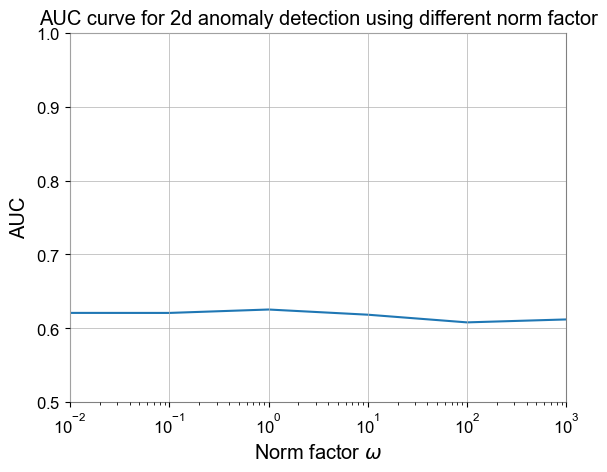

In [444]:
plt.plot(np.insert(omega_list,0,0), AUC_list_BBH)
plt.xlim(1e-2, 1000)
plt.ylim(0.5, 1)
plt.xscale('log')
plt.xlabel('Norm factor $\omega$')
plt.ylabel('AUC')

plt.title('AUC curve for 2d anomaly detection using different norm factor')